In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import missingno as msno
from sklearn import metrics

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# **CICIoT2023**

In [ ]:
# Load the dataset with low_memory=False to suppress the warning
# Ensure the CSV file is located at the specified path
CICIoT2023 = pd.read_csv('/content/drive/MyDrive/part-00001-363d1ba3-8ab5-4f96-bc25-4d5862db7cb9-c000.csv')

# Print the shape of the DataFrame
shape =CICIoT2023.shape
print(shape)


(218805, 47)


In [ ]:
df_Edge_IIoTset=CICIoT2023

In [ ]:
# Display the first few rows of dataset to get an overview of the data
df_Edge_IIoTset.head()

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
0,0.000000,53.46,5.94,63.36,1.145800,1.145800,0.0,0.0,1.0,0.0,...,0.040218,54.06,8.309402e+07,9.5,10.393232,0.057331,0.054789,0.03,141.55,DDoS-SYN_Flood
1,0.000000,54.00,6.00,64.00,1.027823,1.027823,0.0,0.0,0.0,0.0,...,0.000000,54.00,8.307159e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-TCP_Flood
2,2.204616,93.96,6.00,64.00,0.671213,0.671213,0.0,0.0,1.0,0.0,...,0.000000,54.00,8.336561e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-SynonymousIP_Flood
3,0.053618,12497.00,17.00,64.00,47647.897124,47647.897124,0.0,0.0,0.0,0.0,...,0.000000,50.00,8.310693e+07,9.5,10.000000,0.000000,0.000000,0.00,141.55,DDoS-UDP_Flood
4,0.000000,0.00,1.00,64.00,0.667744,0.667744,0.0,0.0,0.0,0.0,...,0.000000,42.00,8.314933e+07,9.5,9.165151,0.000000,0.000000,0.00,141.55,DDoS-ICMP_Flood


In [ ]:
# Count the number of occurrences for each label in the dataset
print(df_Edge_IIoTset.groupby("label").size())

label
Backdoor_Malware              18
BenignTraffic               5200
BrowserHijacking              30
CommandInjection              26
DDoS-ACK_Fragmentation      1384
DDoS-HTTP_Flood              127
DDoS-ICMP_Flood            33529
DDoS-ICMP_Fragmentation     2132
DDoS-PSHACK_Flood          19373
DDoS-RSTFINFlood           19032
DDoS-SYN_Flood             19235
DDoS-SlowLoris               100
DDoS-SynonymousIP_Flood    16798
DDoS-TCP_Flood             20964
DDoS-UDP_Flood             25343
DDoS-UDP_Fragmentation      1392
DNS_Spoofing                 827
DictionaryBruteForce          57
DoS-HTTP_Flood               347
DoS-SYN_Flood               9314
DoS-TCP_Flood              12326
DoS-UDP_Flood              15500
MITM-ArpSpoofing            1432
Mirai-greeth_flood          4728
Mirai-greip_flood           3606
Mirai-udpplain              4308
Recon-HostDiscovery          652
Recon-OSScan                 425
Recon-PingSweep               10
Recon-PortScan               399
SqlI

In [ ]:
df_Edge_IIoTset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218805 entries, 0 to 218804
Data columns (total 47 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   flow_duration    218805 non-null  float64
 1   Header_Length    218805 non-null  float64
 2   Protocol Type    218805 non-null  float64
 3   Duration         218805 non-null  float64
 4   Rate             218805 non-null  float64
 5   Srate            218805 non-null  float64
 6   Drate            218805 non-null  float64
 7   fin_flag_number  218805 non-null  float64
 8   syn_flag_number  218805 non-null  float64
 9   rst_flag_number  218805 non-null  float64
 10  psh_flag_number  218805 non-null  float64
 11  ack_flag_number  218805 non-null  float64
 12  ece_flag_number  218805 non-null  float64
 13  cwr_flag_number  218805 non-null  float64
 14  ack_count        218805 non-null  float64
 15  syn_count        218805 non-null  float64
 16  fin_count        218805 non-null  floa

In [ ]:
df_Edge_IIoTset.head()
print('Dataframe shape: ', shape)
print('Number of rows: ', shape[0])
print('Number of columns: ', shape[1])
#df.shape

Dataframe shape:  (218805, 47)
Number of rows:  218805
Number of columns:  47


In [ ]:
# Fill all missing values with 0
df_Edge_IIoTset = df_Edge_IIoTset.fillna(0)

# Verify again if there are any missing values
print(df_Edge_IIoTset.isnull().sum())  # This should display 0 for all columns


flow_duration      0
Header_Length      0
Protocol Type      0
Duration           0
Rate               0
Srate              0
Drate              0
fin_flag_number    0
syn_flag_number    0
rst_flag_number    0
psh_flag_number    0
ack_flag_number    0
ece_flag_number    0
cwr_flag_number    0
ack_count          0
syn_count          0
fin_count          0
urg_count          0
rst_count          0
HTTP               0
HTTPS              0
DNS                0
Telnet             0
SMTP               0
SSH                0
IRC                0
TCP                0
UDP                0
DHCP               0
ARP                0
ICMP               0
IPv                0
LLC                0
Tot sum            0
Min                0
Max                0
AVG                0
Std                0
Tot size           0
IAT                0
Number             0
Magnitue           0
Radius             0
Covariance         0
Variance           0
Weight             0
label              0
dtype: int64


In [ ]:
import pandas as pd

# Adjust display settings to show all columns
pd.set_option('display.max_rows', None)

# Count the number of null values in each column
null_counts = df_Edge_IIoTset.isnull().sum()

# Print the null counts for each column
print(null_counts)

# Reset the display settings if needed
pd.reset_option('display.max_rows')


flow_duration      0
Header_Length      0
Protocol Type      0
Duration           0
Rate               0
Srate              0
Drate              0
fin_flag_number    0
syn_flag_number    0
rst_flag_number    0
psh_flag_number    0
ack_flag_number    0
ece_flag_number    0
cwr_flag_number    0
ack_count          0
syn_count          0
fin_count          0
urg_count          0
rst_count          0
HTTP               0
HTTPS              0
DNS                0
Telnet             0
SMTP               0
SSH                0
IRC                0
TCP                0
UDP                0
DHCP               0
ARP                0
ICMP               0
IPv                0
LLC                0
Tot sum            0
Min                0
Max                0
AVG                0
Std                0
Tot size           0
IAT                0
Number             0
Magnitue           0
Radius             0
Covariance         0
Variance           0
Weight             0
label              0
dtype: int64


In [ ]:
# Display the duplicate rows
duplicate_rows = df_Edge_IIoTset[df_Edge_IIoTset.duplicated()]
print(duplicate_rows)


Empty DataFrame
Columns: [flow_duration, Header_Length, Protocol Type, Duration, Rate, Srate, Drate, fin_flag_number, syn_flag_number, rst_flag_number, psh_flag_number, ack_flag_number, ece_flag_number, cwr_flag_number, ack_count, syn_count, fin_count, urg_count, rst_count, HTTP, HTTPS, DNS, Telnet, SMTP, SSH, IRC, TCP, UDP, DHCP, ARP, ICMP, IPv, LLC, Tot sum, Min, Max, AVG, Std, Tot size, IAT, Number, Magnitue, Radius, Covariance, Variance, Weight, label]
Index: []

[0 rows x 47 columns]


In [ ]:

# Remove duplicate rows and keep the first occurrence
df_Edge_IIoTset_cleaned = df_Edge_IIoTset.drop_duplicates()


In [ ]:
df_Edge_IIoTset_cleaned[df_Edge_IIoTset_cleaned.duplicated()].shape

(0, 47)

In [ ]:

df_Edge_IIoTset_cleaned.shape

(218805, 47)

In [ ]:


df_Edge_IIoTset_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 218805 entries, 0 to 218804
Data columns (total 47 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   flow_duration    218805 non-null  float64
 1   Header_Length    218805 non-null  float64
 2   Protocol Type    218805 non-null  float64
 3   Duration         218805 non-null  float64
 4   Rate             218805 non-null  float64
 5   Srate            218805 non-null  float64
 6   Drate            218805 non-null  float64
 7   fin_flag_number  218805 non-null  float64
 8   syn_flag_number  218805 non-null  float64
 9   rst_flag_number  218805 non-null  float64
 10  psh_flag_number  218805 non-null  float64
 11  ack_flag_number  218805 non-null  float64
 12  ece_flag_number  218805 non-null  float64
 13  cwr_flag_number  218805 non-null  float64
 14  ack_count        218805 non-null  float64
 15  syn_count        218805 non-null  float64
 16  fin_count        218805 non-null  floa

In [ ]:
df_Edge_IIoTset_cleaned.head()

,flow_duration,Header_Length,Protocol Type,Duration,Rate,Srate,Drate,fin_flag_number,syn_flag_number,rst_flag_number,...,Std,Tot size,IAT,Number,Magnitue,Radius,Covariance,Variance,Weight,label
0,0.000000,53.46,5.94,63.36,1.145800,1.145800,0.0,0.0,1.0,0.0,...,0.040218,54.06,8.309402e+07,9.5,10.393232,0.057331,0.054789,0.03,141.55,DDoS-SYN_Flood
1,0.000000,54.00,6.00,64.00,1.027823,1.027823,0.0,0.0,0.0,0.0,...,0.000000,54.00,8.307159e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-TCP_Flood
2,2.204616,93.96,6.00,64.00,0.671213,0.671213,0.0,0.0,1.0,0.0,...,0.000000,54.00,8.336561e+07,9.5,10.392305,0.000000,0.000000,0.00,141.55,DDoS-SynonymousIP_Flood
3,0.053618,12497.00,17.00,64.00,47647.897124,47647.897124,0.0,0.0,0.0,0.0,...,0.000000,50.00,8.310693e+07,9.5,10.000000,0.000000,0.000000,0.00,141.55,DDoS-UDP_Flood
4,0.000000,0.00,1.00,64.00,0.667744,0.667744,0.0,0.0,0.0,0.0,...,0.000000,42.00,8.314933e+07,9.5,9.165151,0.000000,0.000000,0.00,141.55,DDoS-ICMP_Flood


In [ ]:
df = df_Edge_IIoTset_cleaned

In [ ]:
print(df_Edge_IIoTset_cleaned.groupby("label").size())

label
Backdoor_Malware              18
BenignTraffic               5200
BrowserHijacking              30
CommandInjection              26
DDoS-ACK_Fragmentation      1384
DDoS-HTTP_Flood              127
DDoS-ICMP_Flood            33529
DDoS-ICMP_Fragmentation     2132
DDoS-PSHACK_Flood          19373
DDoS-RSTFINFlood           19032
DDoS-SYN_Flood             19235
DDoS-SlowLoris               100
DDoS-SynonymousIP_Flood    16798
DDoS-TCP_Flood             20964
DDoS-UDP_Flood             25343
DDoS-UDP_Fragmentation      1392
DNS_Spoofing                 827
DictionaryBruteForce          57
DoS-HTTP_Flood               347
DoS-SYN_Flood               9314
DoS-TCP_Flood              12326
DoS-UDP_Flood              15500
MITM-ArpSpoofing            1432
Mirai-greeth_flood          4728
Mirai-greip_flood           3606
Mirai-udpplain              4308
Recon-HostDiscovery          652
Recon-OSScan                 425
Recon-PingSweep               10
Recon-PortScan               399
SqlI

In [ ]:
df_TON_IOT_cleaned =df_Edge_IIoTset_cleaned

In [ ]:
# Separate the features (X) from the target variable (y)
X_TON_IOT = df_TON_IOT_cleaned.drop('label', axis = 1)
y_TON_IOT = df_TON_IOT_cleaned['label']
X_TON_IOT.shape, y_TON_IOT.shape

((218805, 46), (218805,))

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
# Split the dataset into training and testing sets
X_TON_IOT_train, X_TON_IOT_test,y_TON_IOT_train, y_TON_IOT_test = train_test_split(X_TON_IOT, y_TON_IOT, test_size=0.2, random_state = 1337
)


In [ ]:
# Display the count of each class in the training set
y_TON_IOT_train.value_counts()

,count
label,
DDoS-ICMP_Flood,26892
DDoS-UDP_Flood,20247
DDoS-TCP_Flood,16747
DDoS-PSHACK_Flood,15468
DDoS-SYN_Flood,15409
DDoS-RSTFINFlood,15178
DDoS-SynonymousIP_Flood,13465
DoS-UDP_Flood,12422
DoS-TCP_Flood,9843


In [ ]:
from imblearn.over_sampling import SMOTE

# Apply SMOTE for class balancing

smt = SMOTE(random_state=42, k_neighbors=2) # Set k_neighbors to be less than the smallest class size
X_TON_IOT_train, y_TON_IOT_train = smt.fit_resample(X_TON_IOT_train, y_TON_IOT_train)

In [ ]:
X_TON_IOT_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 914328 entries, 0 to 914327
Data columns (total 46 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   flow_duration    914328 non-null  float64
 1   Header_Length    914328 non-null  float64
 2   Protocol Type    914328 non-null  float64
 3   Duration         914328 non-null  float64
 4   Rate             914328 non-null  float64
 5   Srate            914328 non-null  float64
 6   Drate            914328 non-null  float64
 7   fin_flag_number  914328 non-null  float64
 8   syn_flag_number  914328 non-null  float64
 9   rst_flag_number  914328 non-null  float64
 10  psh_flag_number  914328 non-null  float64
 11  ack_flag_number  914328 non-null  float64
 12  ece_flag_number  914328 non-null  float64
 13  cwr_flag_number  914328 non-null  float64
 14  ack_count        914328 non-null  float64
 15  syn_count        914328 non-null  float64
 16  fin_count        914328 non-null  floa

In [ ]:
y_TON_IOT_train.value_counts()

,count
label,
DDoS-ICMP_Flood,26892
DoS-TCP_Flood,26892
DDoS-RSTFINFlood,26892
DDoS-UDP_Flood,26892
DDoS-SYN_Flood,26892
DDoS-TCP_Flood,26892
BenignTraffic,26892
Recon-PortScan,26892
DoS-SYN_Flood,26892


In [ ]:
X_TON_IOT_train, X_TON_IOT_valid,y_TON_IOT_train, y_TON_IOT_valid = train_test_split(X_TON_IOT_train, y_TON_IOT_train, test_size=0.25, random_state = 1337
)

In [ ]:
y_TON_IOT_train.value_counts()

,count
label,
DictionaryBruteForce,20298
DoS-TCP_Flood,20261
DDoS-ACK_Fragmentation,20259
DDoS-RSTFINFlood,20246
Uploading_Attack,20245
DoS-SYN_Flood,20239
DDoS-SYN_Flood,20239
Mirai-udpplain,20224
Backdoor_Malware,20223


In [ ]:
y_TON_IOT_valid.value_counts()

,count
label,
BenignTraffic,6919
Mirai-greip_flood,6843
VulnerabilityScan,6823
SqlInjection,6814
CommandInjection,6805
XSS,6787
BrowserHijacking,6777
MITM-ArpSpoofing,6763
DNS_Spoofing,6762


In [ ]:

from sklearn.preprocessing import StandardScaler
# Initialize the StandardScaler for feature scaling
scaling = StandardScaler()
# Fit the scaler on the training data and transform it
X_TON_IOT_train = scaling.fit_transform(X_TON_IOT_train)
# Transform the validation data using the fitted scaler
X_TON_IOT_valid = scaling.transform(X_TON_IOT_valid)
# Transform the test data using the fitted scaler
X_TON_IOT_test = scaling.transform(X_TON_IOT_test)

In [ ]:
# Reshape data
print(X_TON_IOT_train.shape)
X_TON_IOT_train = X_TON_IOT_train.reshape(X_TON_IOT_train.shape[0], X_TON_IOT_train.shape[1], 1)
X_TON_IOT_valid = X_TON_IOT_valid.reshape(X_TON_IOT_valid.shape[0], X_TON_IOT_valid.shape[1], 1)
X_TON_IOT_test2 = X_TON_IOT_test.reshape(X_TON_IOT_test.shape[0], X_TON_IOT_test.shape[1], 1)
print(X_TON_IOT_train.shape)

(685746, 46)
(685746, 46, 1)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder

# Encode string labels into integers
label_encoder = LabelEncoder()
y_TON_IOT_train_encoded = label_encoder.fit_transform(y_TON_IOT_train)
y_TON_IOT_valid_encoded = label_encoder.transform(y_TON_IOT_valid)

# Convert the integer-encoded labels to one-hot encoded vectors
num_classes = len(label_encoder.classes_)
y_TON_IOT_train_one_hot = to_categorical(y_TON_IOT_train_encoded, num_classes=num_classes)
y_TON_IOT_valid_one_hot = to_categorical(y_TON_IOT_valid_encoded, num_classes=num_classes)

In [ ]:
print(num_classes)

34


#***lstm***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns
import time
import numpy as np

# Function to adjust the learning rate dynamically
def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float
# Define callbacks for training
lr_scheduler = LearningRateScheduler(scheduler)
model_checkpoint = ModelCheckpoint('best_model_lstm.keras', monitor='val_loss', save_best_only=True)

# LSTM model definition
model_lstm = Sequential()
model_lstm.add(LSTM(128, activation='tanh', return_sequences=True, input_shape=X_TON_IOT_train.shape[1:], kernel_regularizer=l2(0.01)))
model_lstm.add(BatchNormalization())
model_lstm.add(Dropout(0.5))
model_lstm.add(LSTM(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_lstm.add(BatchNormalization())
model_lstm.add(Dropout(0.5))
model_lstm.add(Dense(34, activation='softmax'))   # Output layer for multi-class classification
# Compile the model with Adam optimizer and categorical cross-entropy loss
model_lstm.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()
# Train the LSTM model
history_lstm = model_lstm.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                              validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                              callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


 # training_time
print(f"Le temps d'entraînement du modèle LSTM est de {training_time:.2f} secondes.")

Epoch 1/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 48s 68ms/step - accuracy: 0.5272 - loss: 2.2356 - val_accuracy: 0.7484 - val_loss: 0.6714 - learning_rate: 0.0010
Epoch 2/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 46s 68ms/step - accuracy: 0.7806 - loss: 0.5847 - val_accuracy: 0.8203 - val_loss: 0.4741 - learning_rate: 0.0010
Epoch 3/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - accuracy: 0.8108 - loss: 0.4882 - val_accuracy: 0.8273 - val_loss: 0.4220 - learning_rate: 0.0010
Epoch 4/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 81s 69ms/step - accuracy: 0.8269 - loss: 0.4390 - val_accuracy: 0.8484 - val_loss: 0.3923 - learning_rate: 0.0010
Epoch 5/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 82s 69ms/step - accuracy: 0.8389 - loss: 0.4063 - val_accuracy: 0.8513 - val_loss: 0.3624 - learning_rate: 0.0010
Epoch 6/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 47s 70ms/step - accuracy: 0.8446 - loss: 0.3880 - val_accuracy: 0.8525 - val_loss: 0.3488 - learning_rate: 0.0010
Epoch 7/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 81s 69ms/step - accuracy: 0.8

In [ ]:
import pickle
with open('history_lstm.pkl', 'wb') as file:
    pickle.dump(history_lstm.history, file)

7144/7144 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   0.999850  1.000000  0.999925      6669
           1   0.973909  0.922532  0.947525      6919
           2   0.998085  1.000000  0.999042      6777
           3   0.998972  1.000000  0.999486      6805
           4   0.996843  0.999698  0.998269      6633
           5   0.986780  0.994081  0.990417      6758
           6   0.999702  0.998067  0.998884      6727
           7   0.997773  0.999554  0.998663      6723
           8   0.999704  0.999704  0.999704      6749
           9   0.999849  0.999248  0.999548      6646
          10   0.574767  0.927852  0.709826      6653
          11   0.997612  1.000000  0.998804      6683
          12   0.951602  0.614984  0.747127      6714
          13   0.658524  0.947713  0.777086      6713
          14   0.775666  0.827683  0.800831      6755
          15   0.998954  0.999850  0.999402      6684


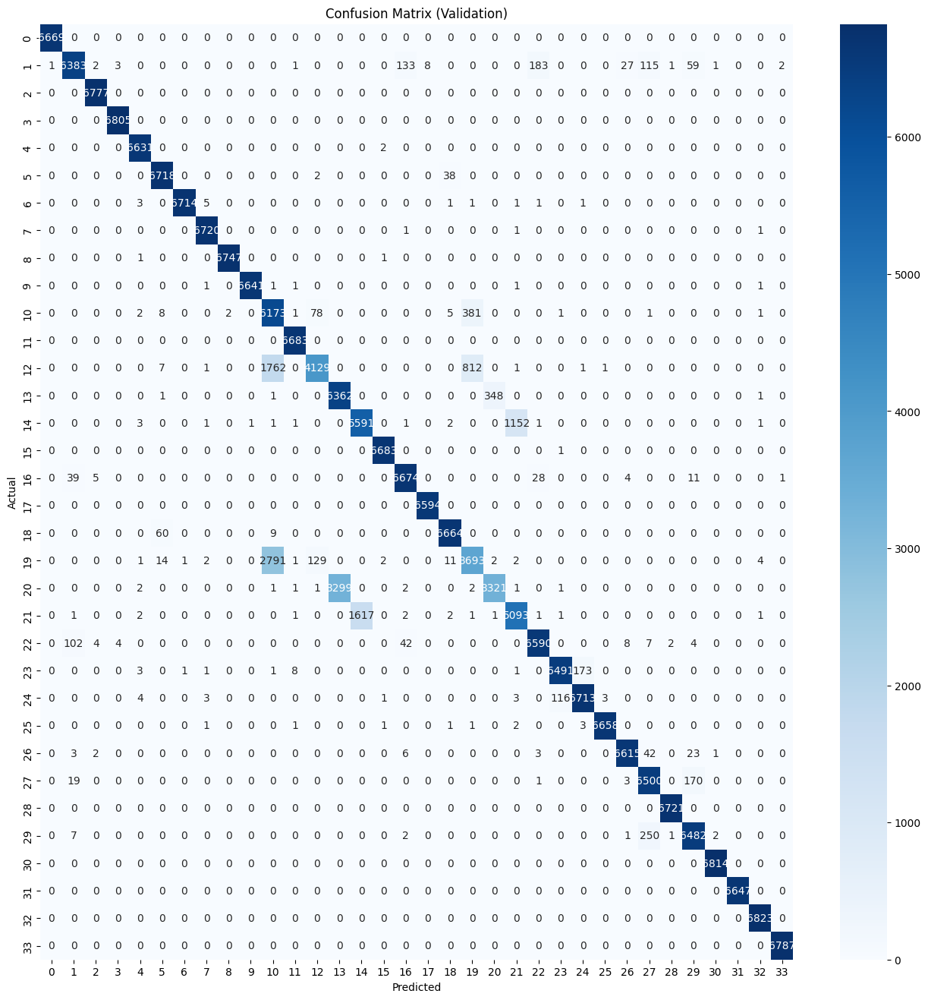

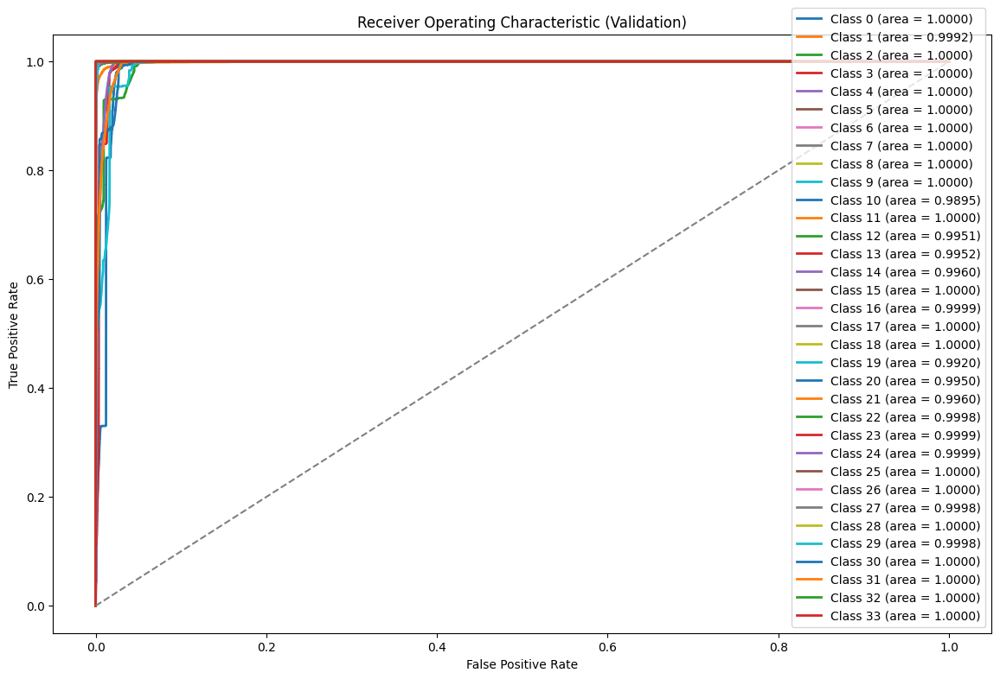

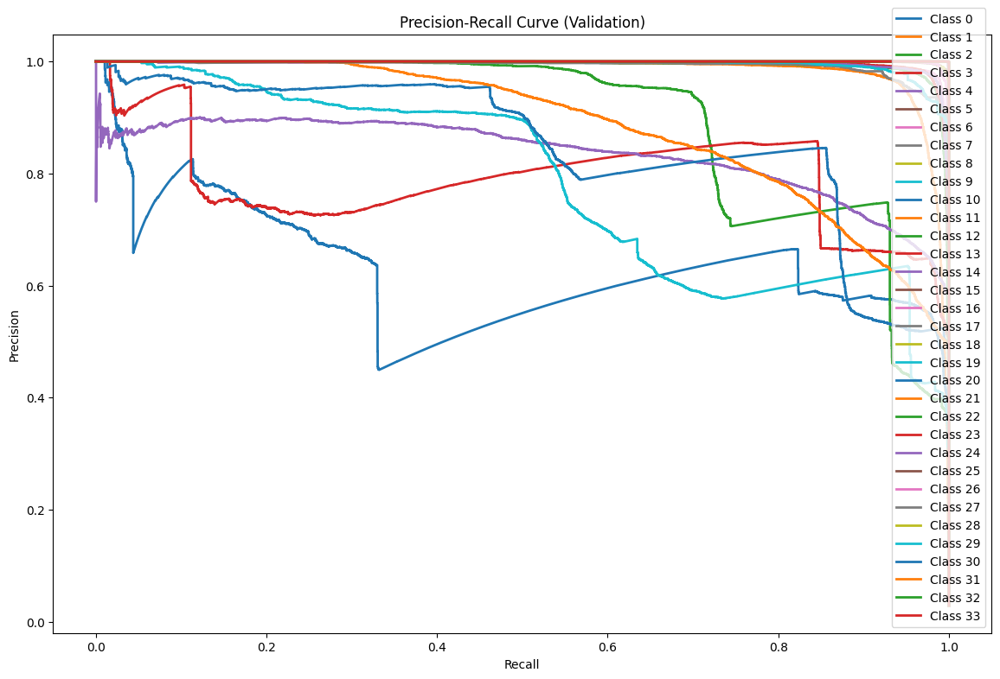


Metrics (Validation):
Accuracy: 93.754539%
Precision: 94.583835%
Recall: 93.726966%
F1 Score: 93.626486%
Loss: 0.154141
Elapsed Time: 23.61 seconds
1368/1368 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000         3
           1   0.792049  0.774676  0.783266      1003
           2   0.000000  0.000000  0.000000         8
           3   0.000000  0.000000  0.000000         2
           4   0.971530  0.992727  0.982014       275
           5   0.418605  0.720000  0.529412        25
           6   0.999849  0.999247  0.999548      6637
           7   0.969555  0.976415  0.972973       424
           8   0.998976  0.998976  0.998976      3905
           9   0.999740  0.998962  0.999351      3854
          10   0.679780  0.934919  0.787192      3826
          11   0.500000  0.450000  0.473684        20
          12   0.966245  0.618362  0.754116      3333
          13   0.759

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


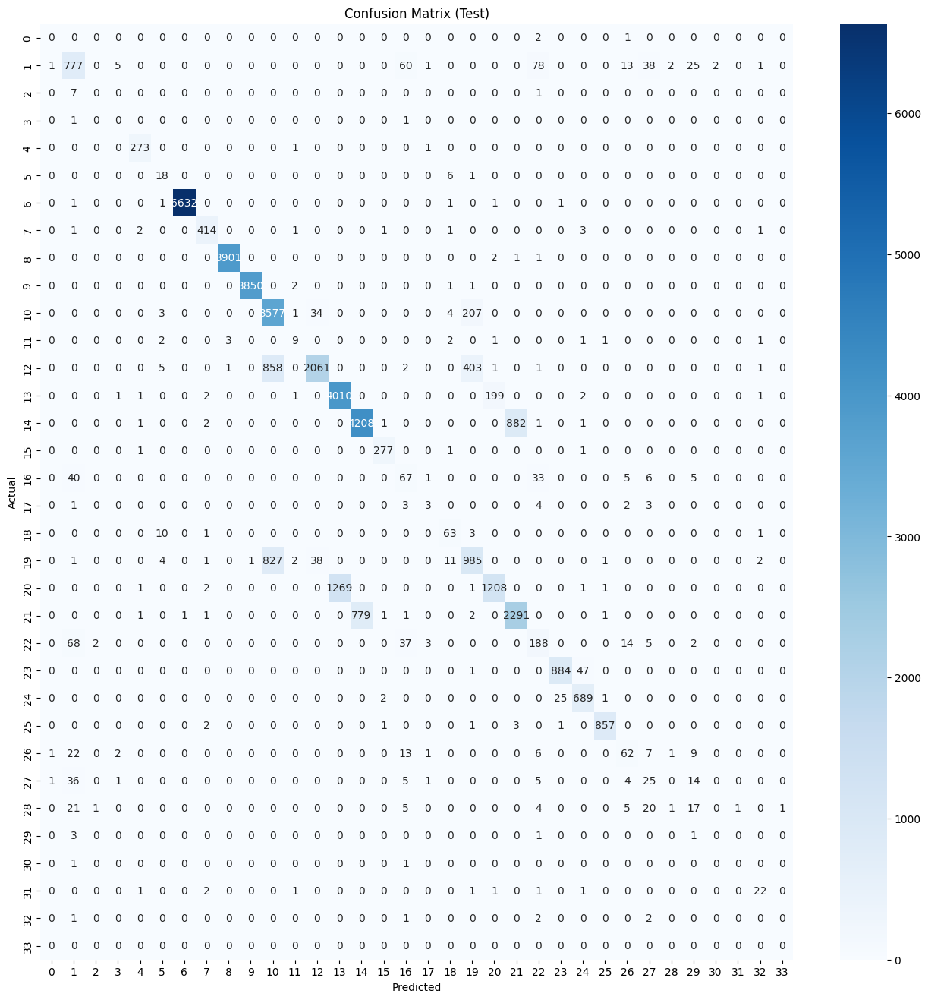

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


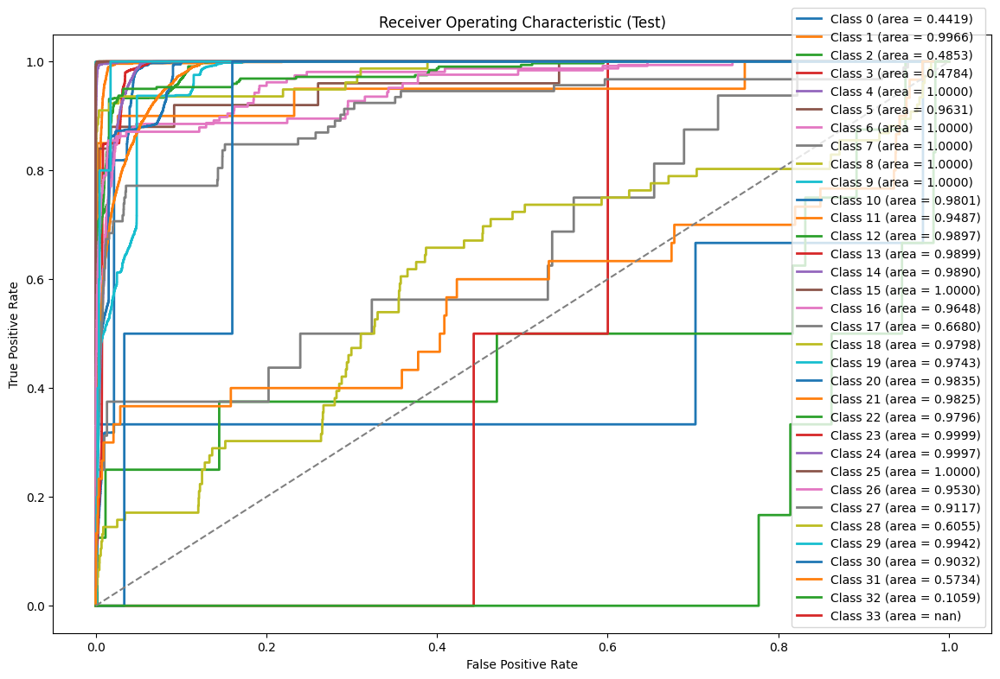

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


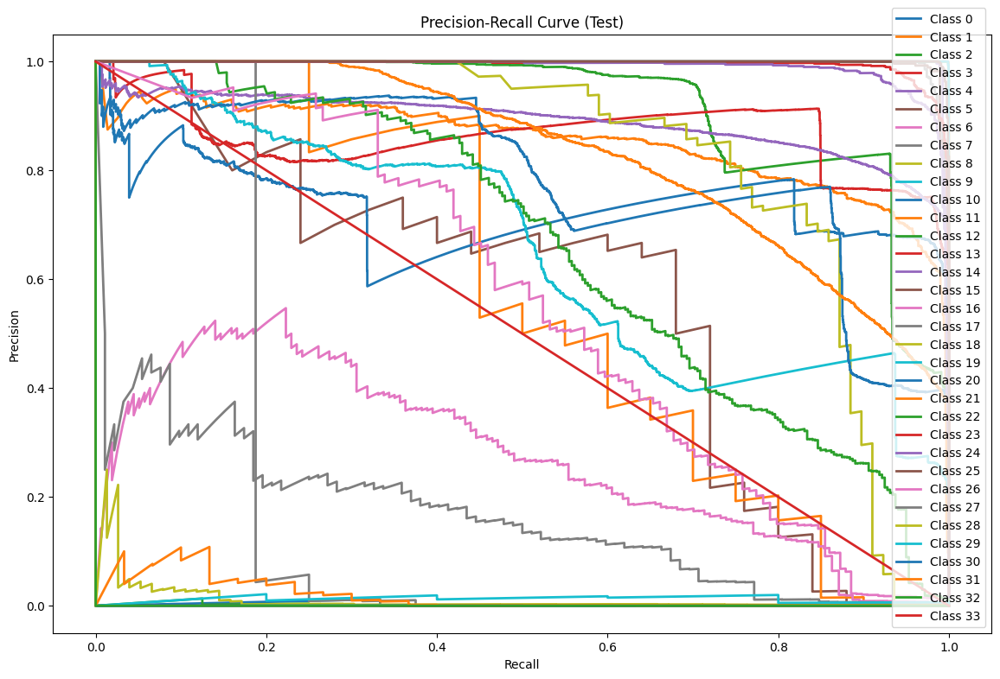

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Metrics (Test):
Accuracy: 85.306551%
Precision: 55.671297%
Recall: 55.539192%
F1 Score: 54.504826%
Loss: 0.491169
Elapsed Time: 4.31 seconds


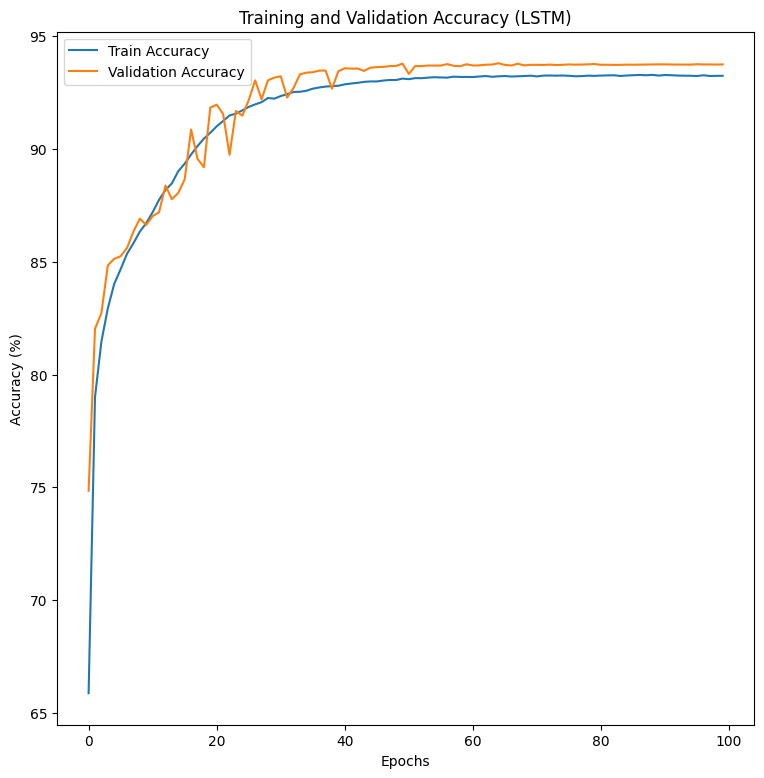

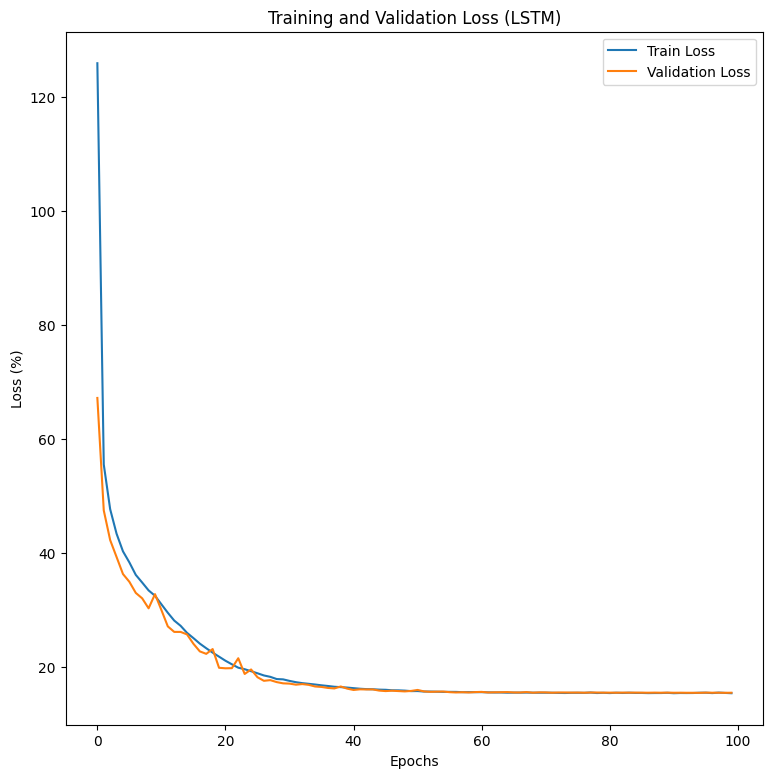

Epoch 1 - Train Loss: 125.8858%, Validation Loss: 67.14%, Train Accuracy: 65.87%, Validation Accuracy: 74.84%
Epoch 2 - Train Loss: 55.4733%, Validation Loss: 47.41%, Train Accuracy: 79.01%, Validation Accuracy: 82.03%
Epoch 3 - Train Loss: 47.6216%, Validation Loss: 42.20%, Train Accuracy: 81.47%, Validation Accuracy: 82.73%
Epoch 4 - Train Loss: 43.3172%, Validation Loss: 39.23%, Train Accuracy: 82.94%, Validation Accuracy: 84.84%
Epoch 5 - Train Loss: 40.2228%, Validation Loss: 36.24%, Train Accuracy: 84.02%, Validation Accuracy: 85.13%
Epoch 6 - Train Loss: 38.2827%, Validation Loss: 34.88%, Train Accuracy: 84.67%, Validation Accuracy: 85.25%
Epoch 7 - Train Loss: 36.0922%, Validation Loss: 32.93%, Train Accuracy: 85.36%, Validation Accuracy: 85.62%
Epoch 8 - Train Loss: 34.7505%, Validation Loss: 31.98%, Train Accuracy: 85.83%, Validation Accuracy: 86.34%
Epoch 9 - Train Loss: 33.3716%, Validation Loss: 30.23%, Train Accuracy: 86.34%, Validation Accuracy: 86.92%
Epoch 10 - Train L

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import label_binarize, LabelEncoder

import time

# Function to evaluate the model
def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)

    # Classification report
    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))

    # Confusion matrix
    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(16, 16))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()

    # Binarize the labels for ROC and precision-recall curve
    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))

    # ROC and AUC curves
    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()

    # Precision-recall curves
    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()

    # # Calculate classification metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")

# Label encoding for converting labels to integers
label_encoder = LabelEncoder()
y_TON_IOT_test2_encoded = label_encoder.fit_transform(y_TON_IOT_test)

# Convert the encoded labels to one-hot encoding
y_TON_IOT_test2_one_hot = tf.keras.utils.to_categorical(y_TON_IOT_test2_encoded, num_classes=num_classes)

# Evaluate on the validation set
evaluate_model(model_lstm, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes, dataset_name="Validation")

# Evaluate on the test set
evaluate_model(model_lstm, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes, dataset_name="Test")

# Plot the learning curvese
plt.figure(figsize=(9, 9))
plt.plot(np.array(history_lstm.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_lstm.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (LSTM)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_lstm.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_lstm.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (LSTM)')
plt.legend()
plt.show()

# # Display loss and accuracy for each epoch
for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_lstm.history['loss'],
                                                                      history_lstm.history['val_loss'],
                                                                      history_lstm.history['accuracy'],
                                                                      history_lstm.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")


#***RNN***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# RNN Model
model_rnn = Sequential()
model_rnn.add(SimpleRNN(128, activation='tanh', return_sequences=True, input_shape=X_TON_IOT_train.shape[1:], kernel_regularizer=l2(0.01)))
model_rnn.add(BatchNormalization())
model_rnn.add(Dropout(0.5))
model_rnn.add(SimpleRNN(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_rnn.add(BatchNormalization())
model_rnn.add(Dropout(0.5))
model_rnn.add(Dense(34, activation='softmax'))

model_rnn.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()
# Entraînement du modèle SimpleRNN
history_rnn = model_rnn.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                            validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                            callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time



 # training_time
print(f"Le temps d'entraînement du modèle SimpleRNN est de {training_time:.2f} secondes.")

Epoch 1/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 32s 39ms/step - accuracy: 0.5950 - loss: 2.0746 - val_accuracy: 0.8181 - val_loss: 0.4646 - learning_rate: 0.0010
Epoch 2/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - accuracy: 0.8046 - loss: 0.5013 - val_accuracy: 0.8352 - val_loss: 0.4208 - learning_rate: 0.0010
Epoch 3/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - accuracy: 0.8224 - loss: 0.4493 - val_accuracy: 0.8456 - val_loss: 0.3832 - learning_rate: 0.0010
Epoch 4/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - accuracy: 0.8318 - loss: 0.4249 - val_accuracy: 0.8523 - val_loss: 0.3813 - learning_rate: 0.0010
Epoch 5/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - accuracy: 0.8392 - loss: 0.4098 - val_accuracy: 0.8616 - val_loss: 0.3607 - learning_rate: 0.0010
Epoch 6/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - accuracy: 0.8463 - loss: 0.3974 - val_accuracy: 0.8631 - val_loss: 0.3576 - learning_rate: 0.0010
Epoch 7/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - accuracy: 0.8

7144/7144 ━━━━━━━━━━━━━━━━━━━━ 31s 4ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   0.999700  1.000000  0.999850      6669
           1   0.968488  0.919497  0.943357      6919
           2   0.997645  1.000000  0.998821      6777
           3   0.999119  1.000000  0.999559      6805
           4   0.995946  1.000000  0.997969      6633
           5   0.989424  0.996745  0.993071      6758
           6   0.999702  0.998067  0.998884      6727
           7   0.996886  1.000000  0.998441      6723
           8   0.999704  0.999704  0.999704      6749
           9   0.999849  0.999398  0.999624      6646
          10   0.576079  0.923042  0.709409      6653
          11   0.996719  1.000000  0.998357      6683
          12   0.962169  0.708371  0.815990      6714
          13   0.649837  0.979741  0.781395      6713
          14   0.784498  0.852554  0.817111      6755
          15   0.998207  0.999551  0.998879      6684


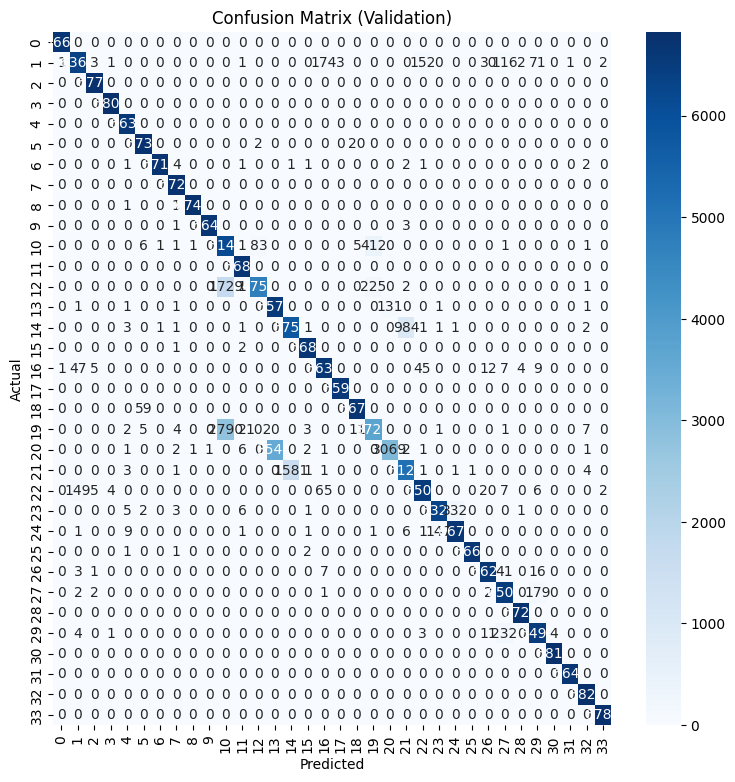

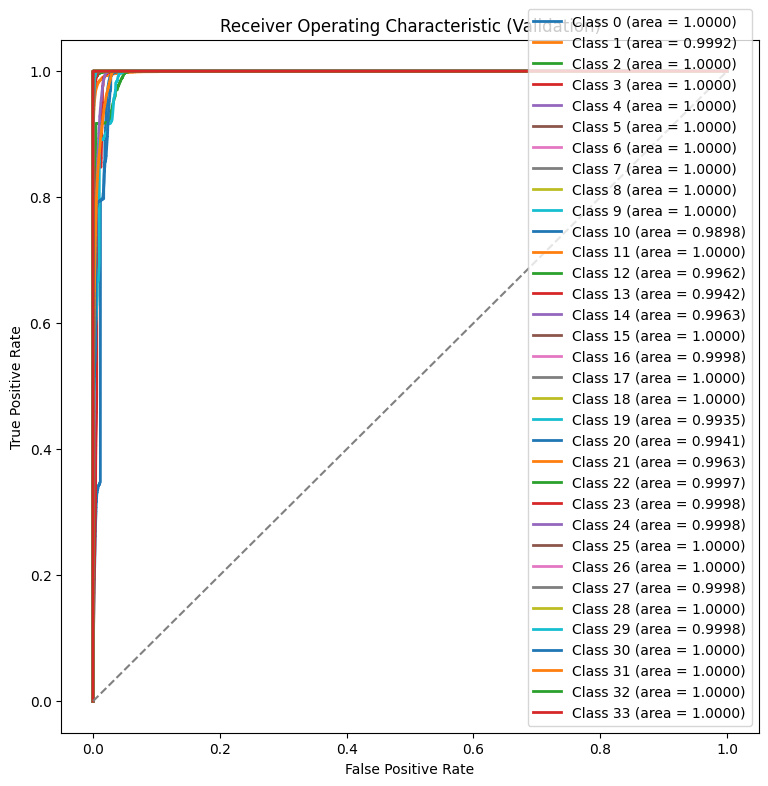

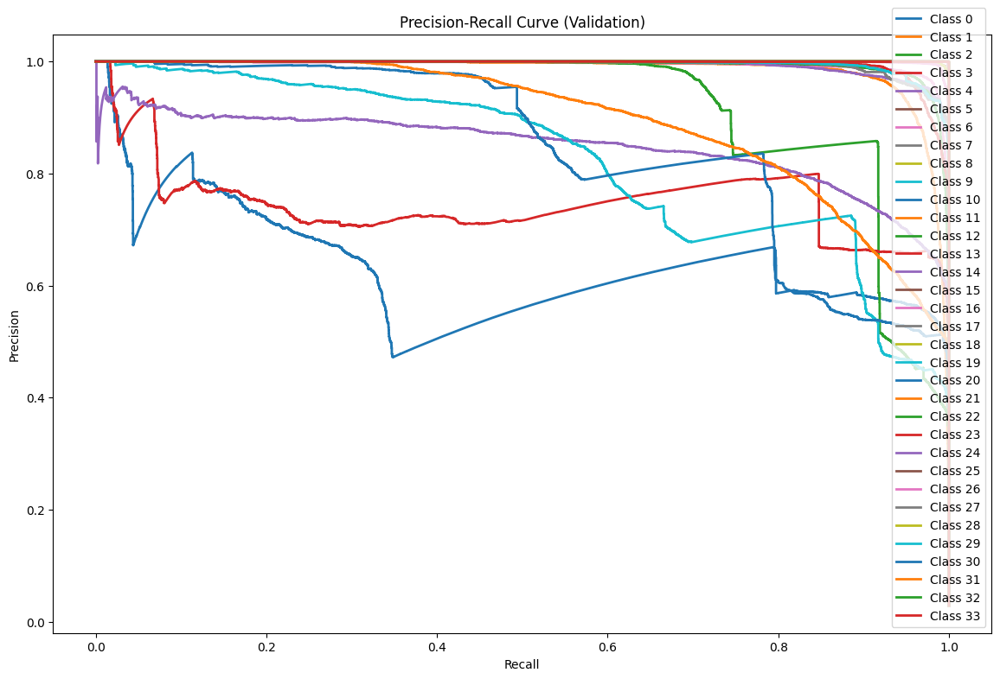


Metrics (Validation):
Accuracy: 93.978528%
Precision: 95.011320%
Recall: 93.949999%
F1 Score: 93.849890%
Loss: 0.148681
Elapsed Time: 35.77 seconds
1368/1368 ━━━━━━━━━━━━━━━━━━━━ 7s 5ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000         3
           1   0.841387  0.798604  0.819437      1003
           2   0.000000  0.000000  0.000000         8
           3   0.000000  0.000000  0.000000         2
           4   0.978417  0.989091  0.983725       275
           5   0.612903  0.760000  0.678571        25
           6   1.000000  0.999247  0.999623      6637
           7   0.963134  0.985849  0.974359       424
           8   0.999232  0.998976  0.999104      3905
           9   1.000000  0.999222  0.999611      3854
          10   0.681359  0.933351  0.787692      3826
          11   0.714286  0.500000  0.588235        20
          12   0.967078  0.705071  0.815547      3333
          13   0.752

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.

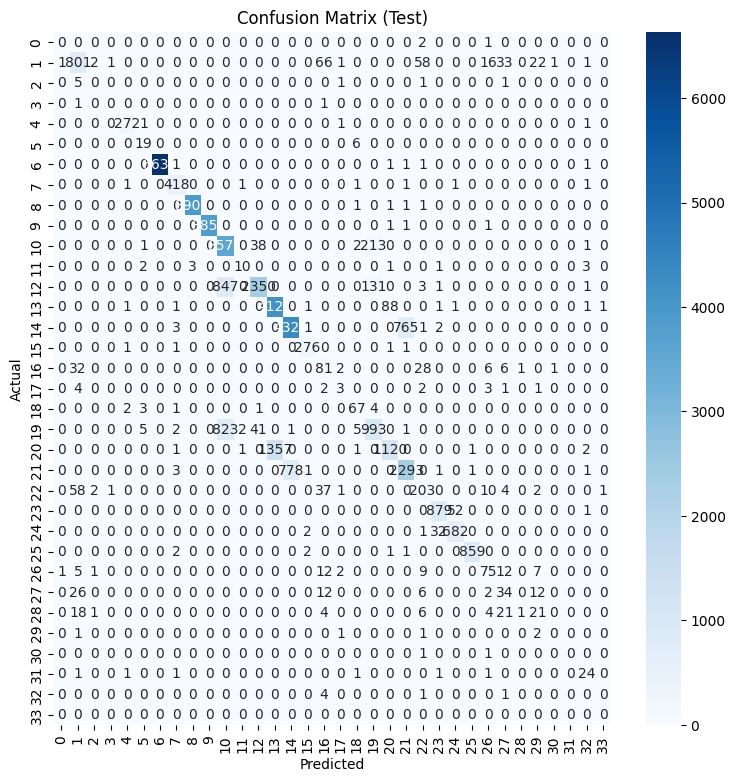

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


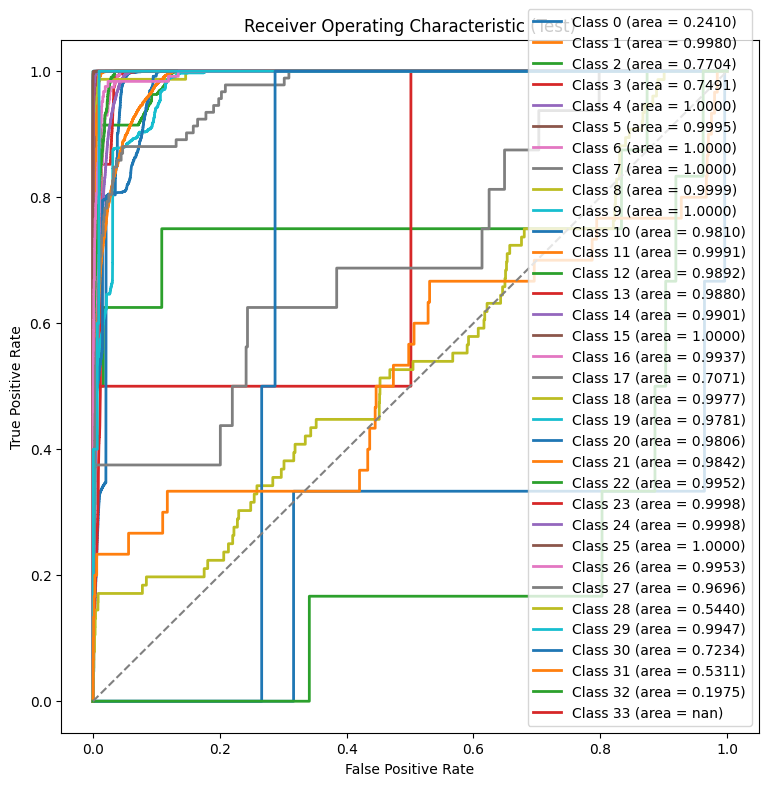

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


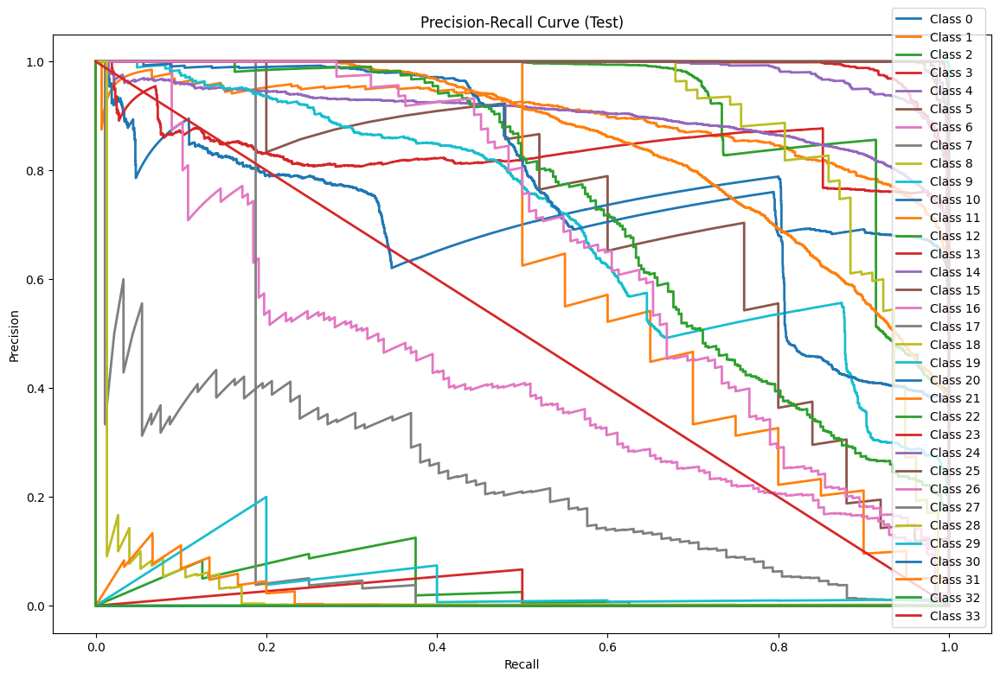

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Metrics (Test):
Accuracy: 86.467402%
Precision: 59.186984%
Recall: 57.885314%
F1 Score: 56.793153%
Loss: 0.436334
Elapsed Time: 7.69 seconds


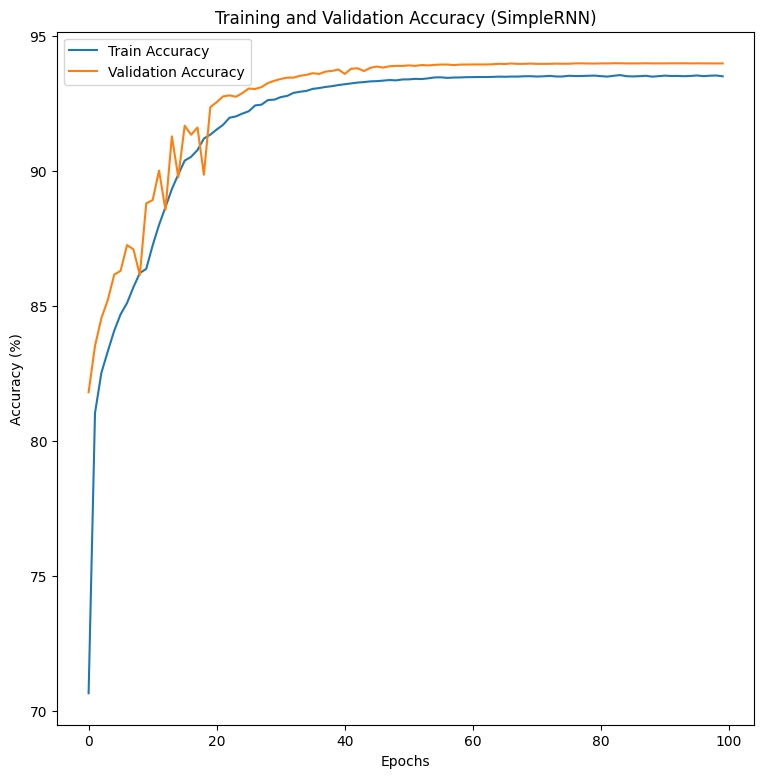

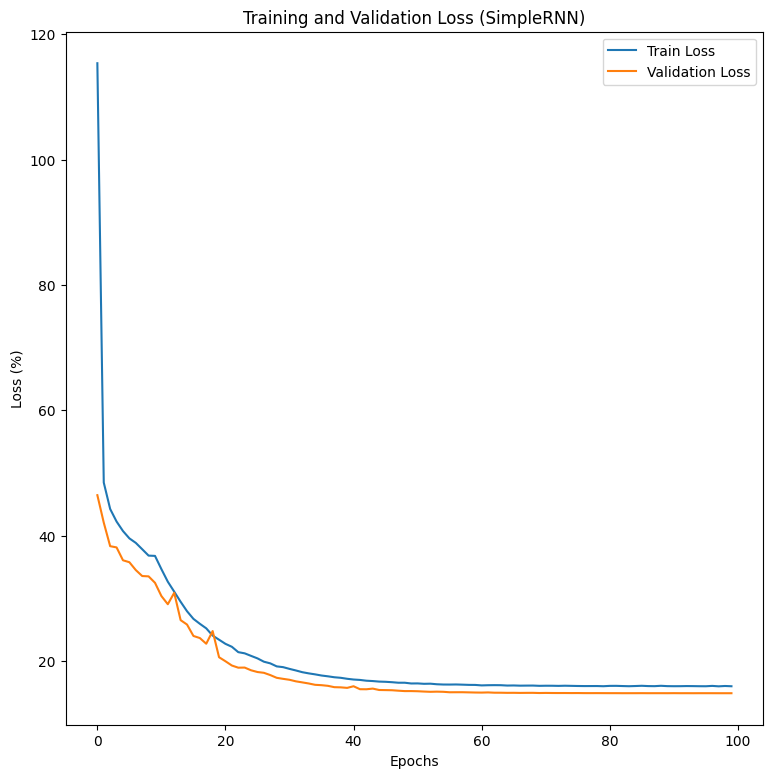

Epoch 1 - Train Loss: 115.3618%, Validation Loss: 46.46%, Train Accuracy: 70.67%, Validation Accuracy: 81.81%
Epoch 2 - Train Loss: 48.4705%, Validation Loss: 42.08%, Train Accuracy: 81.04%, Validation Accuracy: 83.52%
Epoch 3 - Train Loss: 44.2575%, Validation Loss: 38.32%, Train Accuracy: 82.53%, Validation Accuracy: 84.56%
Epoch 4 - Train Loss: 42.2534%, Validation Loss: 38.13%, Train Accuracy: 83.33%, Validation Accuracy: 85.23%
Epoch 5 - Train Loss: 40.7378%, Validation Loss: 36.07%, Train Accuracy: 84.09%, Validation Accuracy: 86.16%
Epoch 6 - Train Loss: 39.5689%, Validation Loss: 35.76%, Train Accuracy: 84.70%, Validation Accuracy: 86.31%
Epoch 7 - Train Loss: 38.8498%, Validation Loss: 34.51%, Train Accuracy: 85.11%, Validation Accuracy: 87.26%
Epoch 8 - Train Loss: 37.8396%, Validation Loss: 33.56%, Train Accuracy: 85.70%, Validation Accuracy: 87.10%
Epoch 9 - Train Loss: 36.8188%, Validation Loss: 33.51%, Train Accuracy: 86.22%, Validation Accuracy: 86.15%
Epoch 10 - Train L

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
from sklearn.preprocessing import label_binarize, LabelEncoder

label_encoder = LabelEncoder()
y_TON_IOT_test2_encoded = label_encoder.fit_transform(y_TON_IOT_test)
y_TON_IOT_test2_one_hot = tf.keras.utils.to_categorical(y_TON_IOT_test2_encoded, num_classes=num_classes)


def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))

    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(9, 9))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")


evaluate_model(model_rnn, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=34, dataset_name="Validation")
evaluate_model(model_rnn, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=34, dataset_name="Test")



plt.figure(figsize=(9, 9))
plt.plot(np.array(history_rnn.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_rnn.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (SimpleRNN)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_rnn.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_rnn.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (SimpleRNN)')
plt.legend()
plt.show()




for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_rnn.history['loss'],
                                                                      history_rnn.history['val_loss'],
                                                                      history_rnn.history['accuracy'],
                                                                      history_rnn.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")


In [ ]:
import pickle
with open('history_rnn.pkl', 'wb') as file:
    pickle.dump(history_rnn.history, file)

#***GRU***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns
import time
import numpy as np


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# GRU Model
model_gru = Sequential()
model_gru.add(GRU(128, activation='tanh', return_sequences=True, input_shape=X_TON_IOT_train.shape[1:], kernel_regularizer=l2(0.01)))
model_gru.add(BatchNormalization())
model_gru.add(Dropout(0.5))
model_gru.add(GRU(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_gru.add(BatchNormalization())
model_gru.add(Dropout(0.5))
model_gru.add(Dense(34, activation='softmax'))

model_gru.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()

history_gru = model_gru.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                            validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                            callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


 # training_time
print(f"Le temps d'entraînement du modèle GRU est de {training_time:.2f} secondes.")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 48s 62ms/step - accuracy: 0.4351 - loss: 2.4502 - val_accuracy: 0.7372 - val_loss: 0.7177 - learning_rate: 0.0010
Epoch 2/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 77s 61ms/step - accuracy: 0.7698 - loss: 0.6171 - val_accuracy: 0.8145 - val_loss: 0.4692 - learning_rate: 0.0010
Epoch 3/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - accuracy: 0.8115 - loss: 0.4909 - val_accuracy: 0.8324 - val_loss: 0.4131 - learning_rate: 0.0010
Epoch 4/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 40s 60ms/step - accuracy: 0.8269 - loss: 0.4420 - val_accuracy: 0.8704 - val_loss: 0.3801 - learning_rate: 0.0010
Epoch 5/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 41s 60ms/step - accuracy: 0.8389 - loss: 0.4075 - val_accuracy: 0.8426 - val_loss: 0.3628 - learning_rate: 0.0010
Epoch 6/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 42s 62ms/step - accuracy: 0.8477 - loss: 0.3833 - val_accuracy: 0.8753 - val_loss: 0.3344 - learning_rate: 0.0010
Epoch 7/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 81s 61ms/step - accuracy: 0.8

7144/7144 ━━━━━━━━━━━━━━━━━━━━ 20s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   0.999700  1.000000  0.999850      6669
           1   0.966161  0.920220  0.942631      6919
           2   0.997351  1.000000  0.998674      6777
           3   0.999119  1.000000  0.999559      6805
           4   0.997593  0.999548  0.998569      6633
           5   0.991327  0.997928  0.994617      6758
           6   1.000000  0.997919  0.998958      6727
           7   0.997773  0.999851  0.998811      6723
           8   0.999407  0.999555  0.999481      6749
           9   0.999849  0.998796  0.999323      6646
          10   0.579293  0.915827  0.709685      6653
          11   0.997165  1.000000  0.998581      6683
          12   0.958428  0.690200  0.802494      6714
          13   0.651927  0.975123  0.781425      6713
          14   0.782699  0.837158  0.809013      6755
          15   0.998953  0.999551  0.999252      6684


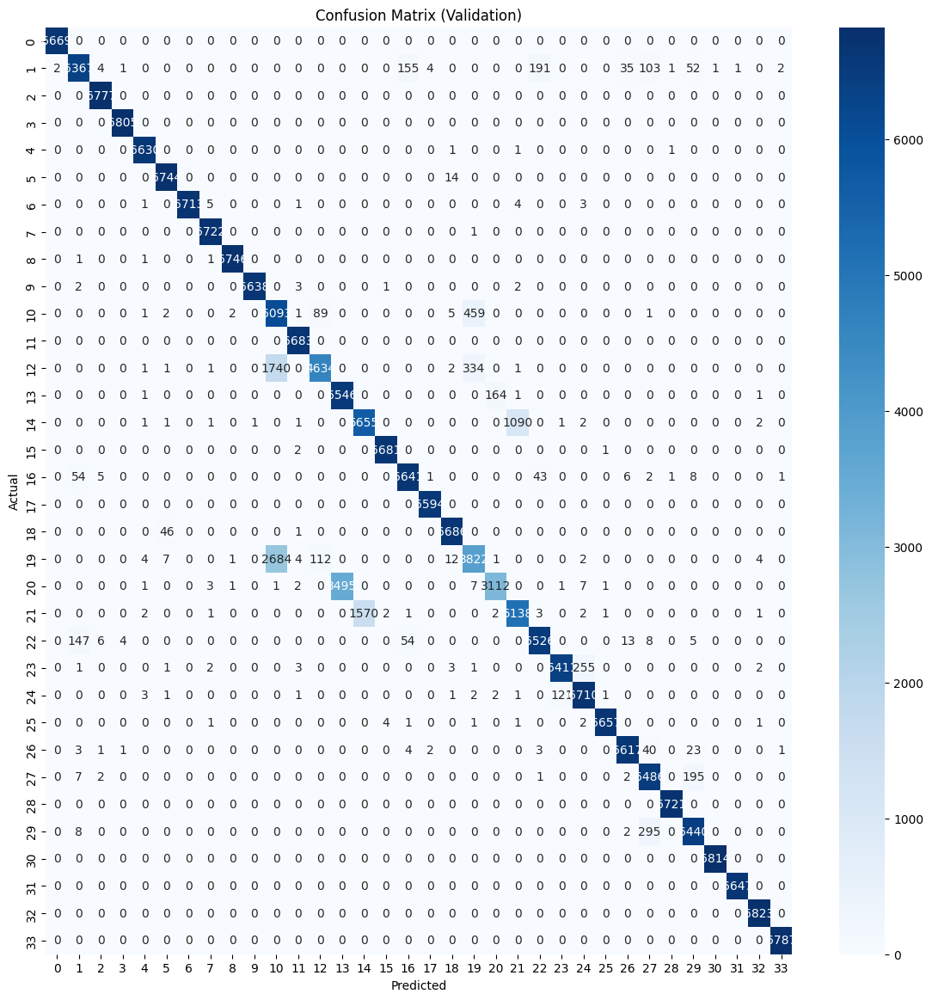

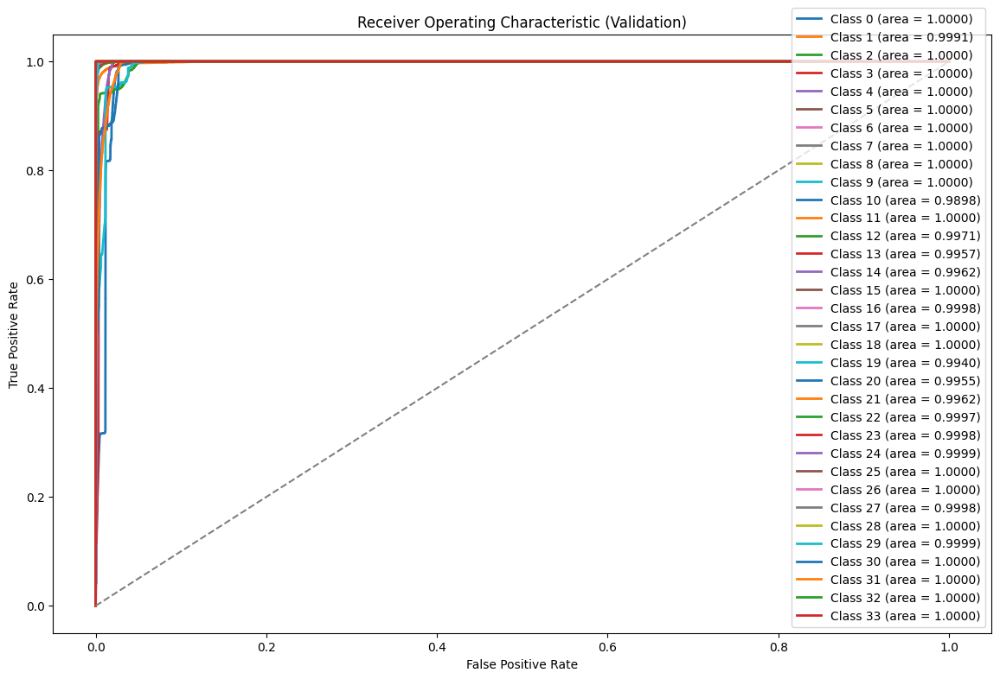

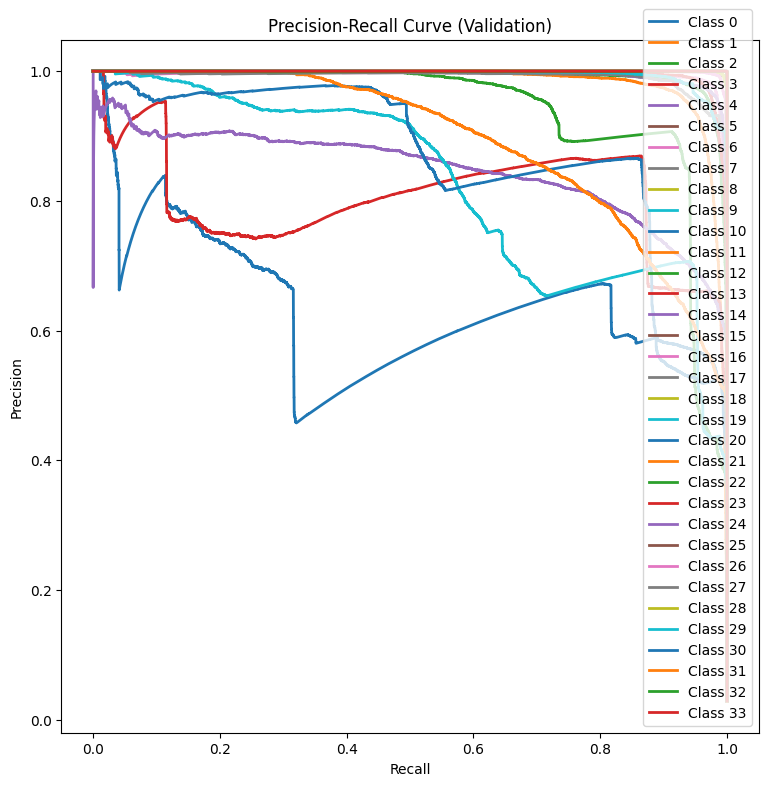


Metrics (Validation):
Accuracy: 93.942218%
Precision: 94.894452%
Recall: 93.914060%
F1 Score: 93.820344%
Loss: 0.147007
Elapsed Time: 41.11 seconds
1368/1368 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000         3
           1   0.823101  0.788634  0.805499      1003
           2   0.000000  0.000000  0.000000         8
           3   0.000000  0.000000  0.000000         2
           4   0.978417  0.989091  0.983725       275
           5   0.611111  0.880000  0.721311        25
           6   1.000000  0.999096  0.999548      6637
           7   0.969555  0.976415  0.972973       424
           8   0.999232  0.998976  0.999104      3905
           9   0.999740  0.998962  0.999351      3854
          10   0.683498  0.923419  0.785548      3826
          11   0.480000  0.600000  0.533333        20
          12   0.970874  0.690069  0.806734      3333
          13   0.754

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


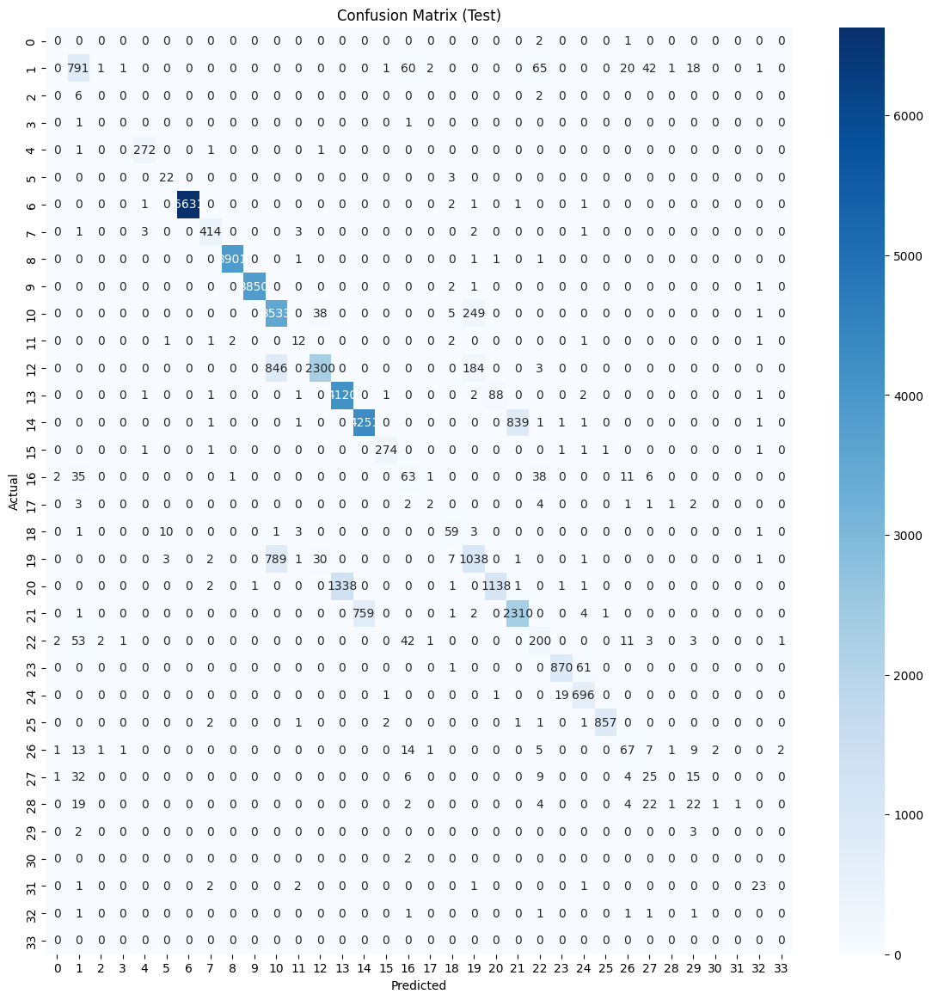

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


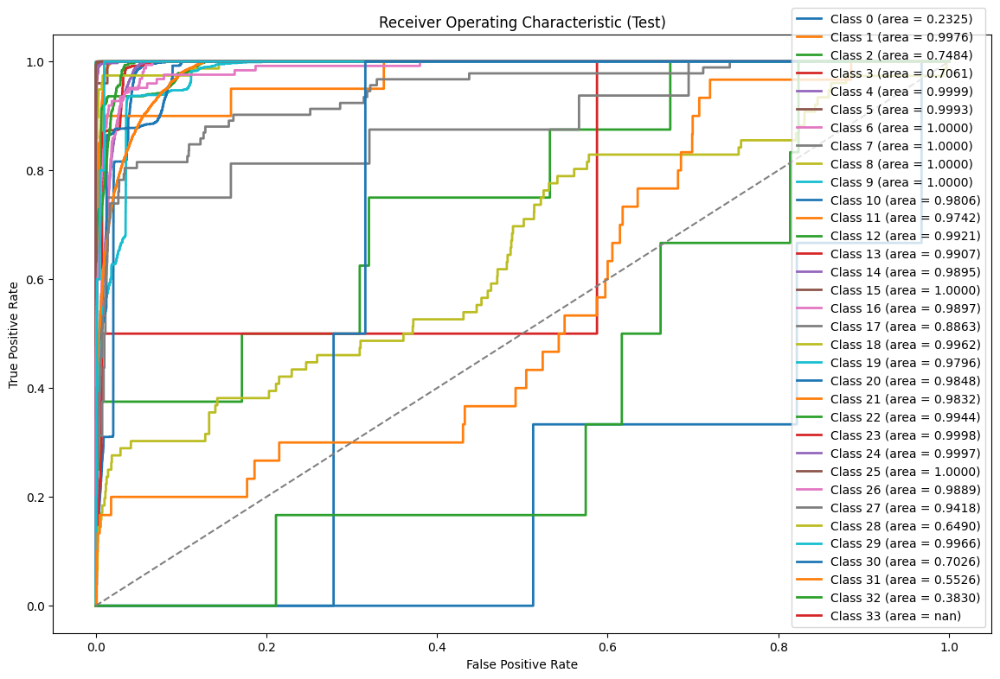

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


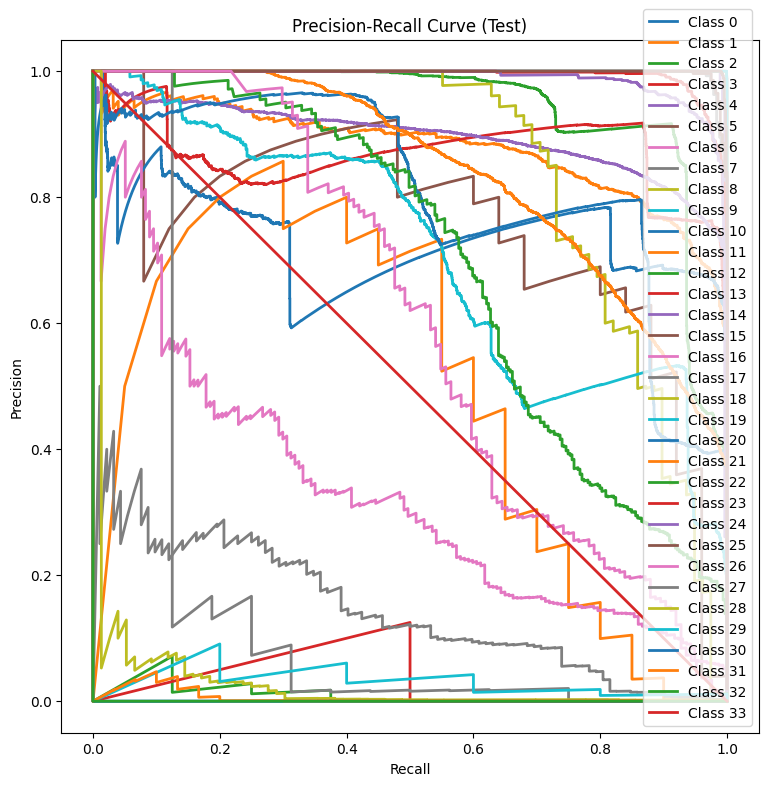

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Metrics (Test):
Accuracy: 86.149768%
Precision: 56.869496%
Recall: 57.727093%
F1 Score: 55.636668%
Loss: 0.447831
Elapsed Time: 4.21 seconds


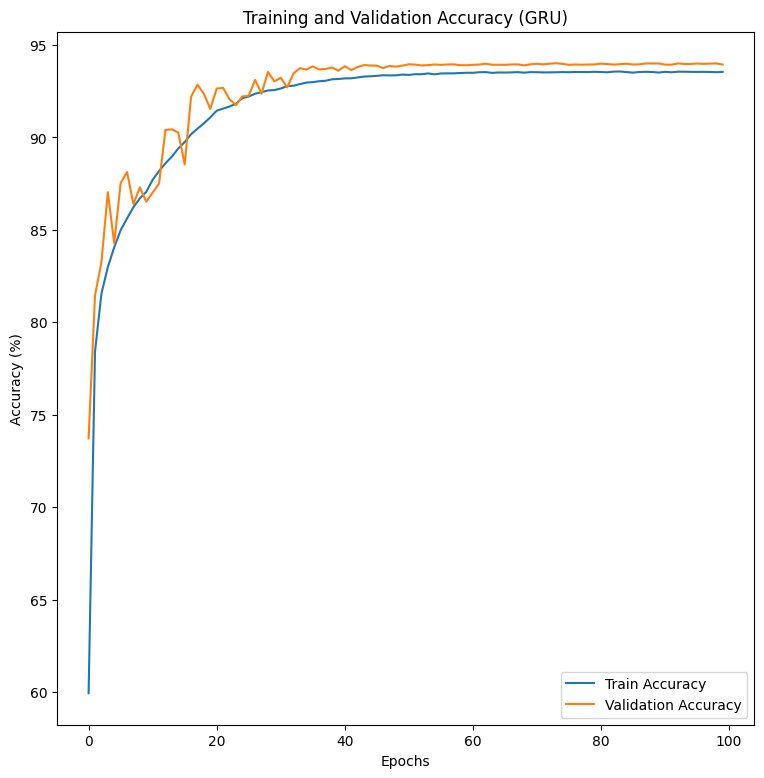

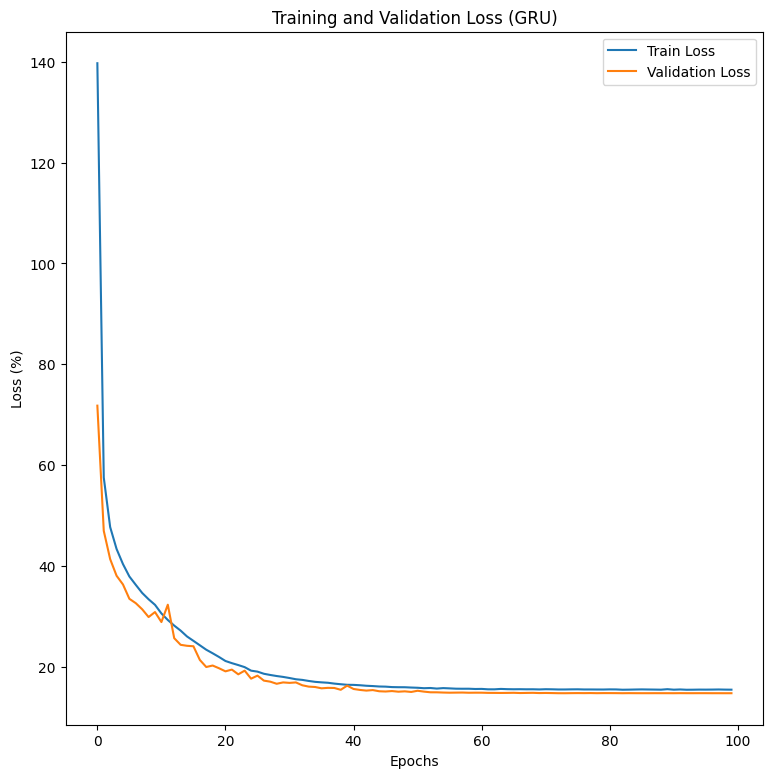

Epoch 1 - Train Loss: 139.7295%, Validation Loss: 71.77%, Train Accuracy: 59.93%, Validation Accuracy: 73.72%
Epoch 2 - Train Loss: 57.5093%, Validation Loss: 46.92%, Train Accuracy: 78.41%, Validation Accuracy: 81.45%
Epoch 3 - Train Loss: 47.6701%, Validation Loss: 41.31%, Train Accuracy: 81.55%, Validation Accuracy: 83.24%
Epoch 4 - Train Loss: 43.3292%, Validation Loss: 38.01%, Train Accuracy: 82.98%, Validation Accuracy: 87.04%
Epoch 5 - Train Loss: 40.3231%, Validation Loss: 36.28%, Train Accuracy: 84.06%, Validation Accuracy: 84.26%
Epoch 6 - Train Loss: 37.8623%, Validation Loss: 33.44%, Train Accuracy: 84.98%, Validation Accuracy: 87.53%
Epoch 7 - Train Loss: 36.2038%, Validation Loss: 32.57%, Train Accuracy: 85.61%, Validation Accuracy: 88.13%
Epoch 8 - Train Loss: 34.5974%, Validation Loss: 31.35%, Train Accuracy: 86.23%, Validation Accuracy: 86.39%
Epoch 9 - Train Loss: 33.3436%, Validation Loss: 29.82%, Train Accuracy: 86.70%, Validation Accuracy: 87.30%
Epoch 10 - Train L

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import label_binarize, LabelEncoder
import time


def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(14, 14))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()

    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")



label_encoder = LabelEncoder()
y_TON_IOT_test2_encoded = label_encoder.fit_transform(y_TON_IOT_test)


y_TON_IOT_test2_one_hot = tf.keras.utils.to_categorical(y_TON_IOT_test2_encoded, num_classes=34)


evaluate_model(model_gru, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=34, dataset_name="Validation")

evaluate_model(model_gru, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=34, dataset_name="Test")


plt.figure(figsize=(9, 9))
plt.plot(np.array(history_gru.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_gru.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (GRU)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_gru.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_gru.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (GRU)')
plt.legend()
plt.show()


for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_gru.history['loss'],
                                                                      history_gru.history['val_loss'],
                                                                      history_gru.history['accuracy'],
                                                                      history_gru.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")


In [ ]:
import pickle
with open('history_gru.pkl', 'wb') as file:
    pickle.dump(history_gru.history, file)

#***CNN_LSTM***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Conv1D, MaxPooling1D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns
import time
import numpy as np


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# CNN_LSTM Model
model_lstm_cnn = Sequential()
model_lstm_cnn.add(LSTM(128, activation='tanh', return_sequences=True, input_shape=X_TON_IOT_train.shape[1:], kernel_regularizer=l2(0.01)))
model_lstm_cnn.add(BatchNormalization())
model_lstm_cnn.add(Dropout(0.5))
model_lstm_cnn.add(Conv1D(filters=64, kernel_size=3, activation='relu'))
model_lstm_cnn.add(MaxPooling1D(pool_size=2))
model_lstm_cnn.add(Flatten())
model_lstm_cnn.add(Dense(256, activation='relu', kernel_regularizer=l2(0.01)))
model_lstm_cnn.add(BatchNormalization())
model_lstm_cnn.add(Dropout(0.5))
model_lstm_cnn.add(Dense(34, activation='softmax'))

model_lstm_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()

history_lstm_cnn = model_lstm_cnn.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                                      validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                                      callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


 # training_time
print(f"Le temps d'entraînement du modèle LSTM_CNN est de {training_time:.2f} secondes.")


Epoch 1/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 23s 32ms/step - accuracy: 0.6315 - loss: 2.3895 - val_accuracy: 0.5888 - val_loss: 1.3233 - learning_rate: 0.0010
Epoch 2/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 20s 30ms/step - accuracy: 0.7607 - loss: 0.6882 - val_accuracy: 0.8004 - val_loss: 0.5608 - learning_rate: 0.0010
Epoch 3/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - accuracy: 0.7800 - loss: 0.6113 - val_accuracy: 0.8261 - val_loss: 0.5020 - learning_rate: 0.0010
Epoch 4/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - accuracy: 0.7908 - loss: 0.5749 - val_accuracy: 0.8266 - val_loss: 0.4755 - learning_rate: 0.0010
Epoch 5/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - accuracy: 0.7978 - loss: 0.5491 - val_accuracy: 0.8319 - val_loss: 0.4591 - learning_rate: 0.0010
Epoch 6/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - accuracy: 0.8007 - loss: 0.5371 - val_accuracy: 0.8228 - val_loss: 0.4601 - learning_rate: 0.0010
Epoch 7/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 41s 31ms/step - accuracy: 0.8

7144/7144 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   0.999251  1.000000  0.999625      6669
           1   0.926784  0.872669  0.898913      6919
           2   0.994424  1.000000  0.997204      6777
           3   0.996486  1.000000  0.998240      6805
           4   0.998343  0.999397  0.998870      6633
           5   0.983382  0.998224  0.990748      6758
           6   1.000000  0.998067  0.999033      6727
           7   0.996143  0.998810  0.997475      6723
           8   0.999407  0.999704  0.999556      6749
           9   1.000000  0.999248  0.999624      6646
          10   0.571716  0.938825  0.710661      6653
          11   0.995383  1.000000  0.997686      6683
          12   0.971591  0.687668  0.805338      6714
          13   0.651818  0.972144  0.780389      6713
          14   0.770499  0.837454  0.802582      6755
          15   0.998207  0.999402  0.998804      6684


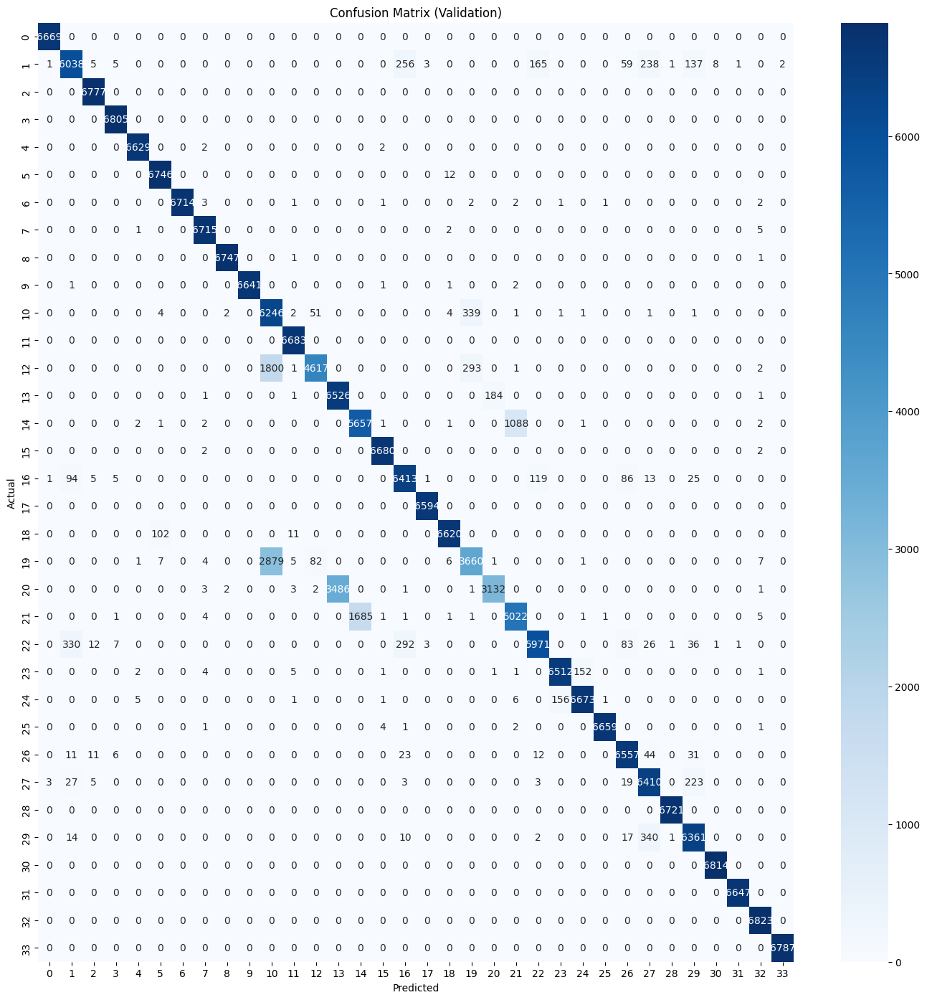

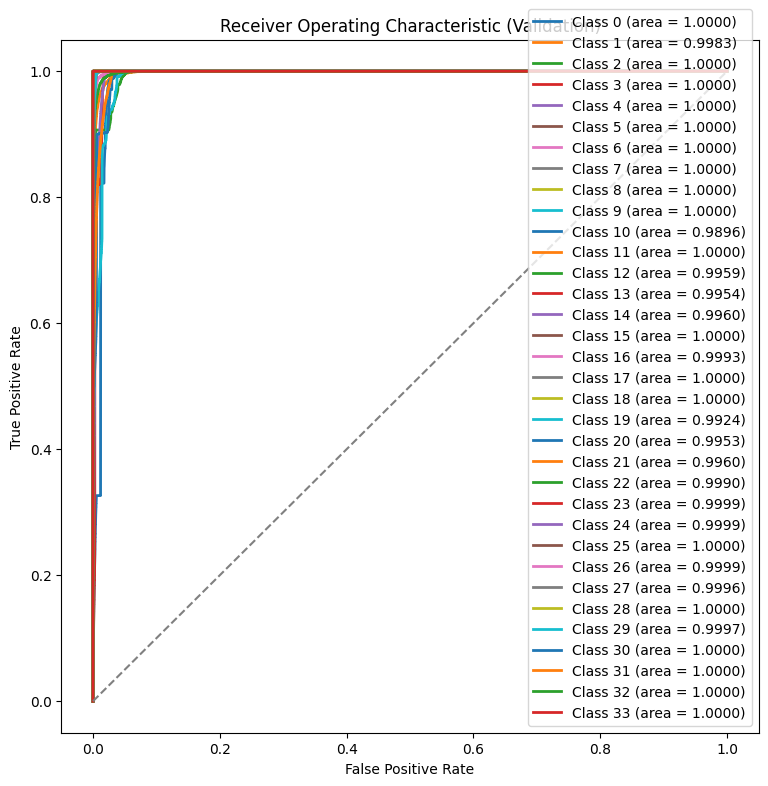

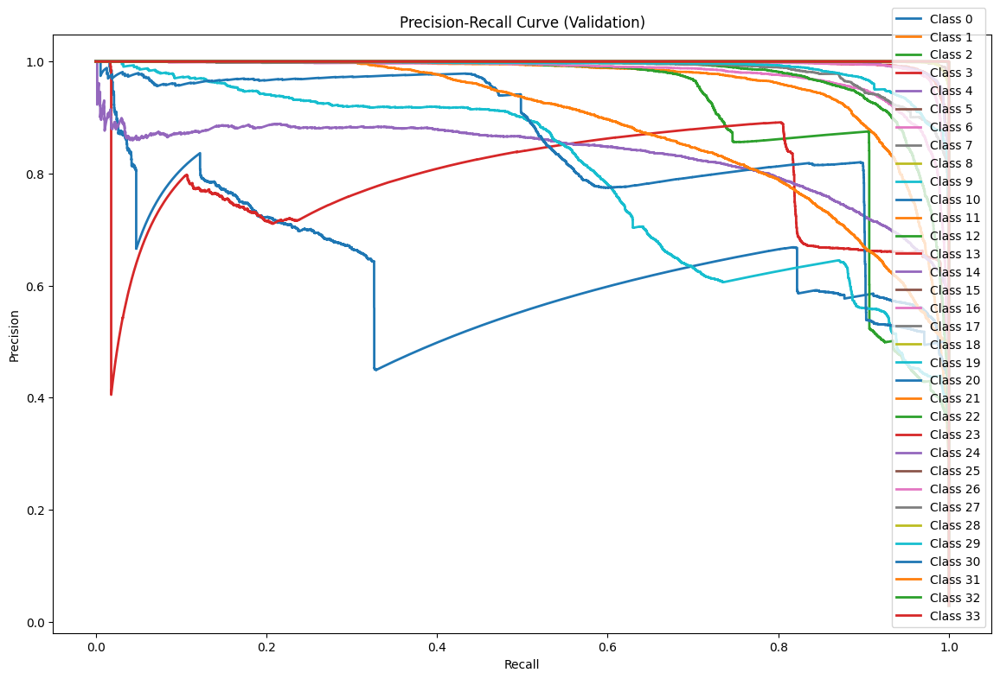


Metrics (Validation):
Accuracy: 93.299560%
Precision: 94.352250%
Recall: 93.278023%
F1 Score: 93.174171%
Loss: 0.181150
Elapsed Time: 41.11 seconds
1368/1368 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000         3
           1   0.858072  0.789631  0.822430      1003
           2   0.000000  0.000000  0.000000         8
           3   0.000000  0.000000  0.000000         2
           4   0.968085  0.992727  0.980251       275
           5   0.571429  0.800000  0.666667        25
           6   1.000000  0.999096  0.999548      6637
           7   0.971963  0.981132  0.976526       424
           8   0.999488  0.998976  0.999232      3905
           9   1.000000  0.998962  0.999481      3854
          10   0.675084  0.943283  0.786960      3826
          11   0.523810  0.550000  0.536585        20
          12   0.977625  0.681668  0.803253      3333
          13   0.754

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


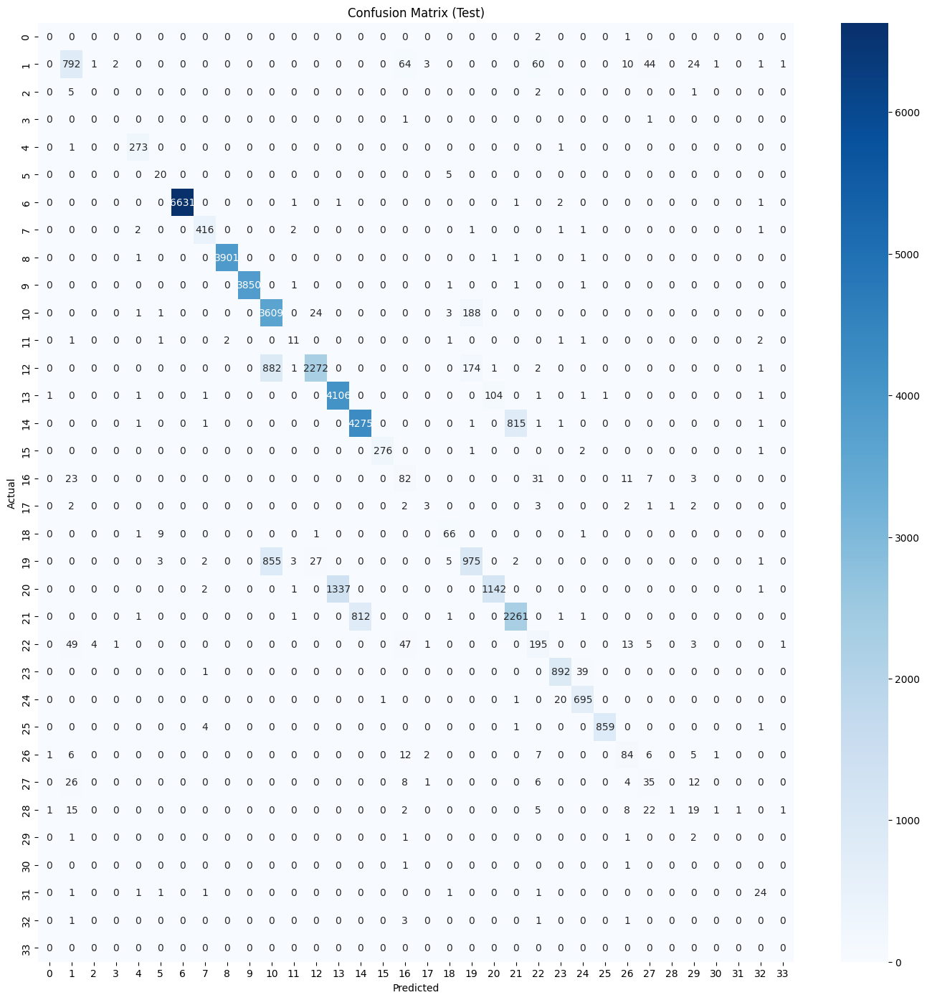

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


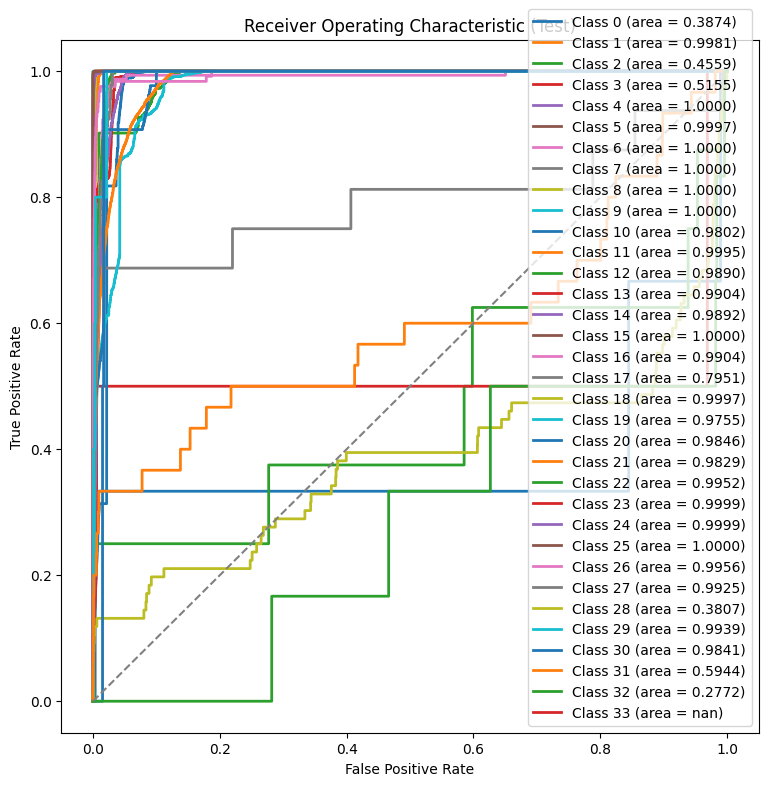

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


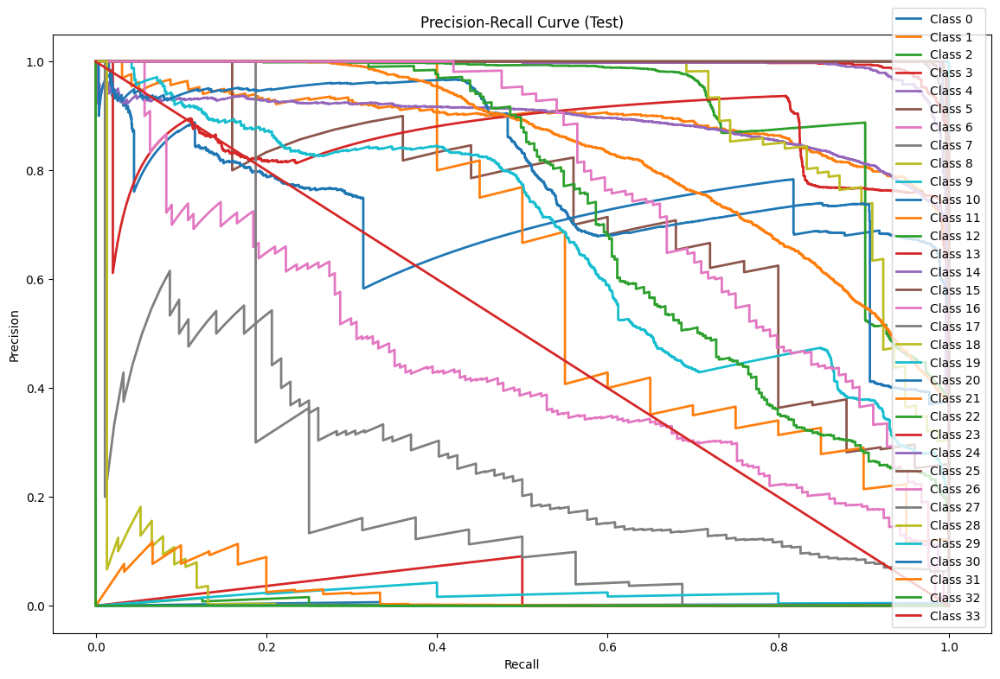

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Metrics (Test):
Accuracy: 86.204611%
Precision: 58.619297%
Recall: 58.254462%
F1 Score: 56.661623%
Loss: 0.457974
Elapsed Time: 5.17 seconds


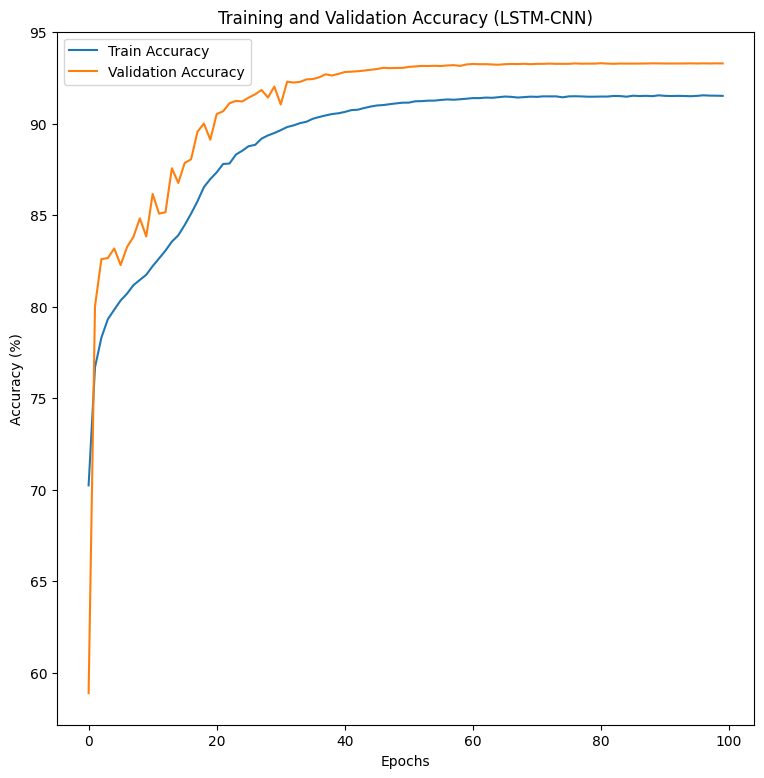

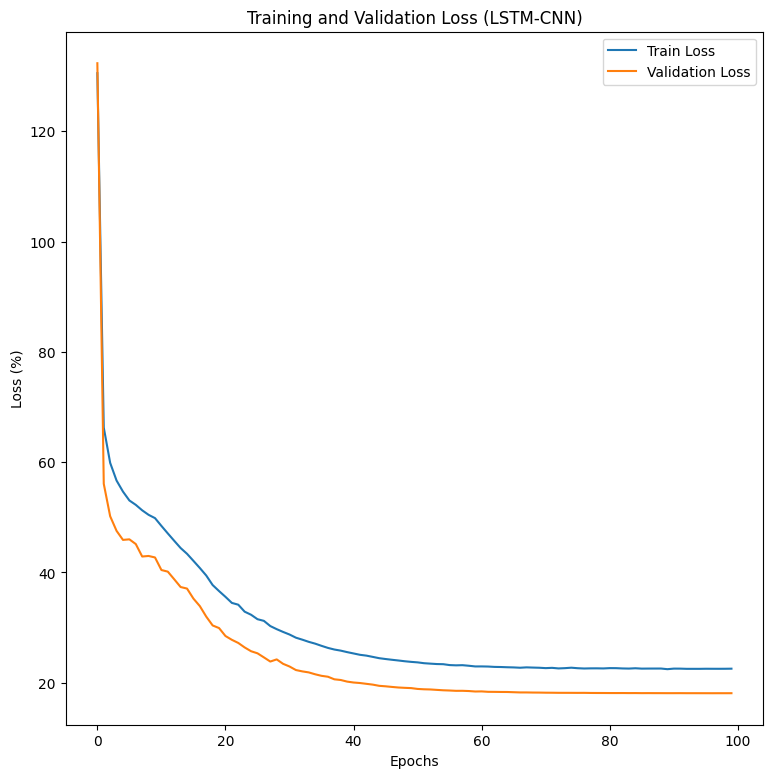

Epoch 1 - Train Loss: 130.5281%, Validation Loss: 132.33%, Train Accuracy: 70.24%, Validation Accuracy: 58.88%
Epoch 2 - Train Loss: 66.2751%, Validation Loss: 56.08%, Train Accuracy: 76.70%, Validation Accuracy: 80.04%
Epoch 3 - Train Loss: 59.8755%, Validation Loss: 50.20%, Train Accuracy: 78.32%, Validation Accuracy: 82.61%
Epoch 4 - Train Loss: 56.6647%, Validation Loss: 47.55%, Train Accuracy: 79.32%, Validation Accuracy: 82.66%
Epoch 5 - Train Loss: 54.6641%, Validation Loss: 45.91%, Train Accuracy: 79.84%, Validation Accuracy: 83.19%
Epoch 6 - Train Loss: 53.0577%, Validation Loss: 46.01%, Train Accuracy: 80.35%, Validation Accuracy: 82.28%
Epoch 7 - Train Loss: 52.2618%, Validation Loss: 45.16%, Train Accuracy: 80.72%, Validation Accuracy: 83.27%
Epoch 8 - Train Loss: 51.2717%, Validation Loss: 42.90%, Train Accuracy: 81.18%, Validation Accuracy: 83.82%
Epoch 9 - Train Loss: 50.4526%, Validation Loss: 43.00%, Train Accuracy: 81.47%, Validation Accuracy: 84.84%
Epoch 10 - Train 

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Conv1D, MaxPooling1D, Flatten, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import label_binarize, LabelEncoder



def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(17, 17))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")


label_encoder = LabelEncoder()
y_TON_IOT_test2_encoded = label_encoder.fit_transform(y_TON_IOT_test)


y_TON_IOT_test2_one_hot = tf.keras.utils.to_categorical(y_TON_IOT_test2_encoded, num_classes=num_classes)


evaluate_model(model_lstm_cnn, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=34, dataset_name="Validation")
evaluate_model(model_lstm_cnn, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=34, dataset_name="Test")


plt.figure(figsize=(9, 9))
plt.plot(np.array(history_lstm_cnn.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_lstm_cnn.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (LSTM-CNN)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_lstm_cnn.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_lstm_cnn.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (LSTM-CNN)')
plt.legend()
plt.show()


for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_lstm_cnn.history['loss'],
                                                                      history_lstm_cnn.history['val_loss'],
                                                                      history_lstm_cnn.history['accuracy'],
                                                                      history_lstm_cnn.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")


In [ ]:
import pickle
with open('history_lstm_cnn.pkl', 'wb') as file:
    pickle.dump(history_lstm_cnn.history, file)

#***CNN_RNN***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

#  CNN_RNN Model
model_rnn_cnn = Sequential()
model_rnn_cnn.add(Conv1D(64, 3, activation='relu', input_shape=X_TON_IOT_train.shape[1:]))
model_rnn_cnn.add(MaxPooling1D(pool_size=2))
model_rnn_cnn.add(Conv1D(128, 3, activation='relu'))
model_rnn_cnn.add(MaxPooling1D(pool_size=2))
model_rnn_cnn.add(SimpleRNN(128, activation='tanh', return_sequences=True, kernel_regularizer=l2(0.01)))
model_rnn_cnn.add(BatchNormalization())
model_rnn_cnn.add(Dropout(0.5))
model_rnn_cnn.add(SimpleRNN(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_rnn_cnn.add(BatchNormalization())
model_rnn_cnn.add(Dropout(0.5))
model_rnn_cnn.add(Flatten())
model_rnn_cnn.add(Dense(34, activation='softmax'))

model_rnn_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()

history_rnn_cnn = model_rnn_cnn.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                                      validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                                      callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


 # training_time
print(f"Le temps d'entraînement du modèle CNN_RNN est de {training_time:.2f} secondes.")


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 22s 21ms/step - accuracy: 0.6203 - loss: 2.5151 - val_accuracy: 0.8085 - val_loss: 0.5611 - learning_rate: 0.0010
Epoch 2/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - accuracy: 0.7983 - loss: 0.5639 - val_accuracy: 0.8311 - val_loss: 0.4490 - learning_rate: 0.0010
Epoch 3/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - accuracy: 0.8165 - loss: 0.4850 - val_accuracy: 0.8371 - val_loss: 0.4167 - learning_rate: 0.0010
Epoch 4/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 10s 13ms/step - accuracy: 0.8288 - loss: 0.4497 - val_accuracy: 0.8371 - val_loss: 0.4493 - learning_rate: 0.0010
Epoch 5/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - accuracy: 0.8411 - loss: 0.4251 - val_accuracy: 0.8375 - val_loss: 0.4308 - learning_rate: 0.0010
Epoch 6/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 9s 13ms/step - accuracy: 0.8563 - loss: 0.3948 - val_accuracy: 0.8772 - val_loss: 0.3443 - learning_rate: 0.0010
Epoch 7/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 9s 14ms/step - accuracy: 0.8632 -

7144/7144 ━━━━━━━━━━━━━━━━━━━━ 19s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   0.999550  1.000000  0.999775      6669
           1   0.944410  0.886400  0.914486      6919
           2   0.996764  1.000000  0.998379      6777
           3   0.998679  1.000000  0.999339      6805
           4   0.996844  0.999849  0.998344      6633
           5   0.988524  0.994229  0.991368      6758
           6   1.000000  0.998067  0.999033      6727
           7   0.997179  0.998959  0.998068      6723
           8   0.999407  0.999555  0.999481      6749
           9   1.000000  0.999097  0.999548      6646
          10   0.579848  0.916880  0.710418      6653
          11   0.998059  1.000000  0.999028      6683
          12   0.945258  0.702115  0.805743      6714
          13   0.652941  0.954268  0.775357      6713
          14   0.787373  0.838194  0.811989      6755
          15   0.998506  0.999701  0.999103      6684


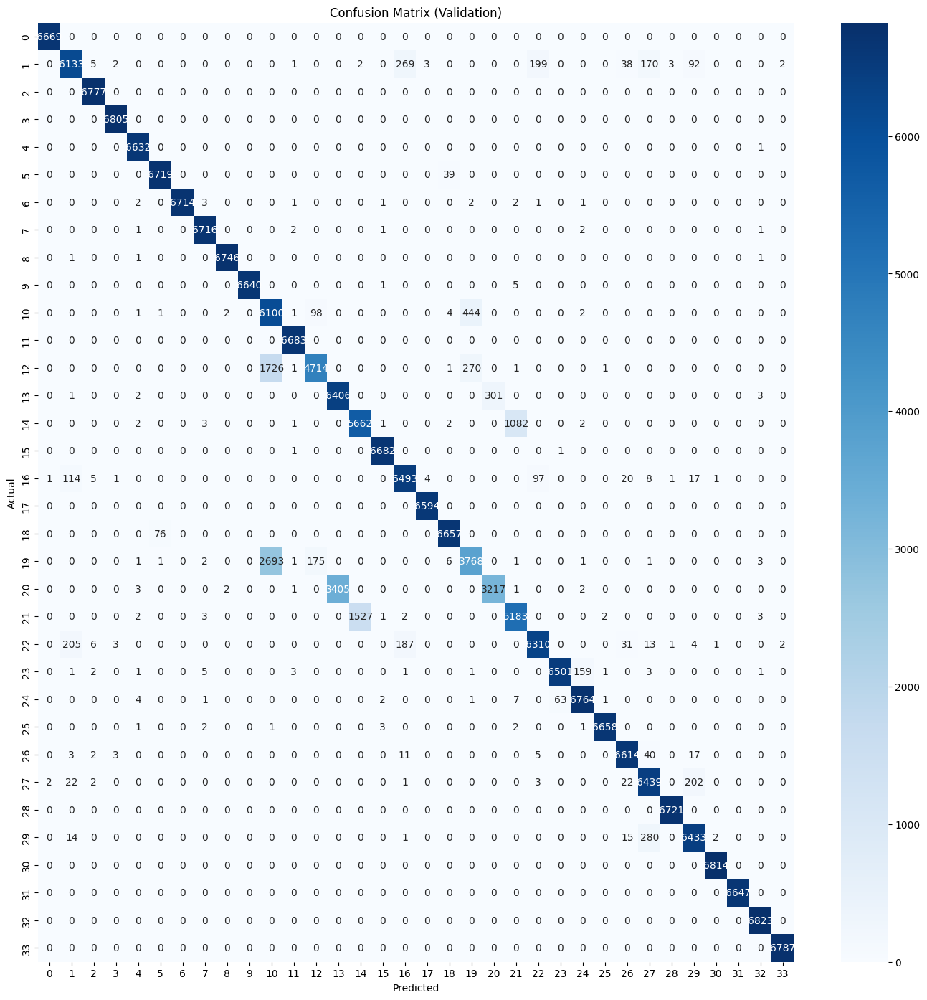

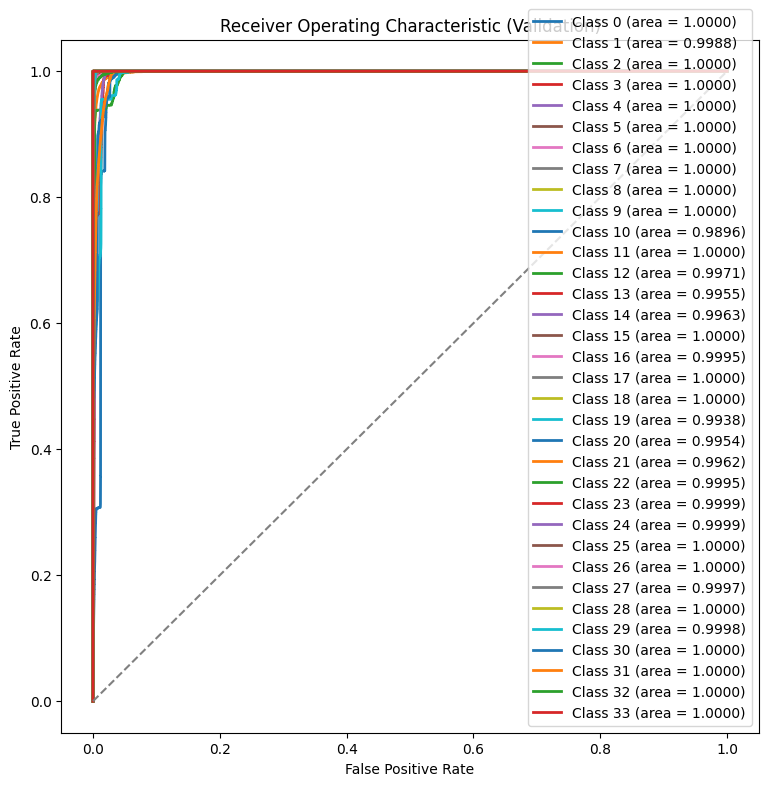

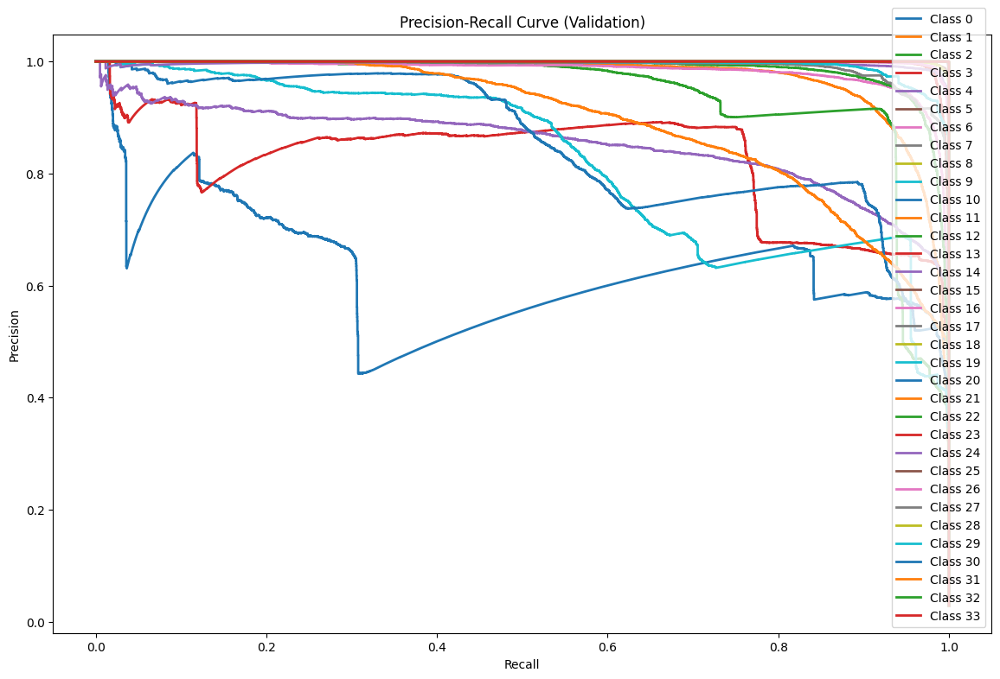


Metrics (Validation):
Accuracy: 93.717353%
Precision: 94.585794%
Recall: 93.693251%
F1 Score: 93.610030%
Loss: 0.154677
Elapsed Time: 22.45 seconds
1368/1368 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000         3
           1   0.852973  0.786640  0.818465      1003
           2   0.000000  0.000000  0.000000         8
           3   0.000000  0.000000  0.000000         2
           4   0.978417  0.989091  0.983725       275
           5   0.645161  0.800000  0.714286        25
           6   1.000000  0.999096  0.999548      6637
           7   0.976636  0.985849  0.981221       424
           8   0.999744  0.999232  0.999488      3905
           9   1.000000  0.998703  0.999351      3854
          10   0.684536  0.924464  0.786612      3826
          11   0.545455  0.600000  0.571429        20
          12   0.960526  0.700870  0.810408      3333
          13   0.755

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


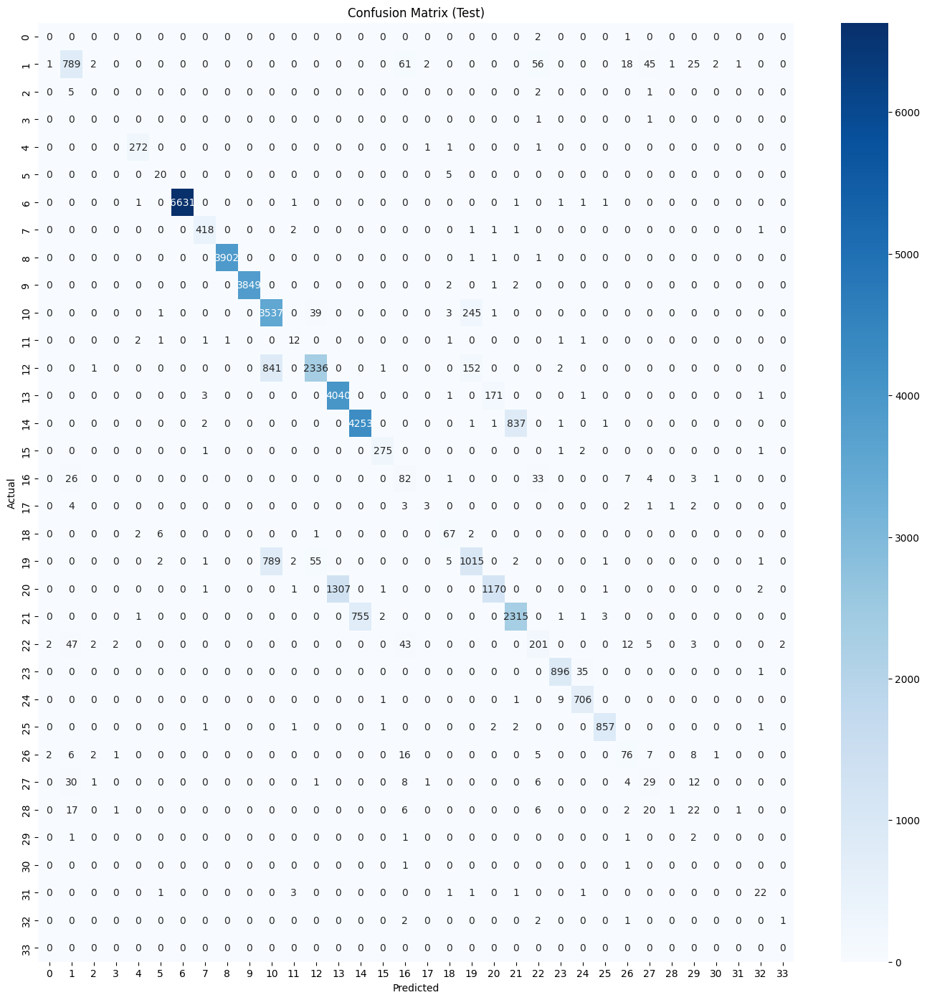

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


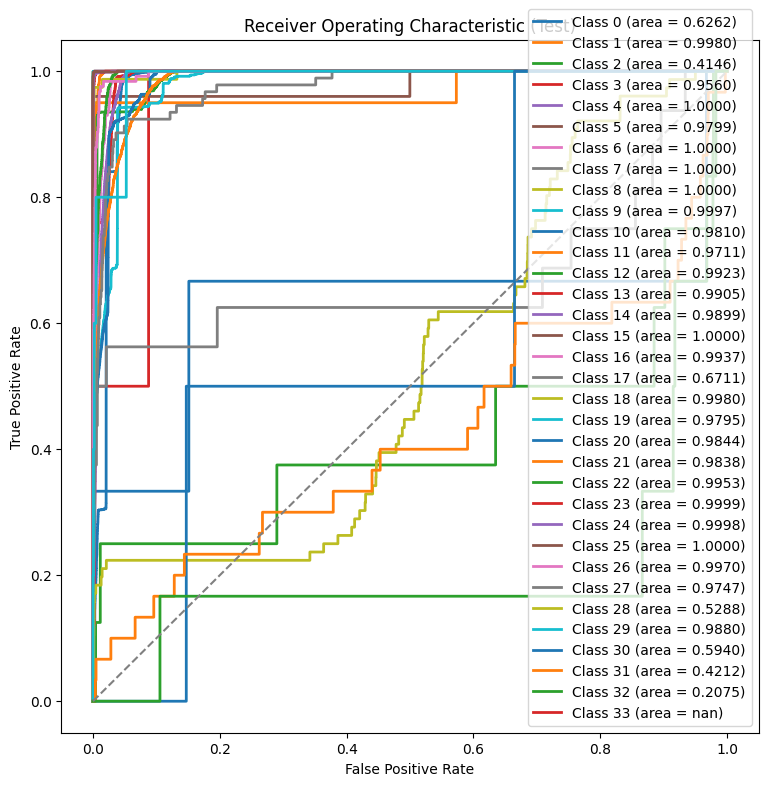

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


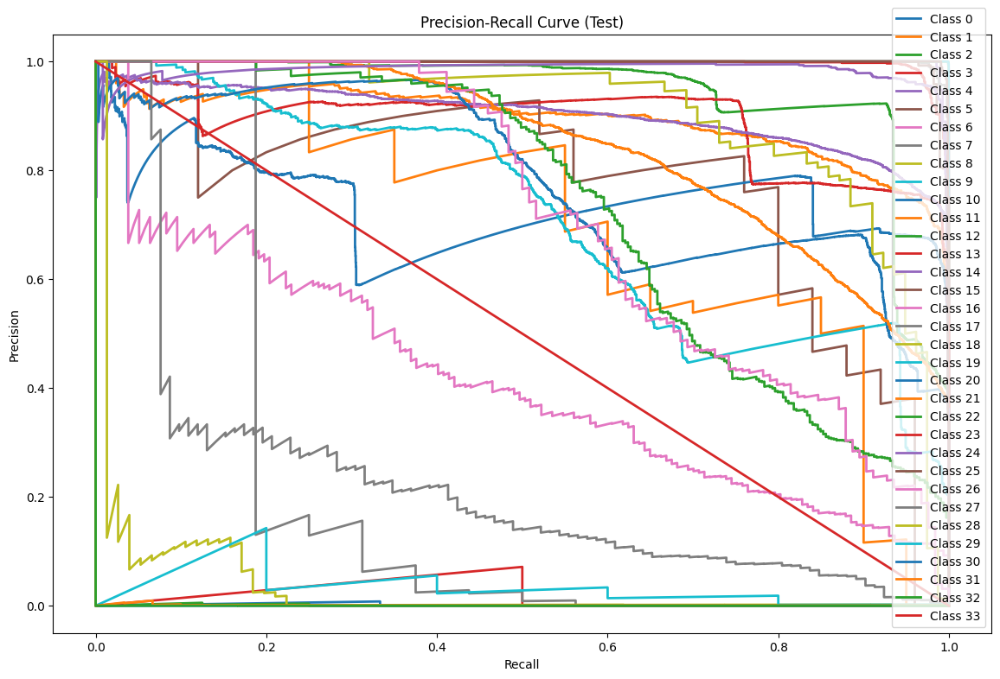

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Metrics (Test):
Accuracy: 86.273166%
Precision: 58.492372%
Recall: 58.237768%
F1 Score: 56.862599%
Loss: 0.434626
Elapsed Time: 4.87 seconds


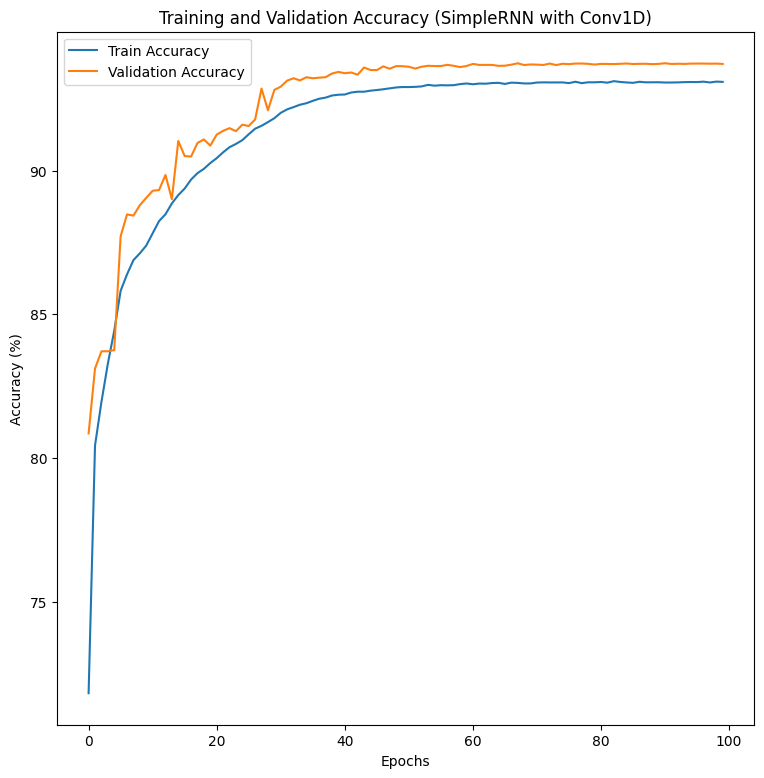

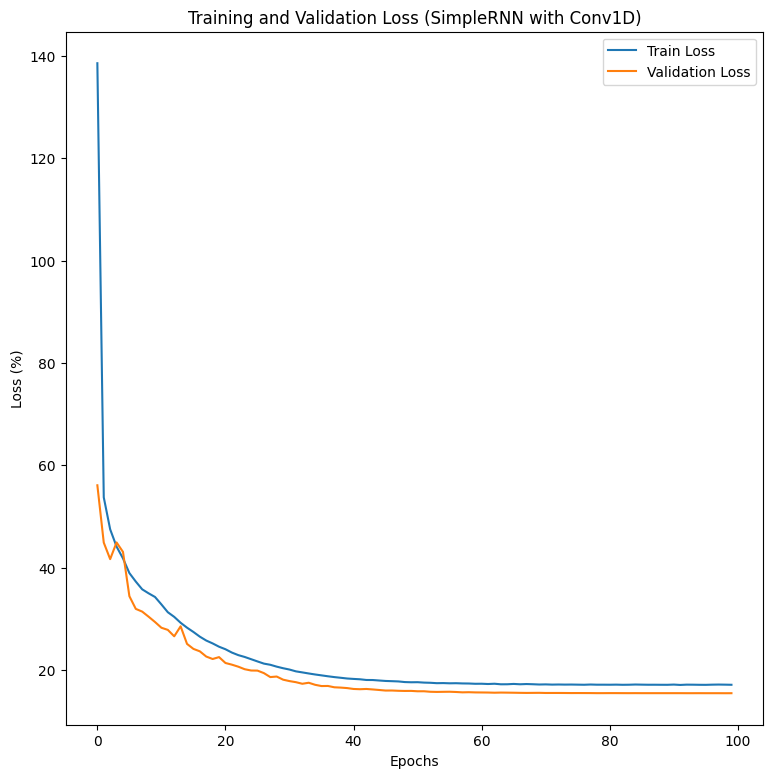

Epoch 1 - Train Loss: 138.5951%, Validation Loss: 56.11%, Train Accuracy: 71.81%, Validation Accuracy: 80.85%
Epoch 2 - Train Loss: 53.7475%, Validation Loss: 44.90%, Train Accuracy: 80.43%, Validation Accuracy: 83.11%
Epoch 3 - Train Loss: 47.4971%, Validation Loss: 41.67%, Train Accuracy: 81.94%, Validation Accuracy: 83.71%
Epoch 4 - Train Loss: 44.1193%, Validation Loss: 44.93%, Train Accuracy: 83.28%, Validation Accuracy: 83.71%
Epoch 5 - Train Loss: 41.8193%, Validation Loss: 43.08%, Train Accuracy: 84.42%, Validation Accuracy: 83.75%
Epoch 6 - Train Loss: 38.9468%, Validation Loss: 34.43%, Train Accuracy: 85.82%, Validation Accuracy: 87.72%
Epoch 7 - Train Loss: 37.2856%, Validation Loss: 31.95%, Train Accuracy: 86.39%, Validation Accuracy: 88.48%
Epoch 8 - Train Loss: 35.7709%, Validation Loss: 31.42%, Train Accuracy: 86.89%, Validation Accuracy: 88.44%
Epoch 9 - Train Loss: 34.9900%, Validation Loss: 30.42%, Train Accuracy: 87.12%, Validation Accuracy: 88.80%
Epoch 10 - Train L

In [ ]:

def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(17, 17))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")


evaluate_model(model_rnn_cnn, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=34, dataset_name="Validation")
evaluate_model(model_rnn_cnn, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=34, dataset_name="Test")


plt.figure(figsize=(9, 9))
plt.plot(np.array(history_rnn_cnn.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_rnn_cnn.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (SimpleRNN with Conv1D)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_rnn_cnn.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_rnn_cnn.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (SimpleRNN with Conv1D)')
plt.legend()
plt.show()



for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_rnn_cnn.history['loss'],
                                                                      history_rnn_cnn.history['val_loss'],
                                                                      history_rnn_cnn.history['accuracy'],
                                                                      history_rnn_cnn.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")

In [ ]:
import pickle
with open('history_rnn_cnn.pkl', 'wb') as file:
    pickle.dump(history_rnn_cnn.history, file)

#***GRU+CNN***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# CNN_GRU Model
model_gru_cnn = Sequential()
model_gru_cnn.add(Conv1D(64, 3, activation='relu', input_shape=X_TON_IOT_train.shape[1:]))
model_gru_cnn.add(MaxPooling1D(pool_size=2))
model_gru_cnn.add(Conv1D(128, 3, activation='relu'))
model_gru_cnn.add(MaxPooling1D(pool_size=2))
model_gru_cnn.add(GRU(128, activation='tanh', return_sequences=True, kernel_regularizer=l2(0.01)))
model_gru_cnn.add(BatchNormalization())
model_gru_cnn.add(Dropout(0.5))
model_gru_cnn.add(GRU(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_gru_cnn.add(BatchNormalization())
model_gru_cnn.add(Dropout(0.5))
model_gru_cnn.add(Flatten())
model_gru_cnn.add(Dense(34, activation='softmax'))

model_gru_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])


start_time = time.time()

history_gru_cnn = model_gru_cnn.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                                    validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                                    callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time



 # training_time
print(f"Le temps d'entraînement du modèle GRU est de {training_time:.2f} secondes.")


Epoch 1/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - accuracy: 0.5985 - loss: 2.4199 - val_accuracy: 0.7124 - val_loss: 0.8017 - learning_rate: 0.0010
Epoch 2/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - accuracy: 0.7891 - loss: 0.6043 - val_accuracy: 0.7763 - val_loss: 0.6101 - learning_rate: 0.0010
Epoch 3/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 17s 25ms/step - accuracy: 0.8183 - loss: 0.4987 - val_accuracy: 0.8269 - val_loss: 0.5088 - learning_rate: 0.0010
Epoch 4/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.8380 - loss: 0.4440 - val_accuracy: 0.8272 - val_loss: 0.4367 - learning_rate: 0.0010
Epoch 5/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - accuracy: 0.8534 - loss: 0.4055 - val_accuracy: 0.8430 - val_loss: 0.3938 - learning_rate: 0.0010
Epoch 6/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 20s 25ms/step - accuracy: 0.8615 - loss: 0.3820 - val_accuracy: 0.8273 - val_loss: 0.4666 - learning_rate: 0.0010
Epoch 7/100
670/670 ━━━━━━━━━━━━━━━━━━━━ 21s 26ms/step - accuracy: 0.8

7144/7144 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   0.999700  1.000000  0.999850      6669
           1   0.960440  0.908802  0.933908      6919
           2   0.998085  1.000000  0.999042      6777
           3   0.998972  1.000000  0.999486      6805
           4   0.998194  0.999849  0.999021      6633
           5   0.999556  1.000000  0.999778      6758
           6   1.000000  0.998216  0.999107      6727
           7   0.997921  0.999554  0.998737      6723
           8   0.999407  0.999704  0.999556      6749
           9   1.000000  0.998796  0.999398      6646
          10   0.993803  0.964227  0.978792      6653
          11   0.997761  1.000000  0.998879      6683
          12   0.972360  0.995532  0.983809      6714
          13   0.996568  0.994786  0.995676      6713
          14   0.997174  0.992450  0.994806      6755
          15   0.998804  0.999701  0.999252      6684


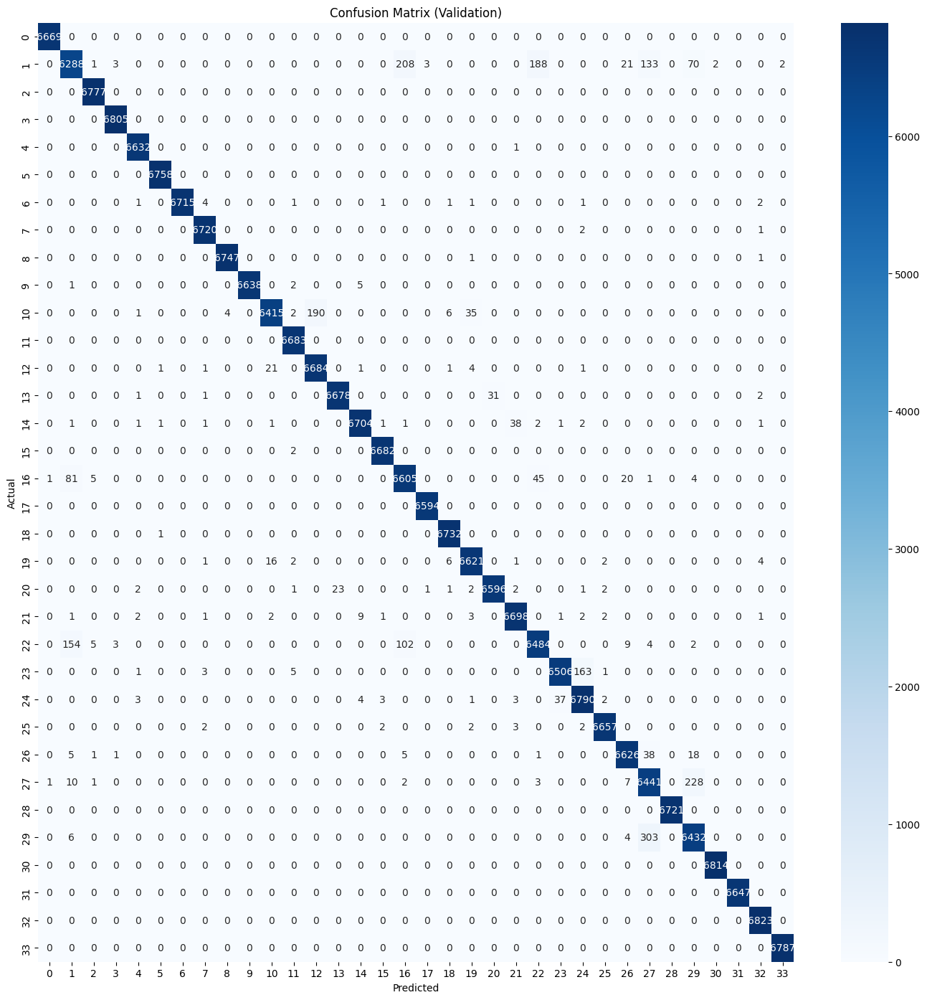

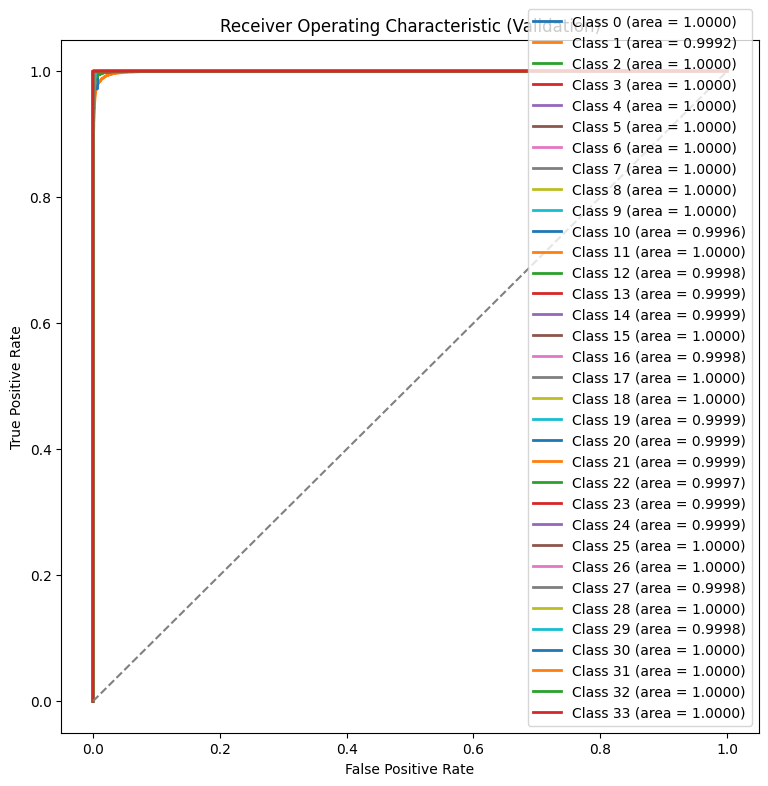

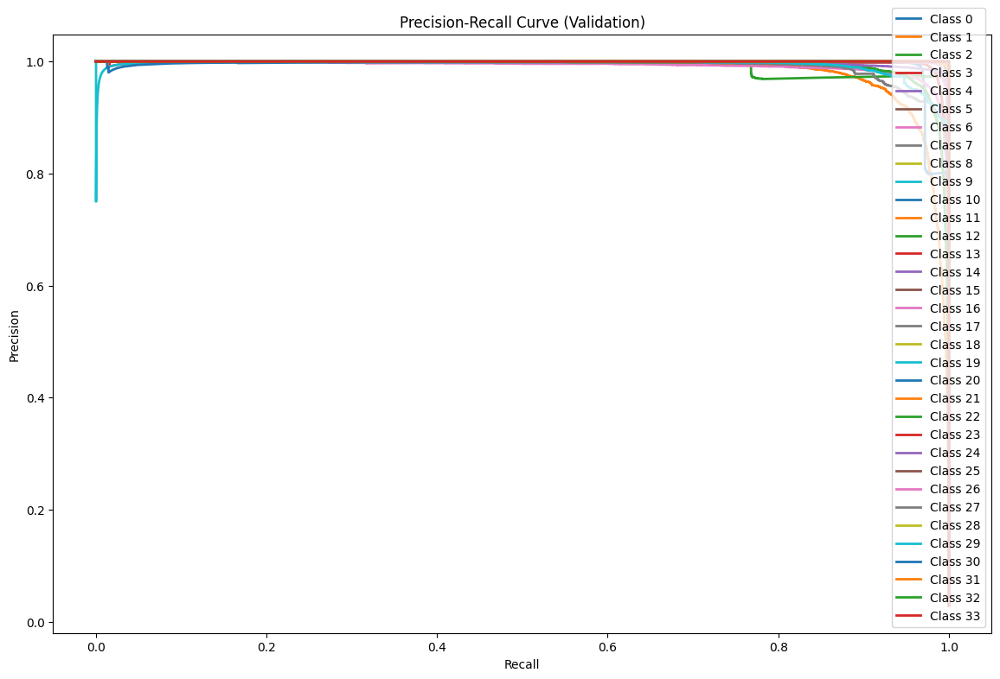


Metrics (Validation):
Accuracy: 98.944361%
Precision: 98.954817%
Recall: 98.951559%
F1 Score: 98.948265%
Loss: 0.047502
Elapsed Time: 20.63 seconds
1368/1368 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   0.000000  0.000000  0.000000         3
           1   0.842708  0.806580  0.824249      1003
           2   0.000000  0.000000  0.000000         8
           3   0.000000  0.000000  0.000000         2
           4   0.978495  0.992727  0.985560       275
           5   0.642857  0.720000  0.679245        25
           6   0.999698  0.999096  0.999397      6637
           7   0.974239  0.981132  0.977673       424
           8   0.999744  0.999232  0.999488      3905
           9   1.000000  0.998962  0.999481      3854
          10   0.993517  0.961317  0.977152      3826
          11   0.590909  0.650000  0.619048        20
          12   0.963146  0.995800  0.979200      3333
          13   0.997

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


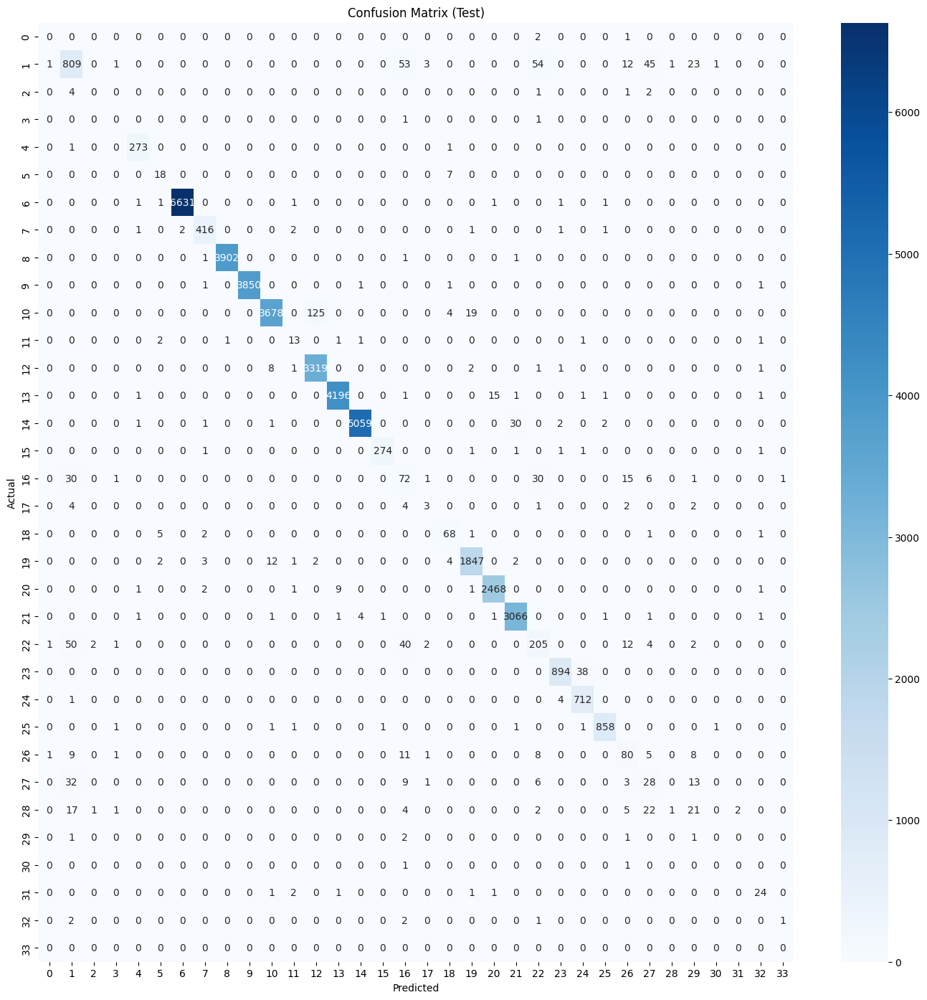

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


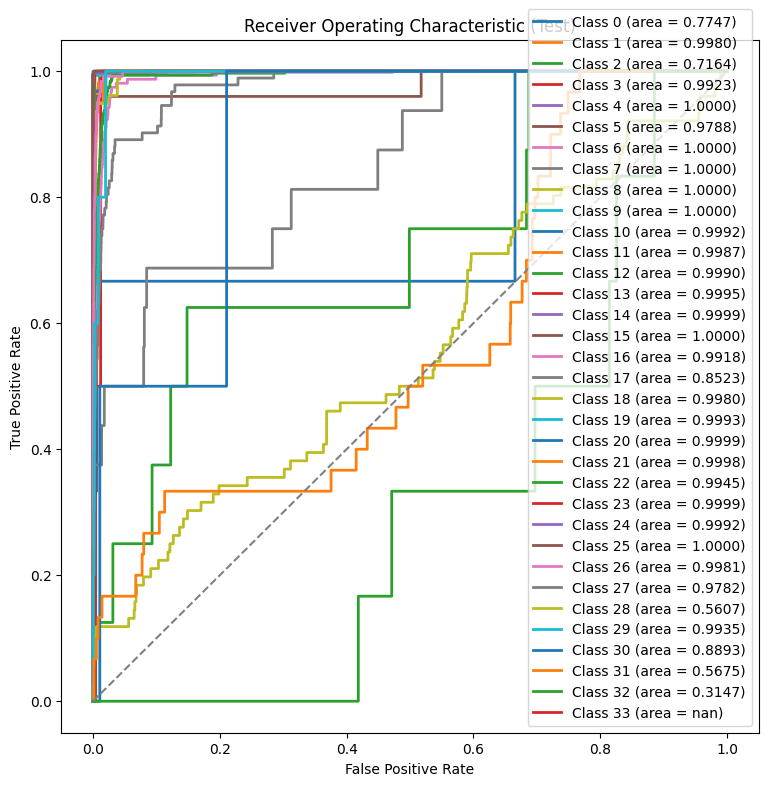

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_ranking.py:980: UserWarning: No positive class found in y_true, recall is set to one for all thresholds.
  warnings.warn(


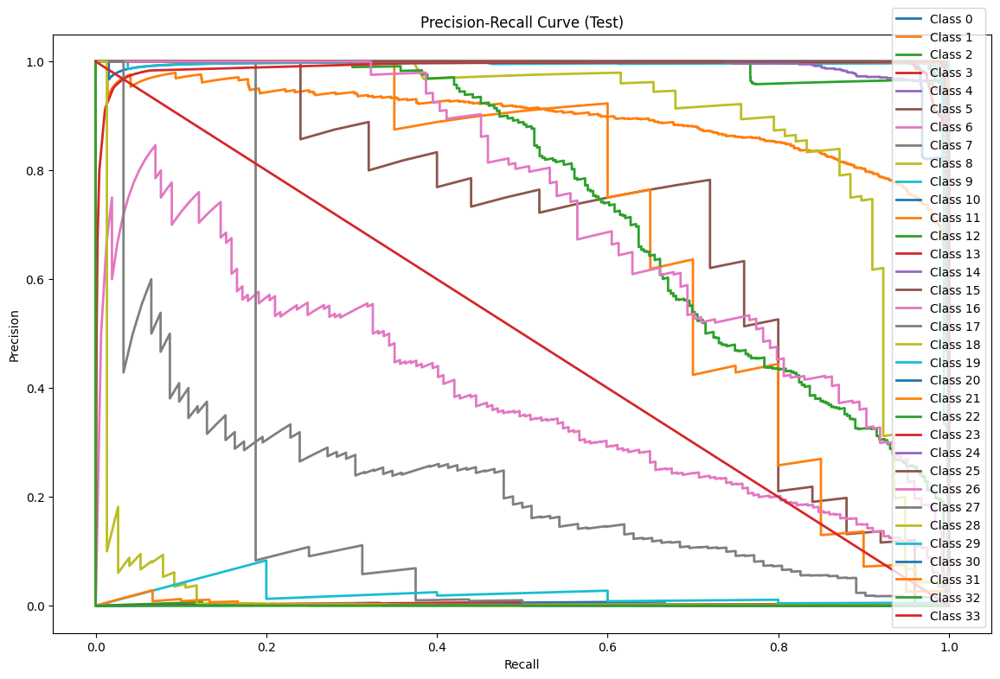

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))



Metrics (Test):
Accuracy: 97.669157%
Precision: 62.696422%
Recall: 62.690328%
F1 Score: 61.702931%
Loss: 0.180356
Elapsed Time: 5.20 seconds


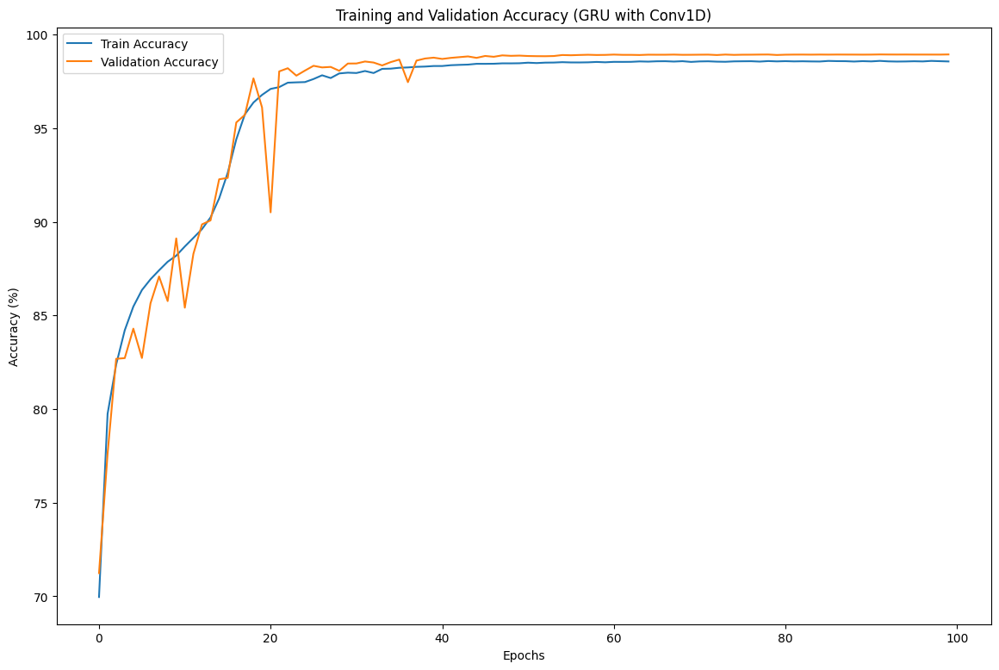

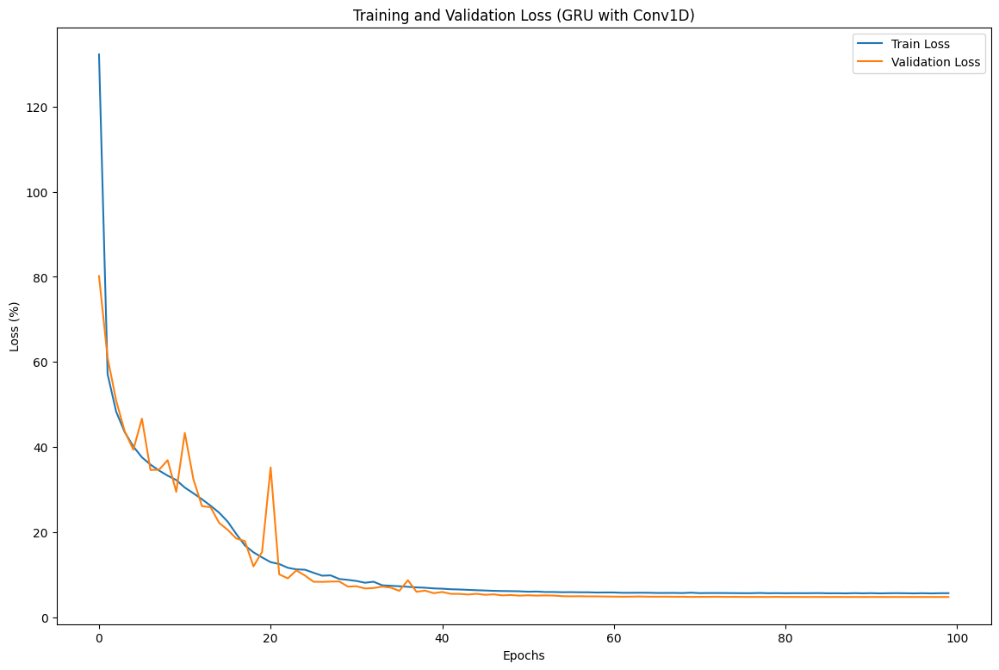

Epoch 1 - Train Loss: 132.2544%, Validation Loss: 80.17%, Train Accuracy: 69.96%, Validation Accuracy: 71.24%
Epoch 2 - Train Loss: 57.1218%, Validation Loss: 61.01%, Train Accuracy: 79.75%, Validation Accuracy: 77.63%
Epoch 3 - Train Loss: 48.2915%, Validation Loss: 50.88%, Train Accuracy: 82.38%, Validation Accuracy: 82.69%
Epoch 4 - Train Loss: 43.4853%, Validation Loss: 43.67%, Train Accuracy: 84.21%, Validation Accuracy: 82.72%
Epoch 5 - Train Loss: 40.1203%, Validation Loss: 39.38%, Train Accuracy: 85.48%, Validation Accuracy: 84.30%
Epoch 6 - Train Loss: 37.5788%, Validation Loss: 46.66%, Train Accuracy: 86.36%, Validation Accuracy: 82.73%
Epoch 7 - Train Loss: 35.8678%, Validation Loss: 34.60%, Train Accuracy: 86.93%, Validation Accuracy: 85.65%
Epoch 8 - Train Loss: 34.4648%, Validation Loss: 34.66%, Train Accuracy: 87.42%, Validation Accuracy: 87.08%
Epoch 9 - Train Loss: 33.2704%, Validation Loss: 36.90%, Train Accuracy: 87.87%, Validation Accuracy: 85.77%
Epoch 10 - Train L

In [ ]:
def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(17, 17))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")



evaluate_model(model_gru_cnn, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=34, dataset_name="Validation")
evaluate_model(model_gru_cnn, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=34, dataset_name="Test")




plt.figure(figsize=(14, 9))
plt.plot(np.array(history_gru_cnn.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_gru_cnn.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (GRU with Conv1D)')
plt.legend()
plt.show()

plt.figure(figsize=(14, 9))
plt.plot(np.array(history_gru_cnn.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_gru_cnn.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (GRU with Conv1D)')
plt.legend()
plt.show()



for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_gru_cnn.history['loss'],
                                                                      history_gru_cnn.history['val_loss'],
                                                                      history_gru_cnn.history['accuracy'],
                                                                      history_gru_cnn.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")

In [ ]:
import pickle
with open('history_gru_cnn.pkl', 'wb') as file:
    pickle.dump(history_gru_cnn.history, file)

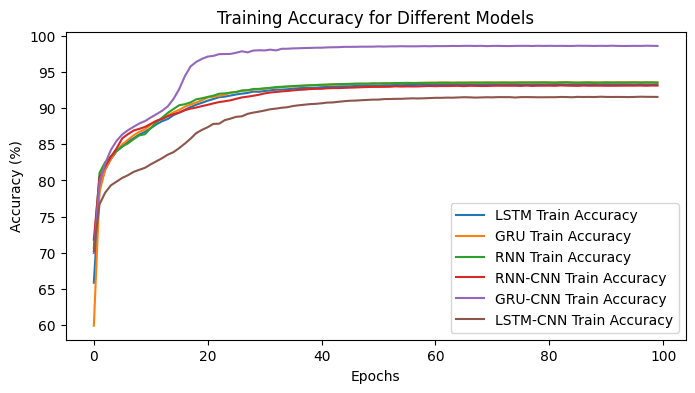

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pickle

# Load the history objects for different models
with open('history_lstm.pkl', 'rb') as file:
    history_lstm = pickle.load(file)
with open('history_gru.pkl', 'rb') as file:
    history_gru = pickle.load(file)
with open('history_rnn.pkl', 'rb') as file:
    history_rnn = pickle.load(file)
with open('history_rnn_cnn.pkl', 'rb') as file:
    history_rnn_cnn = pickle.load(file)
with open('history_gru_cnn.pkl', 'rb') as file:
    history_gru_cnn = pickle.load(file)
with open('history_lstm_cnn.pkl', 'rb') as file:
    history_lstm_cnn = pickle.load(file)

# Plotting the training accuracy curves
plt.figure(figsize=(8, 4))
plt.plot(np.array(history_lstm['accuracy']) * 100, label='LSTM Train Accuracy')
plt.plot(np.array(history_gru['accuracy']) * 100, label='GRU Train Accuracy')
plt.plot(np.array(history_rnn['accuracy']) * 100, label='RNN Train Accuracy')
plt.plot(np.array(history_rnn_cnn['accuracy']) * 100, label='RNN-CNN Train Accuracy')
plt.plot(np.array(history_gru_cnn['accuracy']) * 100, label='GRU-CNN Train Accuracy')
plt.plot(np.array(history_lstm_cnn['accuracy']) * 100, label='LSTM-CNN Train Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training Accuracy for Different Models')
plt.legend()
plt.show()



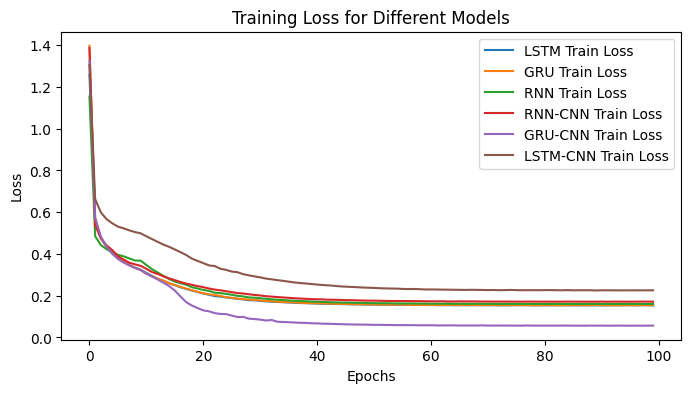

In [ ]:
# Plotting the training loss curves
plt.figure(figsize=(8, 4))
plt.plot(history_lstm['loss'], label='LSTM Train Loss')
plt.plot(history_gru['loss'], label='GRU Train Loss')
plt.plot(history_rnn['loss'], label='RNN Train Loss')
plt.plot(history_rnn_cnn['loss'], label='RNN-CNN Train Loss')
plt.plot(history_gru_cnn['loss'], label='GRU-CNN Train Loss')
plt.plot(history_lstm_cnn['loss'], label='LSTM-CNN Train Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss for Different Models')
plt.legend()
plt.show()


#***X_IIoTID***

In [ ]:
# Load the dataset with low_memory=False to suppress the warning
df_Edge_IIoTset = pd.read_csv('/content/drive/MyDrive/X-IIoTID dataset.csv', low_memory=False)

# Print the shape of the DataFrame
shape = df_Edge_IIoTset.shape
print(shape)


(820834, 68)


In [ ]:
df_Edge_IIoTset.head()

,Date,Timestamp,Scr_IP,Scr_port,Des_IP,Des_port,Protocol,Service,Duration,Scr_bytes,...,OSSEC_alert_level,Login_attempt,Succesful_login,File_activity,Process_activity,read_write_physical.process,is_privileged,class1,class2,class3
0,9/01/2020,1578540956,192.168.2.199,49278,192.168.2.10,80,tcp,http,0.67369,13437,...,5,0,0,0,0,0,0,Scanning_vulnerability,Reconnaissance,Attack
1,13/01/2020,1578871873,10.0.1.5,39769,131.236.3.92,53,udp,dns,0.000083,78,...,0,0,0,0,0,0,0,Normal,Normal,Normal
2,9/01/2020,1578522486,172.24.1.80,59050,172.24.1.1,53,udp,dns,0.000132,38,...,0,0,0,0,0,0,0,Normal,Normal,Normal
3,27/02/2020,1582757640,192.168.2.196,37966,192.168.2.10,1880,tcp,websocket,9.378481,1121,...,0,1,1,1,1,1,1,Normal,Normal,Normal
4,16/12/2019,1576452612,172.24.1.80,38233,172.24.1.1,53,udp,dns,0.000074,-,...,0,0,0,0,0,0,0,Normal,Normal,Normal


In [ ]:
df_Edge_IIoTset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 820834 entries, 0 to 820833
Data columns (total 68 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   Date                         820503 non-null  object
 1   Timestamp                    820537 non-null  object
 2   Scr_IP                       820834 non-null  object
 3   Scr_port                     820834 non-null  object
 4   Des_IP                       820834 non-null  object
 5   Des_port                     820834 non-null  object
 6   Protocol                     820834 non-null  object
 7   Service                      820834 non-null  object
 8   Duration                     820834 non-null  object
 9   Scr_bytes                    820834 non-null  object
 10  Des_bytes                    820834 non-null  object
 11  Conn_state                   820834 non-null  int64 
 12  missed_bytes                 820834 non-null  object
 13  is_syn_only   

In [ ]:
df_Edge_IIoTset.head()
print('Dataframe shape: ', shape)
print('Number of rows: ', shape[0])
print('Number of columns: ', shape[1])
#df.shape

Dataframe shape:  (820834, 68)
Number of rows:  820834
Number of columns:  68


In [ ]:
df_Edge_IIoTset.isnull().sum()

,0
Date,331
Timestamp,297
Scr_IP,0
Scr_port,0
Des_IP,0
Des_port,0
Protocol,0
Service,0
Duration,0
Scr_bytes,0


In [ ]:
import pandas as pd

# Adjust display settings to show all columns
pd.set_option('display.max_rows', None)

# Count the number of null values in each column
null_counts = df_Edge_IIoTset.isnull().sum()

# Print the null counts for each column
print(null_counts)

# Reset the display settings if needed
pd.reset_option('display.max_rows')


Date                           331
Timestamp                      297
Scr_IP                           0
Scr_port                         0
Des_IP                           0
Des_port                         0
Protocol                         0
Service                          0
Duration                         0
Scr_bytes                        0
Des_bytes                        0
Conn_state                       0
missed_bytes                     0
is_syn_only                      0
Is_SYN_ACK                       0
is_pure_ack                      0
is_with_payload                  0
FIN or RST                       0
Bad_checksum                     0
is_SYN_with_RST                  0
Scr_pkts                         0
Scr_ip_bytes                     0
Des_pkts                         0
Des_ip_bytes                     0
anomaly_alert                    0
total_bytes                      0
total_packet                     0
paket_rate                       0
byte_rate           

In [ ]:
df_Edge_IIoTset[df_Edge_IIoTset.duplicated()].shape

(6222, 68)

In [ ]:
# Display the duplicate rows
duplicate_rows = df_Edge_IIoTset[df_Edge_IIoTset.duplicated()]
print(duplicate_rows)

              Date   Timestamp          Scr_IP Scr_port         Des_IP  \
5591    21/01/2020  1579585116  192.168.10.155    50192   192.168.2.10   
5630    22/01/2020  1579642499        10.0.1.5    47366   129.94.0.197   
14297   22/01/2020  1579646142    172.24.1.213    51975     172.24.1.1   
15801   10/02/2020  1580966999    172.24.1.100     5353    224.0.0.251   
17484   21/01/2020  1579571748  192.168.10.155    44790   192.168.2.10   
...            ...         ...             ...      ...            ...   
820582  21/01/2020  1579570754    192.168.2.10    56610  192.168.2.199   
820623  21/01/2020  1579572659  192.168.10.153    53437   192.168.2.10   
820641  21/01/2020  1579572094    192.168.2.10    33124  192.168.2.199   
820771  21/01/2020  1579570246    192.168.2.10    54714  192.168.2.199   
820823  21/01/2020  1579586256   192.168.2.196    45356   192.168.2.10   

       Des_port Protocol    Service  Duration Scr_bytes  ...  \
5591         80      tcp       http  2.412449  

In [ ]:
# Remove duplicate rows and keep the first occurrence
df_Edge_IIoTset_cleaned = df_Edge_IIoTset.drop_duplicates()


In [ ]:

df_Edge_IIoTset_cleaned[df_Edge_IIoTset_cleaned.duplicated()].shape

(0, 68)

In [ ]:
df_Edge_IIoTset_cleaned.shape

(814612, 68)

In [ ]:

df_Edge_IIoTset_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 814612 entries, 0 to 820833
Data columns (total 68 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   Date                         814281 non-null  object
 1   Timestamp                    814315 non-null  object
 2   Scr_IP                       814612 non-null  object
 3   Scr_port                     814612 non-null  object
 4   Des_IP                       814612 non-null  object
 5   Des_port                     814612 non-null  object
 6   Protocol                     814612 non-null  object
 7   Service                      814612 non-null  object
 8   Duration                     814612 non-null  object
 9   Scr_bytes                    814612 non-null  object
 10  Des_bytes                    814612 non-null  object
 11  Conn_state                   814612 non-null  int64 
 12  missed_bytes                 814612 non-null  object
 13  is_syn_only        

In [ ]:
from sklearn.preprocessing import LabelEncoder
columns_to_encode = [
    'Date', 'Timestamp', 'Scr_IP', 'Scr_port', 'Des_IP', 'Des_port',
    'Protocol', 'Service', 'Duration', 'Scr_bytes', 'Des_bytes',
    'missed_bytes', 'Scr_pkts', 'Scr_ip_bytes', 'Des_pkts',
    'Des_ip_bytes', 'anomaly_alert', 'total_bytes', 'total_packet',
    'paket_rate', 'byte_rate', 'Scr_packts_ratio', 'Des_pkts_ratio',
    'Scr_bytes_ratio', 'Des_bytes_ratio', 'Avg_user_time', 'Std_user_time',
    'Avg_nice_time', 'Std_nice_time', 'Avg_system_time', 'Std_system_time',
    'Avg_iowait_time', 'Std_iowait_time', 'Avg_ideal_time', 'Std_ideal_time',
    'Avg_tps', 'Std_tps', 'Avg_rtps', 'Std_rtps', 'Avg_wtps', 'Std_wtps',
    'Avg_ldavg_1', 'Std_ldavg_1', 'Avg_kbmemused', 'Std_kbmemused',
    'Avg_num_Proc/s', 'Std_num_proc/s', 'Avg_num_cswch/s', 'std_num_cswch/s'

]
for column in columns_to_encode:
    le = LabelEncoder()
    df_Edge_IIoTset_cleaned[column] = le.fit_transform(df_Edge_IIoTset_cleaned[column])
df_Edge_IIoTset_cleaned.info()

<ipython-input-16-cc40e15909a5>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Edge_IIoTset_cleaned[column] = le.fit_transform(df_Edge_IIoTset_cleaned[column])
<ipython-input-16-cc40e15909a5>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Edge_IIoTset_cleaned[column] = le.fit_transform(df_Edge_IIoTset_cleaned[column])
<ipython-input-16-cc40e15909a5>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inst

<class 'pandas.core.frame.DataFrame'>
Index: 814612 entries, 0 to 820833
Data columns (total 68 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   Date                         814612 non-null  int64 
 1   Timestamp                    814612 non-null  int64 
 2   Scr_IP                       814612 non-null  int64 
 3   Scr_port                     814612 non-null  int64 
 4   Des_IP                       814612 non-null  int64 
 5   Des_port                     814612 non-null  int64 
 6   Protocol                     814612 non-null  int64 
 7   Service                      814612 non-null  int64 
 8   Duration                     814612 non-null  int64 
 9   Scr_bytes                    814612 non-null  int64 
 10  Des_bytes                    814612 non-null  int64 
 11  Conn_state                   814612 non-null  int64 
 12  missed_bytes                 814612 non-null  int64 
 13  is_syn_only        

<ipython-input-16-cc40e15909a5>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Edge_IIoTset_cleaned[column] = le.fit_transform(df_Edge_IIoTset_cleaned[column])


CODAGE

In [ ]:
df_Edge_IIoTset_cleaned.shape

(814612, 68)

In [ ]:

df_Edge_IIoTset_cleaned = df_Edge_IIoTset_cleaned.drop('class2', axis = 1)

In [ ]:
df_Edge_IIoTset_cleaned = df_Edge_IIoTset_cleaned.drop('class3', axis = 1)

In [ ]:
df_Edge_IIoTset_cleaned.head()

,Date,Timestamp,Scr_IP,Scr_port,Des_IP,Des_port,Protocol,Service,Duration,Scr_bytes,...,std_num_cswch/s,OSSEC_alert,OSSEC_alert_level,Login_attempt,Succesful_login,File_activity,Process_activity,read_write_physical.process,is_privileged,class1
0,47,30649,25,37284,63,6020,2,4,88457,2112,...,4088,1,5,0,0,0,0,0,0,Scanning_vulnerability
1,5,36769,2,27007,12,4973,3,2,83,19237,...,17287,0,0,0,0,0,0,0,0,Normal
2,47,24817,16,47837,51,4973,3,2,132,12458,...,26013,0,0,0,0,0,0,0,0,Normal
3,32,182036,24,25062,63,1192,2,16,324051,779,...,46137,0,0,1,1,1,1,1,1,Normal
4,11,3824,16,25352,51,4973,3,2,74,0,...,34894,0,0,0,0,0,0,0,0,Normal


In [ ]:
X_TON_IOT = df_Edge_IIoTset_cleaned.drop('class1', axis = 1)
y_TON_IOT= df_Edge_IIoTset_cleaned['class1']
X_TON_IOT.shape, y_TON_IOT.shape

((814612, 65), (814612,))

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import train_test_split
X_TON_IOT_train, X_TON_IOT_test,y_TON_IOT_train, y_TON_IOT_test = train_test_split(X_TON_IOT, y_TON_IOT, test_size=0.2, random_state = 1337
)


In [ ]:
df_Edge_IIoTset_cleaned = pd.concat([X_TON_IOT_train, y_TON_IOT_train], axis=1)

In [ ]:
df_Edge_IIoTset_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Index: 651689 entries, 443933 to 266089
Data columns (total 66 columns):
 #   Column                       Non-Null Count   Dtype 
---  ------                       --------------   ----- 
 0   Date                         651689 non-null  int64 
 1   Timestamp                    651689 non-null  int64 
 2   Scr_IP                       651689 non-null  int64 
 3   Scr_port                     651689 non-null  int64 
 4   Des_IP                       651689 non-null  int64 
 5   Des_port                     651689 non-null  int64 
 6   Protocol                     651689 non-null  int64 
 7   Service                      651689 non-null  int64 
 8   Duration                     651689 non-null  int64 
 9   Scr_bytes                    651689 non-null  int64 
 10  Des_bytes                    651689 non-null  int64 
 11  Conn_state                   651689 non-null  int64 
 12  missed_bytes                 651689 non-null  int64 
 13  is_syn_only   

In [ ]:

print(df_Edge_IIoTset_cleaned.groupby("class1").size())

class1
BruteForce                         37735
C&C                                 2326
Dictionary                          1913
Discovering_resources              18439
Exfiltration                       17727
Fake_notification                     25
False_data_injection                4019
Generic_scanning                   39976
MQTT_cloud_broker_subscription     18847
MitM                                  95
Modbus_register_reading             4853
Normal                            334799
RDOS                              113082
Reverse_shell                        807
Scanning_vulnerability             42266
TCP Relay                           1676
crypto-ransomware                    368
fuzzing                              937
insider_malcious                   11799
dtype: int64


In [ ]:

df = df_Edge_IIoTset_cleaned

In [ ]:
# Création des DataFrames filtrés et affectation à des variables numérotées
df_0 = df[df['class1'] == 'BruteForce']
df_1 = df[df['class1'] == 'C&C']
df_2 = df[df['class1'] == 'Dictionary']
df_3 = df[df['class1'] == 'Discovering_resources']
df_4 = df[df['class1'] == 'Exfiltration']
df_5 = df[df['class1'] == 'Fake_notification']
df_6 = df[df['class1'] == 'False_data_injection']
df_7 = df[df['class1'] == 'Generic_scanning']
df_8 = df[df['class1'] == 'MQTT_cloud_broker_subscription']
df_9 = df[df['class1'] == 'MitM']
df_10 = df[df['class1'] == 'Modbus_register_reading']
df_11 = df[df['class1'] == 'Normal']
df_12 = df[df['class1'] == 'RDOS']
df_13 = df[df['class1'] == 'Reverse_shell']
df_14 = df[df['class1'] == 'Scanning_vulnerability']
df_15 = df[df['class1'] == 'TCP Relay']
df_16 = df[df['class1'] == 'crypto-ransomware']
df_17 = df[df['class1'] == 'fuzzing']
df_18 = df[df['class1'] == 'insider_malcious']

In [ ]:
# Échantillonnage pour équilibrer les classes
sample_size = 34300  # Nombre maximum d'échantillons par classe
df_0 = df_0.sample(min(len(df_0), sample_size), random_state=0)
df_1 = df_1.sample(min(len(df_1), sample_size), random_state=0)
df_2 = df_2.sample(min(len(df_2), sample_size), random_state=0)
df_3 = df_3.sample(min(len(df_3), sample_size), random_state=0)
df_4 = df_4.sample(min(len(df_4), sample_size), random_state=0)
df_5 = df_5.sample(min(len(df_5), sample_size), random_state=0)
df_6 = df_6.sample(min(len(df_6), sample_size), random_state=0)
df_7 = df_7.sample(min(len(df_7), sample_size), random_state=0)
df_8 = df_8.sample(min(len(df_8), sample_size), random_state=0)
df_9 = df_9.sample(min(len(df_9), sample_size), random_state=0)
df_10 = df_10.sample(min(len(df_10), sample_size), random_state=0)
df_11 = df_11.sample(min(len(df_11), sample_size), random_state=0)
df_12 = df_12.sample(min(len(df_12), sample_size), random_state=0)
df_13 = df_13.sample(min(len(df_13), sample_size), random_state=0)
df_14 = df_14.sample(min(len(df_14), sample_size), random_state=0)
df_15 = df_15.sample(min(len(df_15), sample_size), random_state=0)
df_16 = df_16.sample(min(len(df_16), sample_size), random_state=0)
df_17 = df_17.sample(min(len(df_17), sample_size), random_state=0)
df_18 = df_18.sample(min(len(df_18), sample_size), random_state=0)

# Concaténation des DataFrames échantillonnés
df_Edge_IIoTset_cleaned = pd.concat([df_0, df_1, df_2, df_3, df_4, df_5, df_6, df_7, df_8, df_9,
                                     df_10, df_11, df_12, df_13, df_14, df_15, df_16, df_17, df_18], axis=0)

# Affichage des statistiques des classes dans le DataFrame équilibré
print('Balanced sampling:')
print(df_Edge_IIoTset_cleaned['class1'].value_counts())

Balanced sampling:
class1
BruteForce                        34300
Scanning_vulnerability            34300
Generic_scanning                  34300
RDOS                              34300
Normal                            34300
MQTT_cloud_broker_subscription    18847
Discovering_resources             18439
Exfiltration                      17727
insider_malcious                  11799
Modbus_register_reading            4853
False_data_injection               4019
C&C                                2326
Dictionary                         1913
TCP Relay                          1676
fuzzing                             937
Reverse_shell                       807
crypto-ransomware                   368
MitM                                 95
Fake_notification                    25
Name: count, dtype: int64


In [ ]:
X_TON_IOT = df_Edge_IIoTset_cleaned.drop('class1', axis = 1)
y_TON_IOT= df_Edge_IIoTset_cleaned['class1']
X_TON_IOT.shape, y_TON_IOT.shape

((255331, 65), (255331,))

In [ ]:
from imblearn.over_sampling import SMOTE

# Création de l'échaantillonneur SMOTE-TOMEK
smt = SMOTE(random_state=42) #
# Application de SMOTE-TOMEK pour équilibrer les classes
X_TON_IOT_train, y_TON_IOT_train = smt.fit_resample(X_TON_IOT, y_TON_IOT)

In [ ]:
y_TON_IOT_train.value_counts()

,count
class1,
BruteForce,34300
C&C,34300
Dictionary,34300
Discovering_resources,34300
Exfiltration,34300
Fake_notification,34300
False_data_injection,34300
Generic_scanning,34300
MQTT_cloud_broker_subscription,34300


In [ ]:
X_TON_IOT_train, X_TON_IOT_valid,y_TON_IOT_train, y_TON_IOT_valid = train_test_split(X_TON_IOT_train, y_TON_IOT_train, test_size=0.25, random_state = 1337
)

In [ ]:
y_TON_IOT_test.value_counts()

,count
class1,
Normal,83454
RDOS,28179
Scanning_vulnerability,10559
Generic_scanning,10277
BruteForce,9506
Discovering_resources,4709
MQTT_cloud_broker_subscription,4677
Exfiltration,4407
insider_malcious,2945


In [ ]:
y_TON_IOT_train.value_counts()

,count
class1,
Fake_notification,25856
Dictionary,25852
Generic_scanning,25824
Reverse_shell,25805
Normal,25799
Discovering_resources,25788
BruteForce,25785
Modbus_register_reading,25784
insider_malcious,25766


In [ ]:
y_TON_IOT_valid.value_counts()

,count
class1,
MQTT_cloud_broker_subscription,8838
crypto-ransomware,8728
False_data_injection,8713
MitM,8641
C&C,8625
Scanning_vulnerability,8601
fuzzing,8599
RDOS,8594
TCP Relay,8578


In [ ]:


from sklearn.preprocessing import StandardScaler
scaling = StandardScaler()
X_TON_IOT_train = scaling.fit_transform(X_TON_IOT_train)


In [ ]:
X_TON_IOT_valid = scaling.transform(X_TON_IOT_valid)
X_TON_IOT_test2 = scaling.transform(X_TON_IOT_test)

In [ ]:
#For CNN and CNN-LSTM
print(X_TON_IOT_train.shape)
X_TON_IOT_train = X_TON_IOT_train.reshape(X_TON_IOT_train.shape[0], X_TON_IOT_train.shape[1], 1)
X_TON_IOT_valid = X_TON_IOT_valid.reshape(X_TON_IOT_valid.shape[0], X_TON_IOT_valid.shape[1], 1)
X_TON_IOT_test2 = X_TON_IOT_test2.reshape(X_TON_IOT_test2.shape[0], X_TON_IOT_test2.shape[1], 1)
print(X_TON_IOT_train.shape)

(488775, 65)
(488775, 65, 1)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import LabelEncoder


label_encoder = LabelEncoder()
y_TON_IOT_train_encoded = label_encoder.fit_transform(y_TON_IOT_train)
y_TON_IOT_valid_encoded = label_encoder.transform(y_TON_IOT_valid)


num_classes = len(label_encoder.classes_)
y_TON_IOT_train_one_hot = to_categorical(y_TON_IOT_train_encoded, num_classes=num_classes)
y_TON_IOT_valid_one_hot = to_categorical(y_TON_IOT_valid_encoded, num_classes=num_classes)

In [ ]:

print(num_classes)

19


In [ ]:

classes = label_encoder.classes_
for index, class_label in enumerate(classes):
    print(f"Classe {class_label} -> Numéro {index}")

Classe BruteForce -> Numéro 0
Classe C&C -> Numéro 1
Classe Dictionary -> Numéro 2
Classe Discovering_resources -> Numéro 3
Classe Exfiltration -> Numéro 4
Classe Fake_notification -> Numéro 5
Classe False_data_injection -> Numéro 6
Classe Generic_scanning -> Numéro 7
Classe MQTT_cloud_broker_subscription -> Numéro 8
Classe MitM -> Numéro 9
Classe Modbus_register_reading -> Numéro 10
Classe Normal -> Numéro 11
Classe RDOS -> Numéro 12
Classe Reverse_shell -> Numéro 13
Classe Scanning_vulnerability -> Numéro 14
Classe TCP Relay -> Numéro 15
Classe crypto-ransomware -> Numéro 16
Classe fuzzing -> Numéro 17
Classe insider_malcious -> Numéro 18



# ***lstm***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns
import time
import numpy as np


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
# LSTM Model
model_lstm = Sequential()
model_lstm.add(LSTM(128, activation='tanh', return_sequences=True, input_shape=X_TON_IOT_train.shape[1:], kernel_regularizer=l2(0.01)))
model_lstm.add(BatchNormalization())
model_lstm.add(Dropout(0.5))
model_lstm.add(LSTM(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_lstm.add(BatchNormalization())
model_lstm.add(Dropout(0.5))
model_lstm.add(Dense(19, activation='softmax'))

model_lstm.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()

history_lstm = model_lstm.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                              validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                              callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


# training_time
print(f"Le temps d'entraînement du modèle LSTM est de {training_time:.2f} secondes.")

Epoch 1/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 47s 94ms/step - accuracy: 0.6027 - loss: 2.1207 - val_accuracy: 0.4691 - val_loss: 2.3396 - learning_rate: 0.0010
Epoch 2/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 84s 98ms/step - accuracy: 0.9666 - loss: 0.1759 - val_accuracy: 0.9872 - val_loss: 0.0814 - learning_rate: 0.0010
Epoch 3/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 82s 99ms/step - accuracy: 0.9855 - loss: 0.0872 - val_accuracy: 0.9912 - val_loss: 0.0588 - learning_rate: 0.0010
Epoch 4/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 81s 98ms/step - accuracy: 0.9896 - loss: 0.0643 - val_accuracy: 0.9942 - val_loss: 0.0448 - learning_rate: 0.0010
Epoch 5/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 47s 98ms/step - accuracy: 0.9920 - loss: 0.0521 - val_accuracy: 0.9955 - val_loss: 0.0381 - learning_rate: 0.0010
Epoch 6/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 83s 99ms/step - accuracy: 0.9936 - loss: 0.0457 - val_accuracy: 0.9963 - val_loss: 0.0349 - learning_rate: 0.0010
Epoch 7/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 46s 97ms/step - accuracy: 0.9

In [ ]:
print(f"Le temps d'entraînement du modèle LSTM est de {training_time:.2f} secondes.")

Le temps d'entraînement du modèle LSTM est de 7327.51 secondes.


In [ ]:
import pickle
with open('history_lstm.pkl', 'wb') as file:
    pickle.dump(history_lstm.history, file)

5092/5092 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      8515
           1   0.999536  0.999768  0.999652      8625
           2   0.999882  1.000000  0.999941      8448
           3   0.997188  1.000000  0.998592      8512
           4   0.999767  0.999650  0.999708      8567
           5   1.000000  1.000000  1.000000      8444
           6   0.999770  0.999885  0.999828      8713
           7   0.999410  1.000000  0.999705      8476
           8   0.999774  0.999661  0.999717      8838
           9   1.000000  1.000000  1.000000      8641
          10   1.000000  1.000000  1.000000      8516
          11   0.999051  0.991060  0.995040      8501
          12   0.999419  1.000000  0.999709      8594
          13   1.000000  1.000000  1.000000      8495
          14   0.999767  0.999186  0.999477      8601
          15   0.997674  1.000000  0.998836      8578


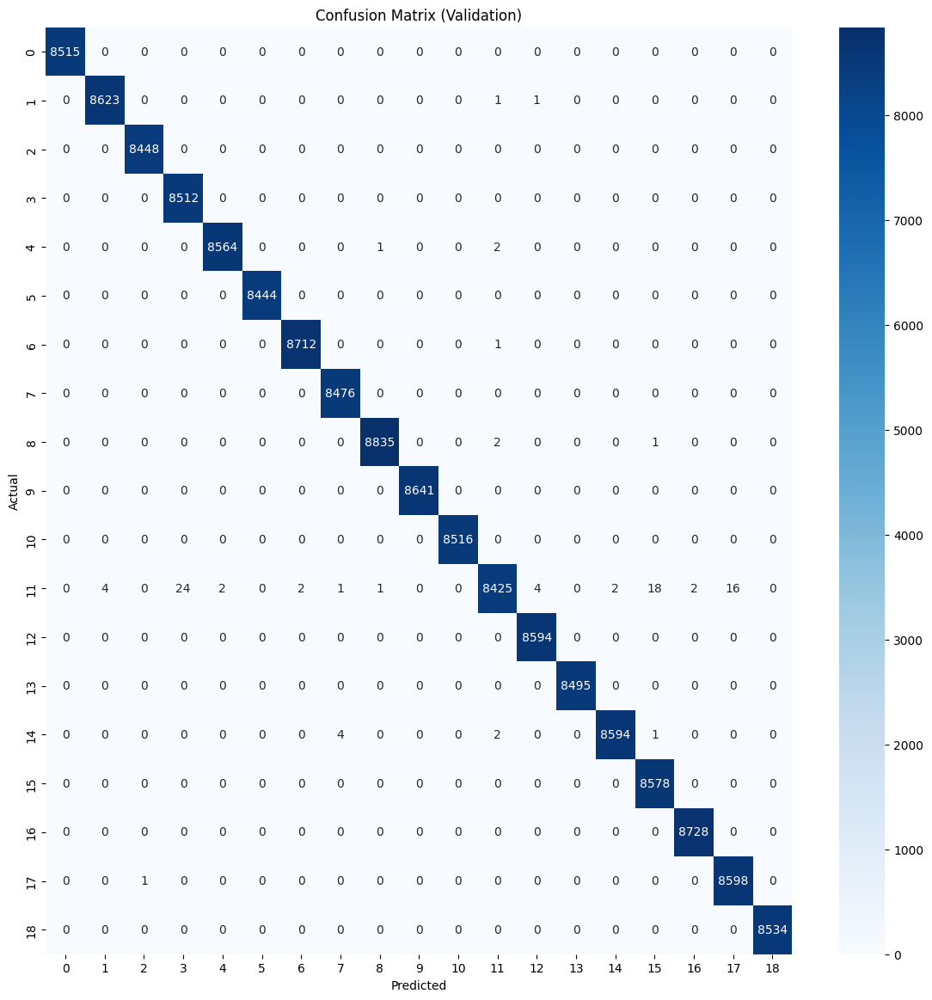

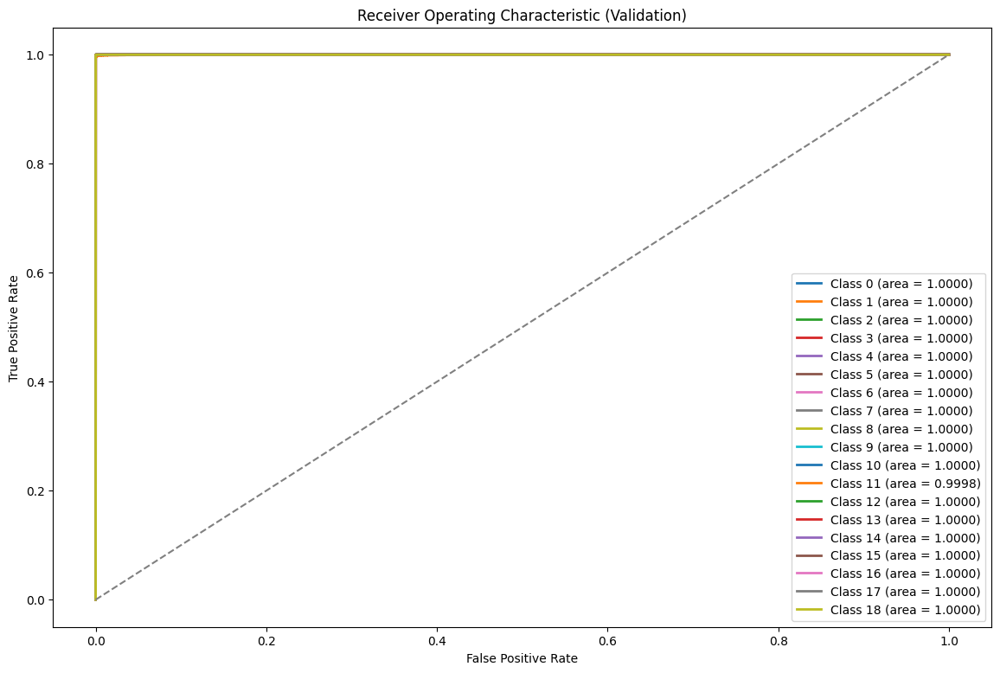

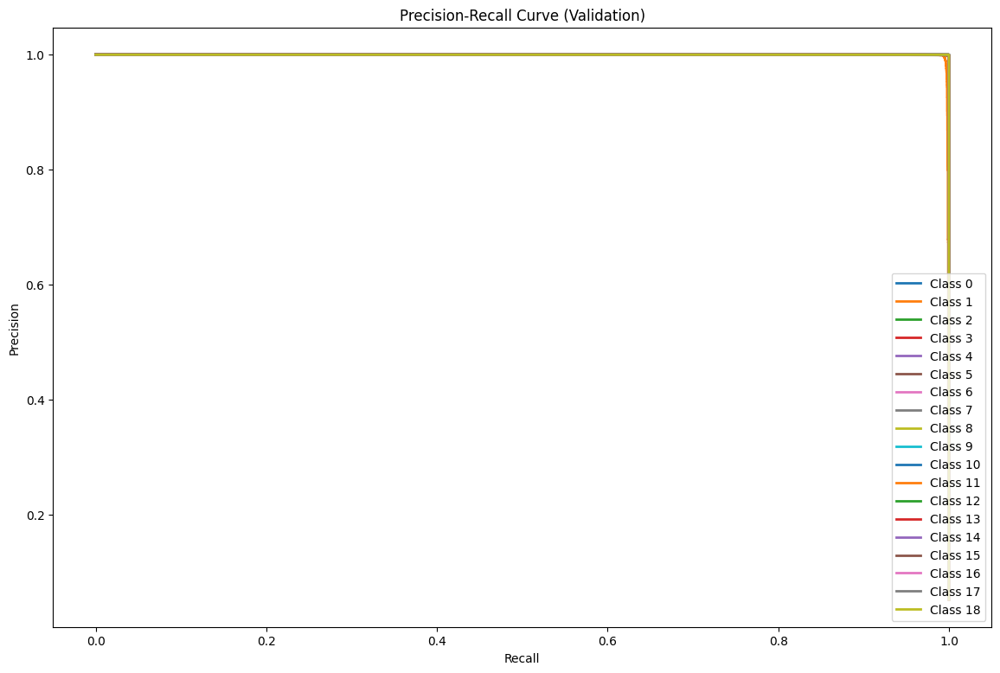


Metrics (Validation):
Accuracy: 99.942919%
Precision: 99.942906%
Recall: 99.942597%
F1 Score: 99.942644%
Loss: 0.004453
Elapsed Time: 20.92 seconds
5092/5092 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   0.999895  1.000000  0.999947      9506
           1   0.956989  0.994413  0.975342       537
           2   0.996183  1.000000  0.998088       522
           3   0.954951  0.999363  0.976652      4709
           4   0.998640  0.999773  0.999206      4407
           5   0.750000  1.000000  0.857143         3
           6   0.994450  1.000000  0.997217      1075
           7   0.999416  0.999903  0.999660     10277
           8   0.995528  0.999572  0.997546      4677
           9   1.000000  1.000000  1.000000        22
          10   0.996377  1.000000  0.998185      1100
          11   0.999843  0.991648  0.995729     83454
          12   0.999326  1.000000  0.999663     28179
          13   0.94

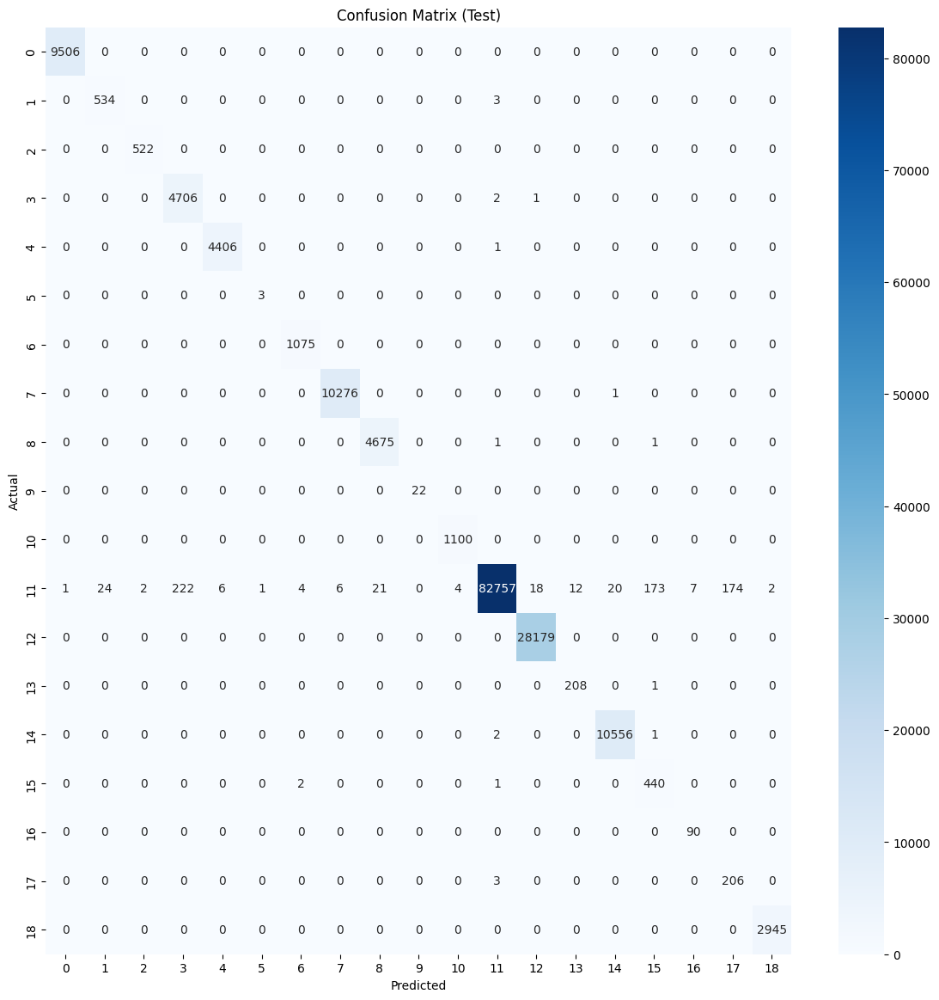

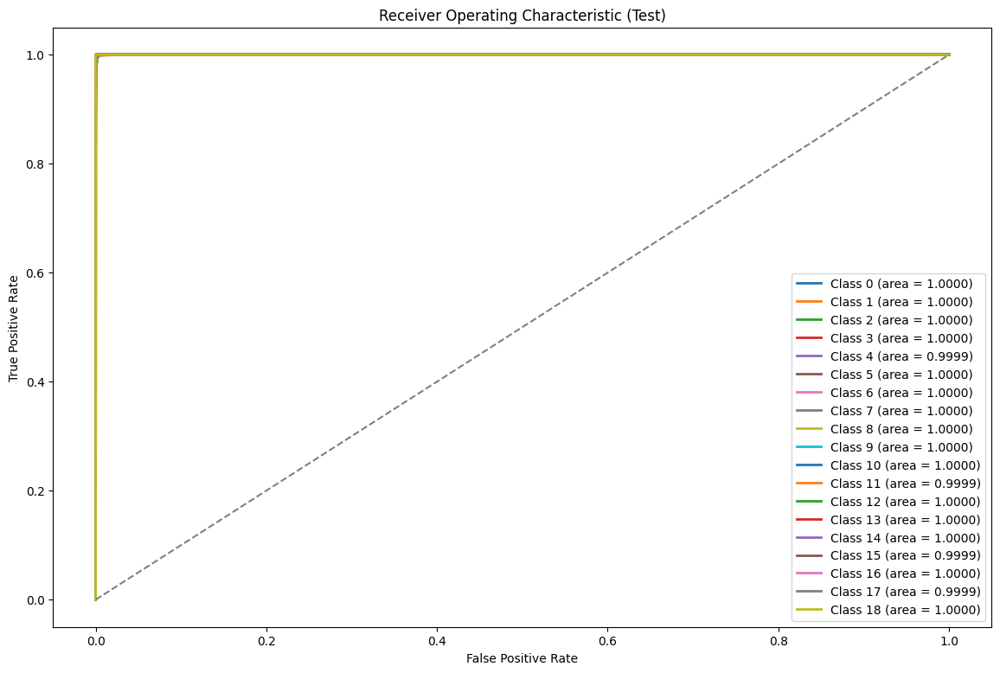

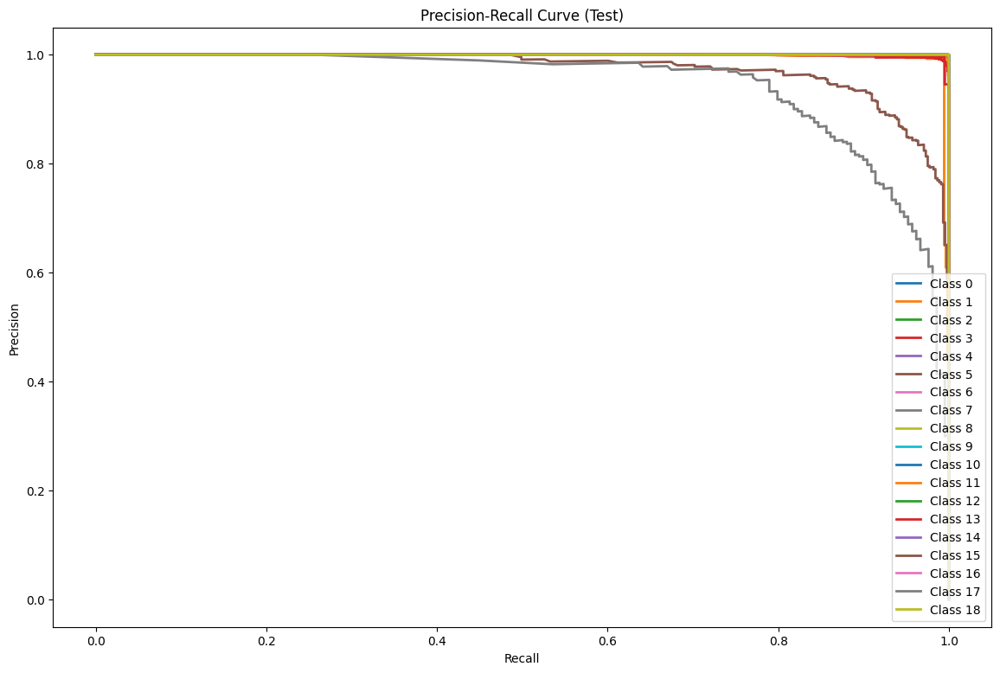


Metrics (Test):
Accuracy: 99.559915%
Precision: 93.519027%
Recall: 99.781462%
F1 Score: 96.082269%
Loss: 0.023091
Elapsed Time: 20.63 seconds


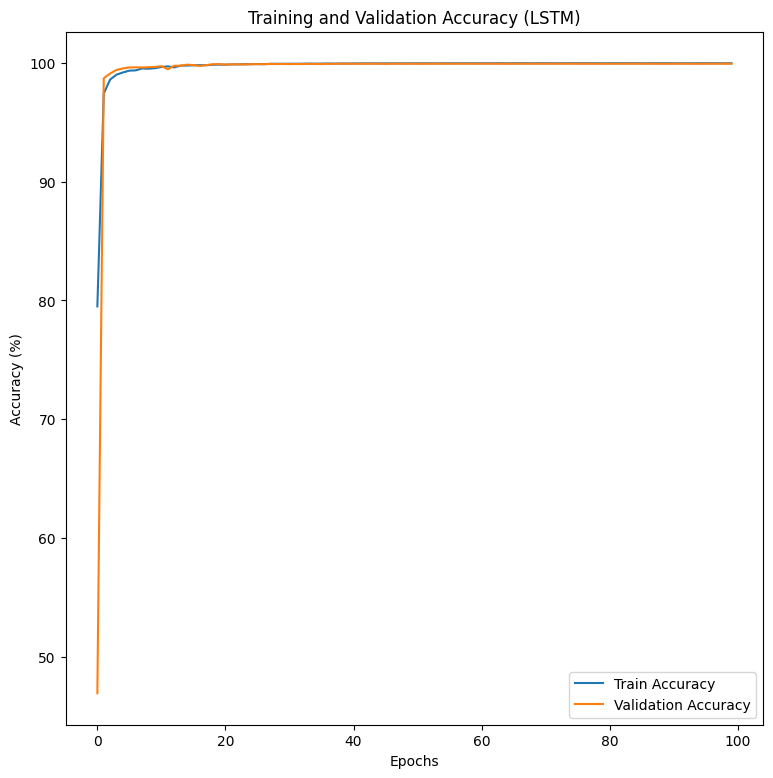

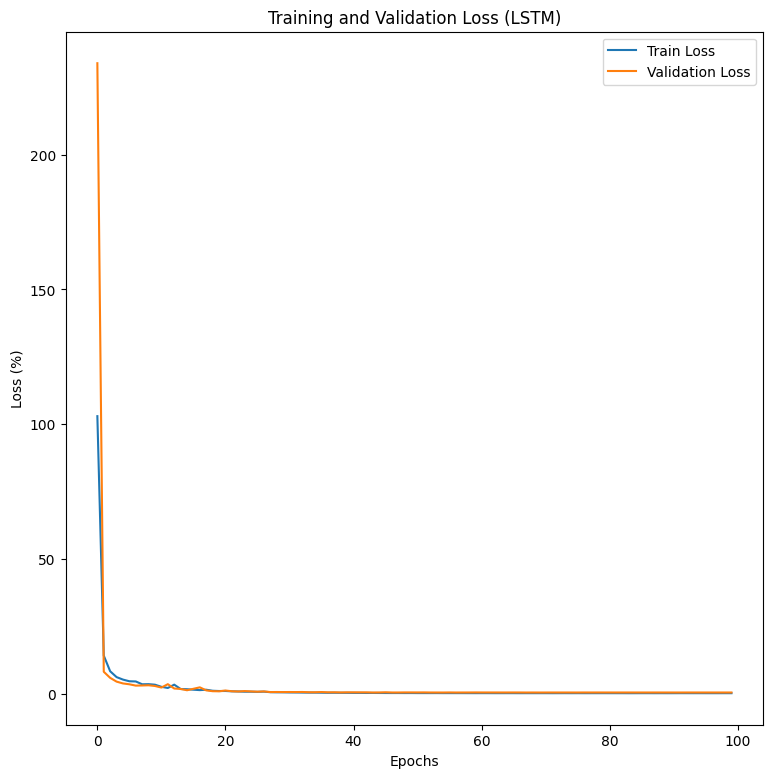

Epoch 1 - Train Loss: 102.9875%, Validation Loss: 233.96%, Train Accuracy: 79.50%, Validation Accuracy: 46.91%
Epoch 2 - Train Loss: 14.1315%, Validation Loss: 8.14%, Train Accuracy: 97.44%, Validation Accuracy: 98.72%
Epoch 3 - Train Loss: 8.3249%, Validation Loss: 5.88%, Train Accuracy: 98.61%, Validation Accuracy: 99.12%
Epoch 4 - Train Loss: 6.1617%, Validation Loss: 4.48%, Train Accuracy: 99.03%, Validation Accuracy: 99.42%
Epoch 5 - Train Loss: 5.2358%, Validation Loss: 3.81%, Train Accuracy: 99.21%, Validation Accuracy: 99.55%
Epoch 6 - Train Loss: 4.6166%, Validation Loss: 3.49%, Train Accuracy: 99.36%, Validation Accuracy: 99.63%
Epoch 7 - Train Loss: 4.5442%, Validation Loss: 3.00%, Train Accuracy: 99.38%, Validation Accuracy: 99.64%
Epoch 8 - Train Loss: 3.4923%, Validation Loss: 3.05%, Train Accuracy: 99.54%, Validation Accuracy: 99.63%
Epoch 9 - Train Loss: 3.5393%, Validation Loss: 3.13%, Train Accuracy: 99.52%, Validation Accuracy: 99.65%
Epoch 10 - Train Loss: 3.3386%, 

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import label_binarize, LabelEncoder
import time


def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(14, 14))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")


label_encoder = LabelEncoder()
y_TON_IOT_test2_encoded = label_encoder.fit_transform(y_TON_IOT_test)

y_TON_IOT_test2_one_hot = tf.keras.utils.to_categorical(y_TON_IOT_test2_encoded, num_classes=num_classes)


evaluate_model(model_lstm, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes, dataset_name="Validation")

evaluate_model(model_lstm, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes, dataset_name="Test")


plt.figure(figsize=(9, 9))
plt.plot(np.array(history_lstm.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_lstm.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (LSTM)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_lstm.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_lstm.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (LSTM)')
plt.legend()
plt.show()



for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_lstm.history['loss'],
                                                                      history_lstm.history['val_loss'],
                                                                      history_lstm.history['accuracy'],
                                                                      history_lstm.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")


In [ ]:
import pickle
with open('history_lstm.pkl', 'wb') as file:
    pickle.dump(history_lstm.history, file)

# ***GRU***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns
import time
import numpy as np


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# GRU Model
model_gru = Sequential()
model_gru.add(GRU(128, activation='tanh', return_sequences=True, input_shape=X_TON_IOT_train.shape[1:], kernel_regularizer=l2(0.01)))
model_gru.add(BatchNormalization())
model_gru.add(Dropout(0.5))
model_gru.add(GRU(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_gru.add(BatchNormalization())
model_gru.add(Dropout(0.5))
model_gru.add(Dense(19, activation='softmax'))

model_gru.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()
# Entraînement du modèle GRU
history_gru = model_gru.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                            validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                            callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


# training_time
print(f"Le temps d'entraînement du modèle GRU est de {training_time:.2f} secondes.")

Epoch 1/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 42s 83ms/step - accuracy: 0.4706 - loss: 2.4307 - val_accuracy: 0.4157 - val_loss: 2.6184 - learning_rate: 0.0010
Epoch 2/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - accuracy: 0.9856 - loss: 0.1049 - val_accuracy: 0.9936 - val_loss: 0.0487 - learning_rate: 0.0010
Epoch 3/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.9938 - loss: 0.0483 - val_accuracy: 0.9964 - val_loss: 0.0304 - learning_rate: 0.0010
Epoch 4/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 41s 82ms/step - accuracy: 0.9963 - loss: 0.0322 - val_accuracy: 0.9980 - val_loss: 0.0226 - learning_rate: 0.0010
Epoch 5/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - accuracy: 0.9974 - loss: 0.0244 - val_accuracy: 0.9981 - val_loss: 0.0207 - learning_rate: 0.0010
Epoch 6/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 39s 82ms/step - accuracy: 0.9956 - loss: 0.0365 - val_accuracy: 0.9986 - val_loss: 0.0162 - learning_rate: 0.0010
Epoch 7/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 41s 83ms/step - accuracy: 0.9

5092/5092 ━━━━━━━━━━━━━━━━━━━━ 16s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      8515
           1   1.000000  1.000000  1.000000      8625
           2   1.000000  1.000000  1.000000      8448
           3   0.999765  1.000000  0.999883      8512
           4   1.000000  1.000000  1.000000      8567
           5   1.000000  1.000000  1.000000      8444
           6   0.999656  1.000000  0.999828      8713
           7   0.999646  1.000000  0.999823      8476
           8   0.999774  0.999887  0.999830      8838
           9   1.000000  1.000000  1.000000      8641
          10   1.000000  1.000000  1.000000      8516
          11   0.999882  0.996000  0.997937      8501
          12   0.999884  1.000000  0.999942      8594
          13   1.000000  1.000000  1.000000      8495
          14   1.000000  0.999767  0.999884      8601
          15   0.998371  1.000000  0.999185      8578


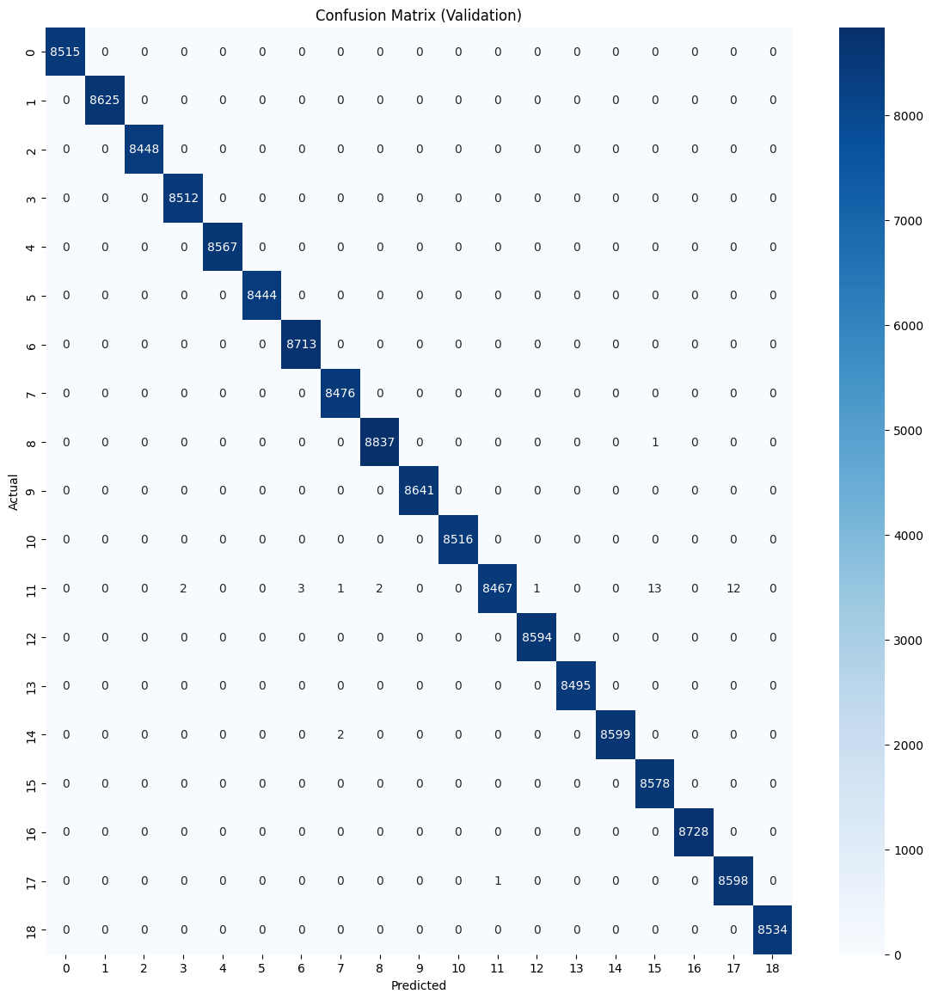

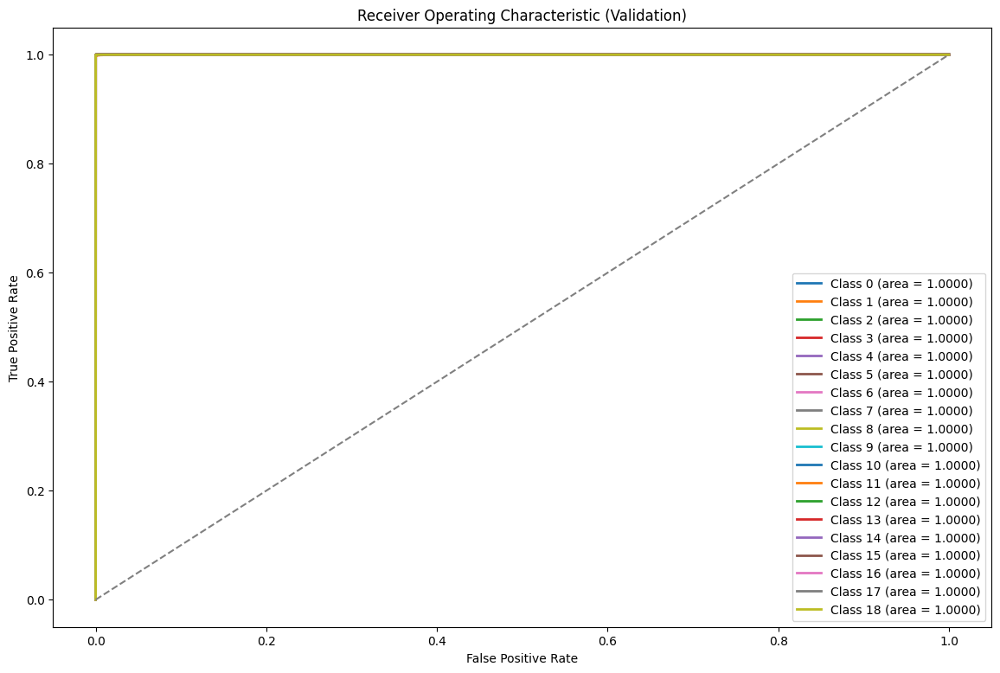

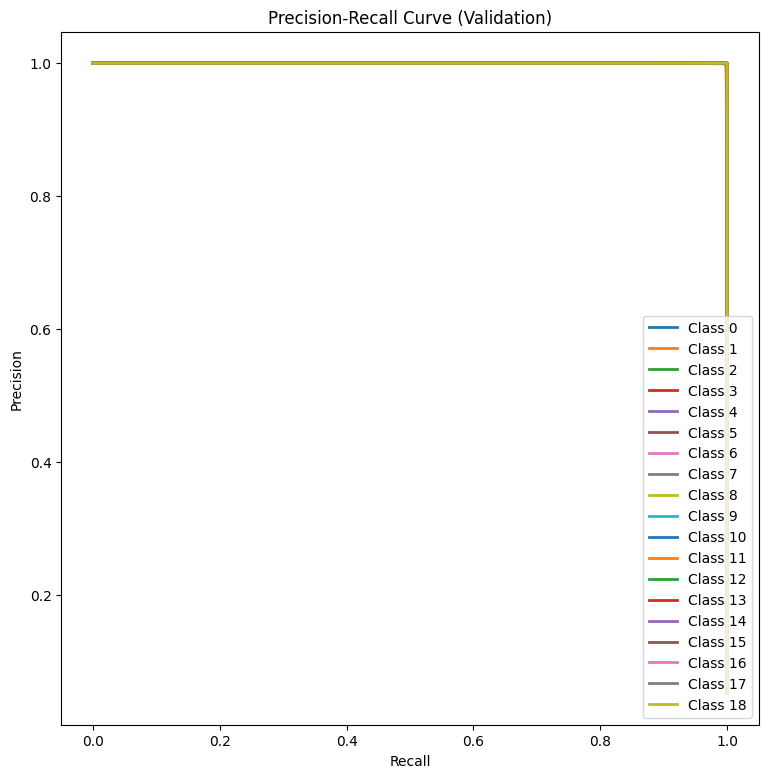


Metrics (Validation):
Accuracy: 99.976676%
Precision: 99.976754%
Recall: 99.976518%
F1 Score: 99.976610%
Loss: 0.001920
Elapsed Time: 20.63 seconds
5092/5092 ━━━━━━━━━━━━━━━━━━━━ 20s 4ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      9506
           1   0.994444  1.000000  0.997214       537
           2   0.998088  1.000000  0.999043       522
           3   0.994929  1.000000  0.997458      4709
           4   0.999093  0.999773  0.999433      4407
           5   0.500000  1.000000  0.666667         3
           6   0.993530  1.000000  0.996755      1075
           7   0.999611  1.000000  0.999805     10277
           8   0.999145  1.000000  0.999573      4677
           9   1.000000  1.000000  1.000000        22
          10   0.998183  0.999091  0.998637      1100
          11   0.999940  0.996621  0.998278     83454
          12   0.999610  1.000000  0.999805     28179
          13   0.99

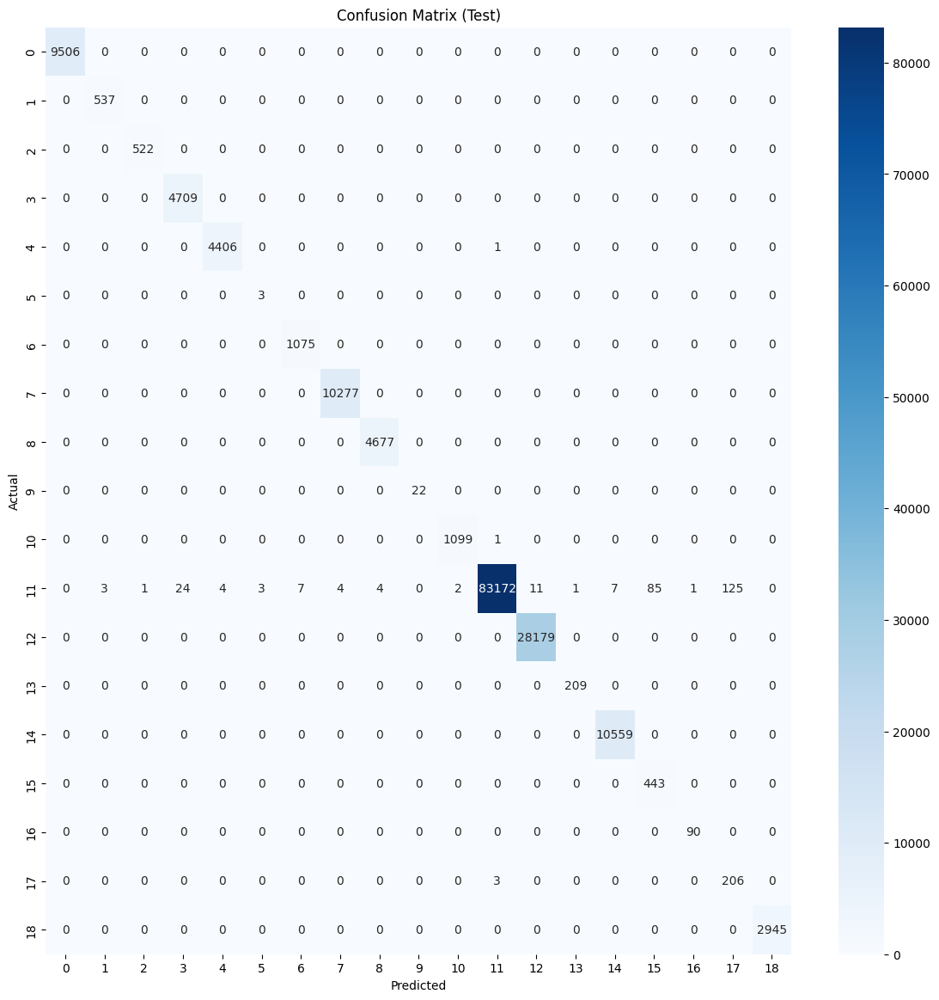

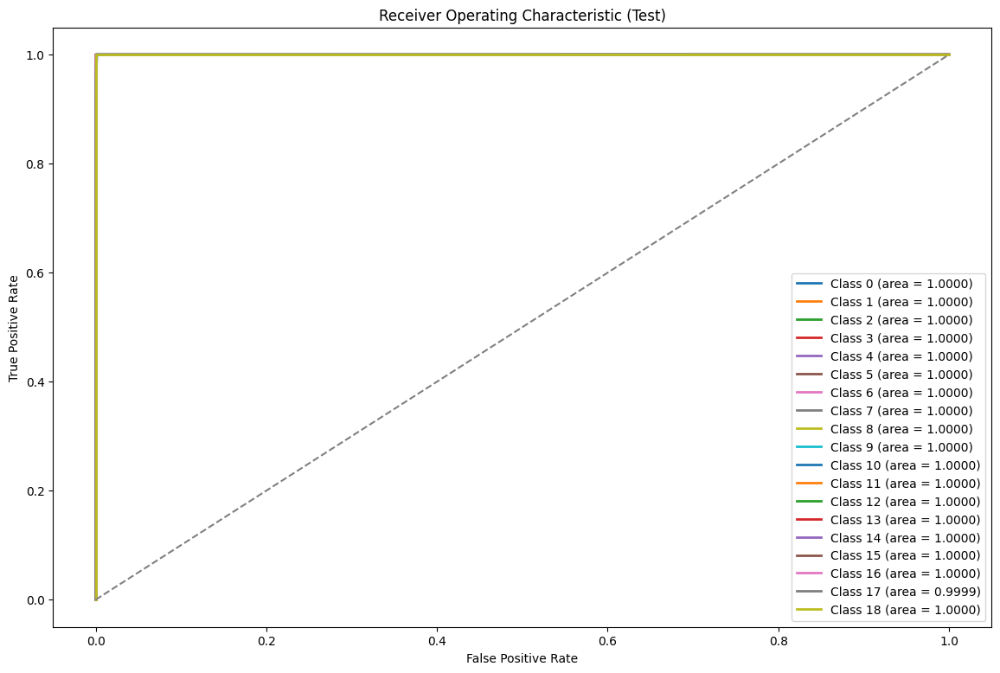

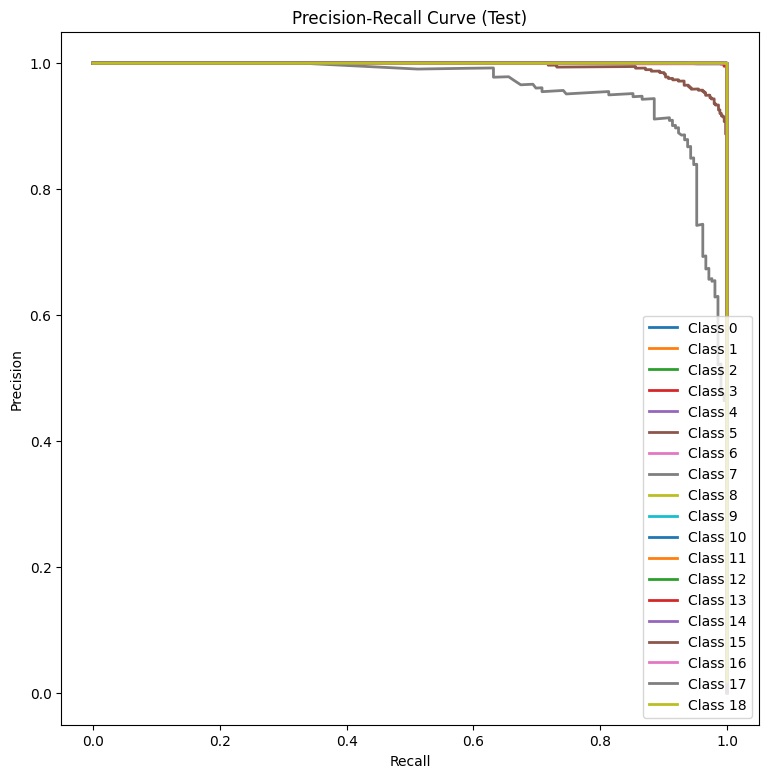


Metrics (Test):
Accuracy: 99.823843%
Precision: 94.323857%
Recall: 99.900689%
F1 Score: 96.420258%
Loss: 0.009592
Elapsed Time: 41.12 seconds


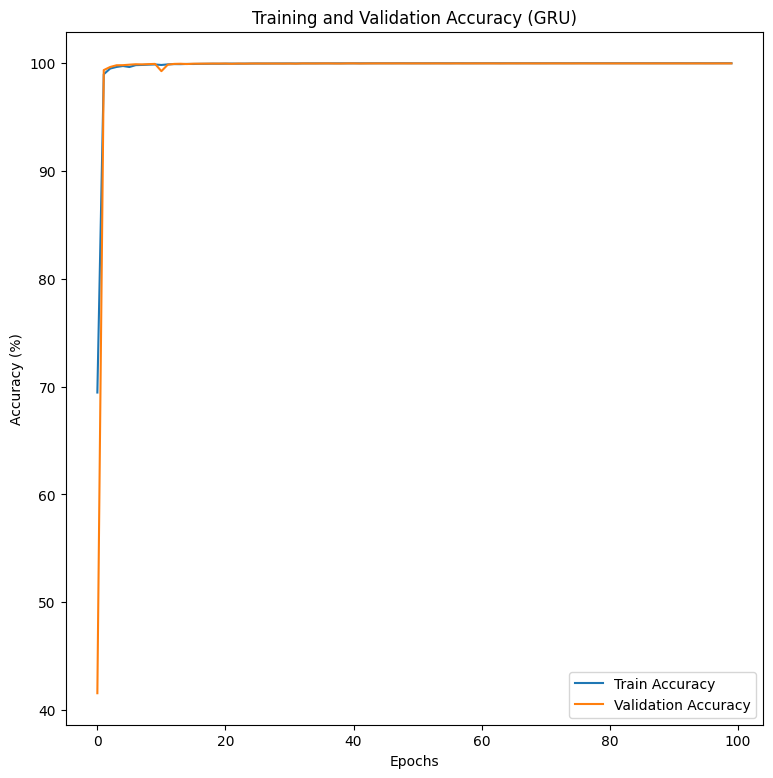

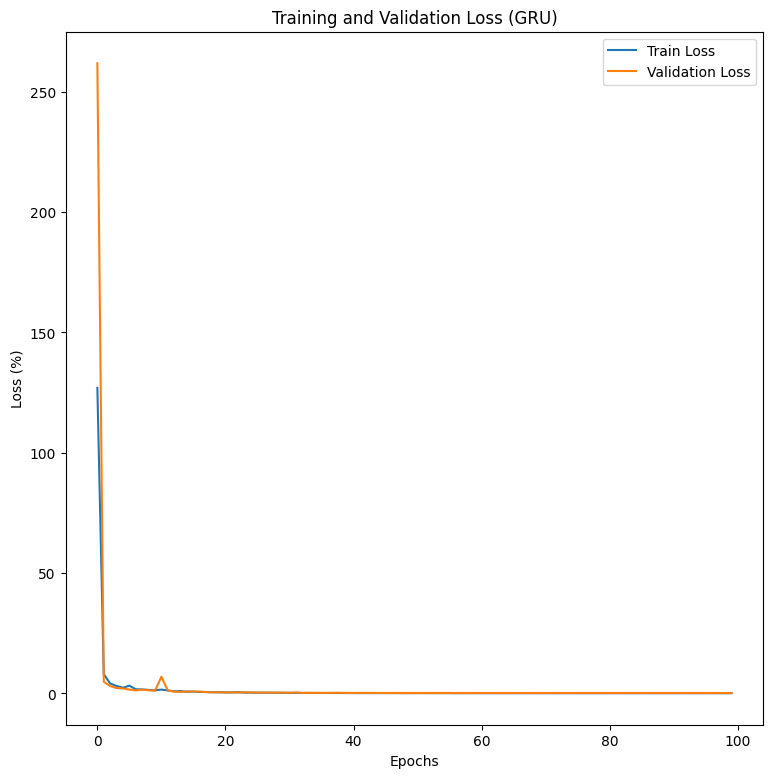

Epoch 1 - Train Loss: 126.9768%, Validation Loss: 261.84%, Train Accuracy: 69.45%, Validation Accuracy: 41.57%
Epoch 2 - Train Loss: 8.0230%, Validation Loss: 4.87%, Train Accuracy: 98.97%, Validation Accuracy: 99.36%
Epoch 3 - Train Loss: 4.1475%, Validation Loss: 3.04%, Train Accuracy: 99.50%, Validation Accuracy: 99.64%
Epoch 4 - Train Loss: 3.0908%, Validation Loss: 2.26%, Train Accuracy: 99.65%, Validation Accuracy: 99.80%
Epoch 5 - Train Loss: 2.3931%, Validation Loss: 2.07%, Train Accuracy: 99.74%, Validation Accuracy: 99.81%
Epoch 6 - Train Loss: 3.2253%, Validation Loss: 1.62%, Train Accuracy: 99.64%, Validation Accuracy: 99.86%
Epoch 7 - Train Loss: 1.7424%, Validation Loss: 1.28%, Train Accuracy: 99.82%, Validation Accuracy: 99.90%
Epoch 8 - Train Loss: 1.6671%, Validation Loss: 1.61%, Train Accuracy: 99.83%, Validation Accuracy: 99.89%
Epoch 9 - Train Loss: 1.4721%, Validation Loss: 1.32%, Train Accuracy: 99.86%, Validation Accuracy: 99.91%
Epoch 10 - Train Loss: 1.3016%, V

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import tensorflow as tf
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score
from sklearn.preprocessing import label_binarize, LabelEncoder
import time


def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(14, 14))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()

    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")


label_encoder = LabelEncoder()
y_TON_IOT_test2_encoded = label_encoder.fit_transform(y_TON_IOT_test)


y_TON_IOT_test2_one_hot = tf.keras.utils.to_categorical(y_TON_IOT_test2_encoded, num_classes=19)


evaluate_model(model_gru, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=19, dataset_name="Validation")
evaluate_model(model_gru, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=19, dataset_name="Test")



plt.figure(figsize=(9, 9))
plt.plot(np.array(history_gru.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_gru.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (GRU)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_gru.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_gru.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (GRU)')
plt.legend()
plt.show()




for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_gru.history['loss'],
                                                                      history_gru.history['val_loss'],
                                                                      history_gru.history['accuracy'],
                                                                      history_gru.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")


In [ ]:
import pickle
with open('history_gru.pkl', 'wb') as file:
    pickle.dump(history_gru.history, file)

# **RNN**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


# RNN Model
model_rnn = Sequential()
model_rnn.add(SimpleRNN(128, activation='tanh', return_sequences=True, input_shape=X_TON_IOT_train.shape[1:], kernel_regularizer=l2(0.01)))
model_rnn.add(BatchNormalization())
model_rnn.add(Dropout(0.5))
model_rnn.add(SimpleRNN(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_rnn.add(BatchNormalization())
model_rnn.add(Dropout(0.5))
model_rnn.add(Dense(19, activation='softmax'))

model_rnn.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()

history_rnn = model_rnn.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                            validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                            callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


# training_time
print(f"Le temps d'entraînement du modèle SimpleRNN est de {training_time:.2f} secondes.")

Epoch 1/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 32s 55ms/step - accuracy: 0.8115 - loss: 1.5482 - val_accuracy: 0.9942 - val_loss: 0.0570 - learning_rate: 0.0010
Epoch 2/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 32s 44ms/step - accuracy: 0.9910 - loss: 0.0632 - val_accuracy: 0.9947 - val_loss: 0.0459 - learning_rate: 0.0010
Epoch 3/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 40s 43ms/step - accuracy: 0.9934 - loss: 0.0503 - val_accuracy: 0.9971 - val_loss: 0.0339 - learning_rate: 0.0010
Epoch 4/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 41s 43ms/step - accuracy: 0.9951 - loss: 0.0404 - val_accuracy: 0.9969 - val_loss: 0.0382 - learning_rate: 0.0010
Epoch 5/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 41s 44ms/step - accuracy: 0.9951 - loss: 0.0405 - val_accuracy: 0.9964 - val_loss: 0.0317 - learning_rate: 0.0010
Epoch 6/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 20s 43ms/step - accuracy: 0.8688 - loss: 0.4944 - val_accuracy: 0.7676 - val_loss: 0.7648 - learning_rate: 0.0010
Epoch 7/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 20s 42ms/step - accuracy: 0.7

5092/5092 ━━━━━━━━━━━━━━━━━━━━ 29s 6ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      8515
           1   0.999305  1.000000  0.999652      8625
           2   1.000000  1.000000  1.000000      8448
           3   0.997656  0.999883  0.998768      8512
           4   0.999300  0.999883  0.999592      8567
           5   0.999763  1.000000  0.999882      8444
           6   0.999770  0.999541  0.999656      8713
           7   1.000000  1.000000  1.000000      8476
           8   0.999774  0.999887  0.999830      8838
           9   0.999769  1.000000  0.999884      8641
          10   0.999883  1.000000  0.999941      8516
          11   0.999526  0.991530  0.995512      8501
          12   0.999186  1.000000  0.999593      8594
          13   0.999882  1.000000  0.999941      8495
          14   0.999768  1.000000  0.999884      8601
          15   0.996860  0.999417  0.998137      8578


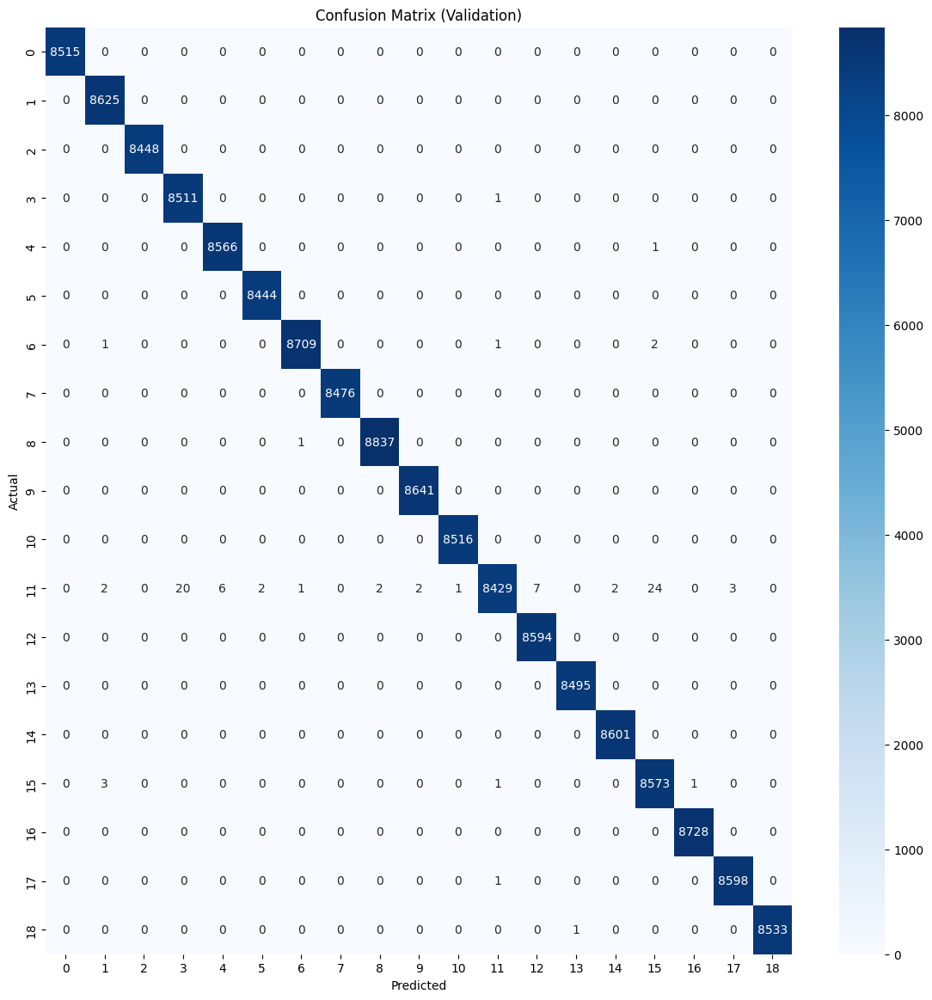

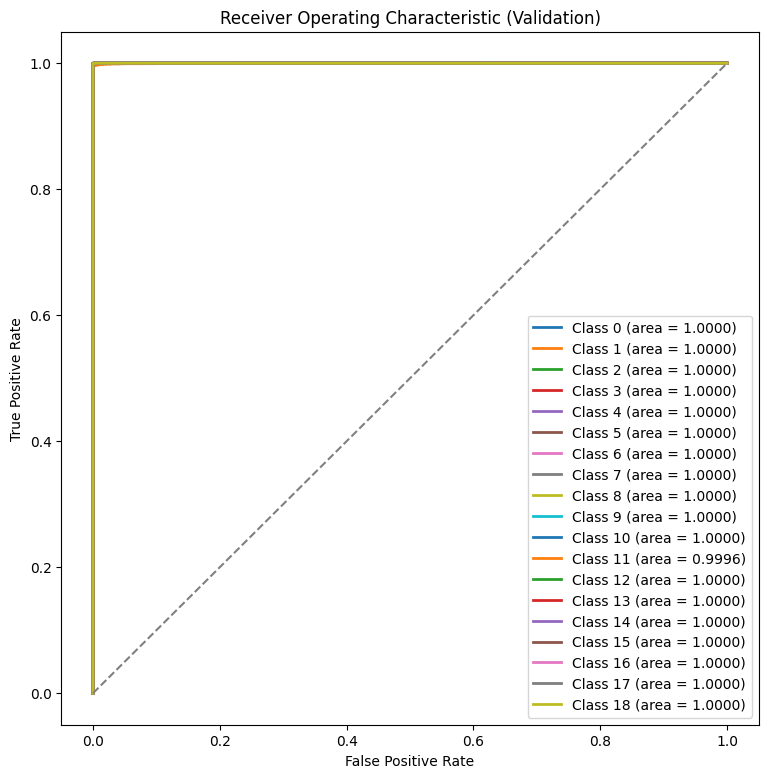

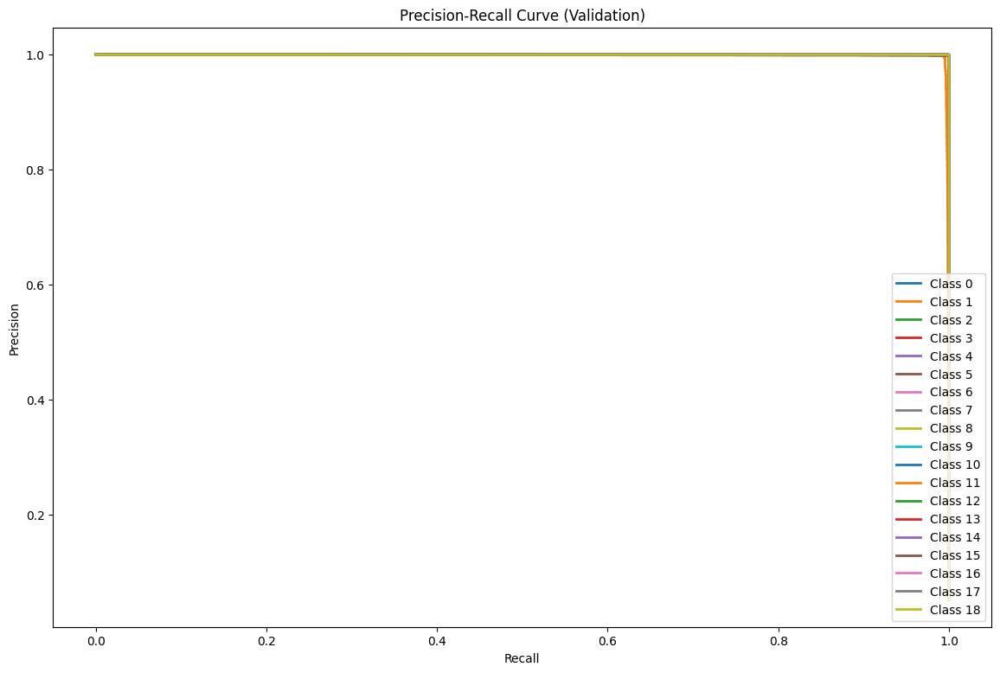


Metrics (Validation):
Accuracy: 99.947215%
Precision: 99.947251%
Recall: 99.946882%
F1 Score: 99.946965%
Loss: 0.010618
Elapsed Time: 41.12 seconds
5092/5092 ━━━━━━━━━━━━━━━━━━━━ 29s 6ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   0.999685  1.000000  0.999842      9506
           1   0.965827  1.000000  0.982617       537
           2   0.998088  1.000000  0.999043       522
           3   0.956319  0.999575  0.977469      4709
           4   0.990112  0.999773  0.994919      4407
           5   1.000000  1.000000  1.000000         3
           6   0.990783  1.000000  0.995370      1075
           7   0.999805  1.000000  0.999903     10277
           8   0.998932  1.000000  0.999466      4677
           9   0.578947  1.000000  0.733333        22
          10   0.982127  0.999091  0.990536      1100
          11   0.999940  0.991576  0.995740     83454
          12   0.998618  0.999929  0.999273     28179
          13   0.91

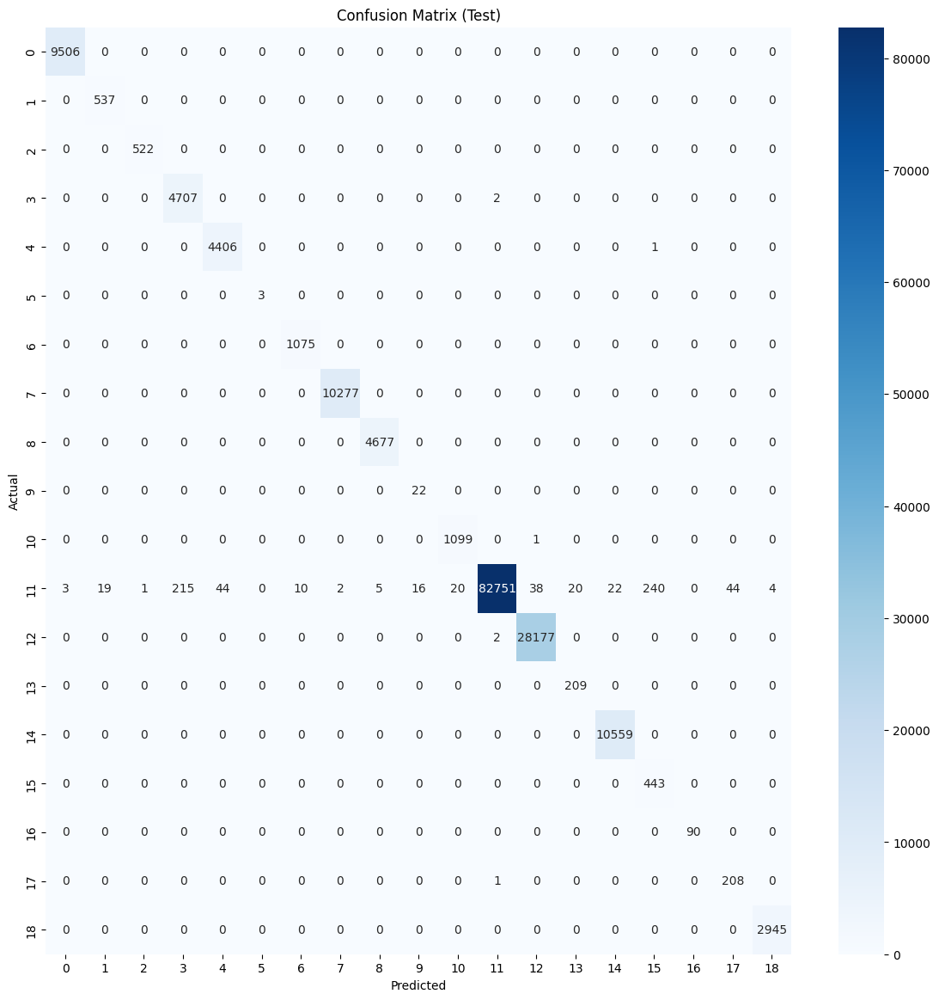

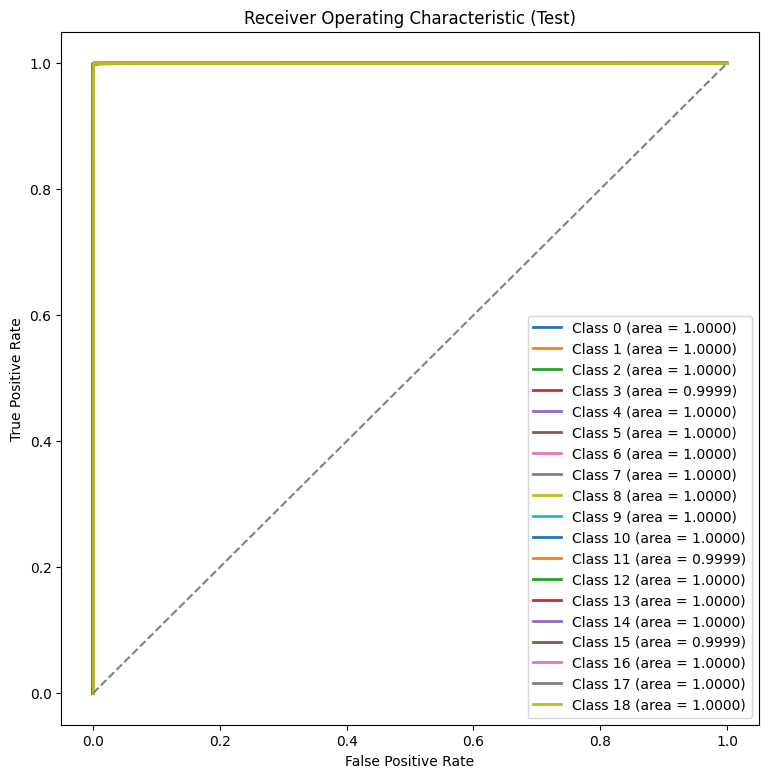

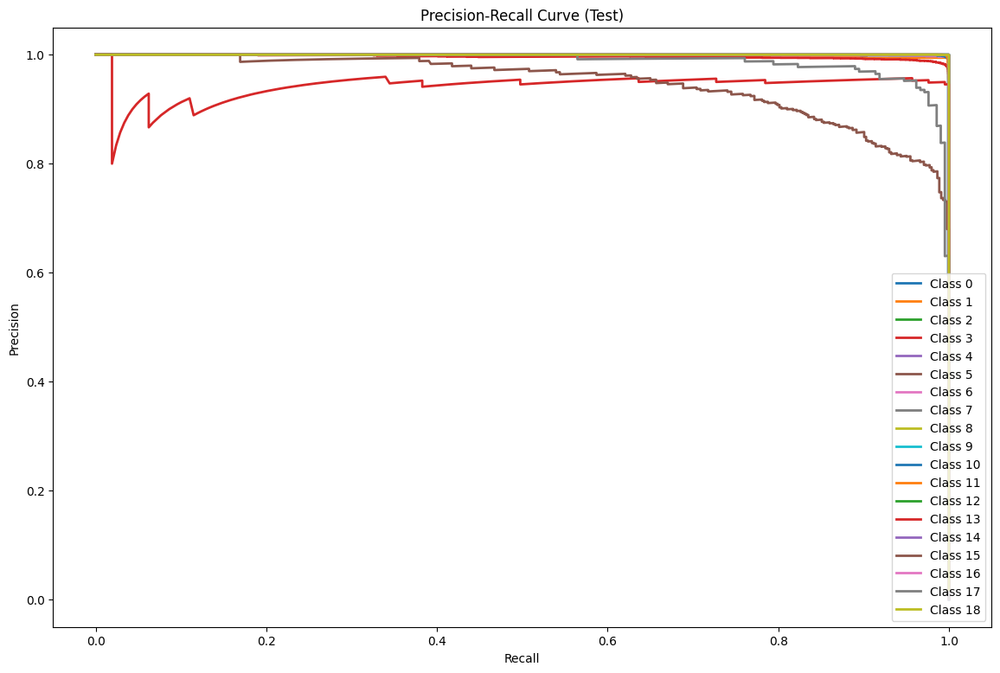


Metrics (Test):
Accuracy: 99.564211%
Precision: 93.902469%
Recall: 99.921894%
F1 Score: 96.361443%
Loss: 0.028635
Elapsed Time: 31.24 seconds


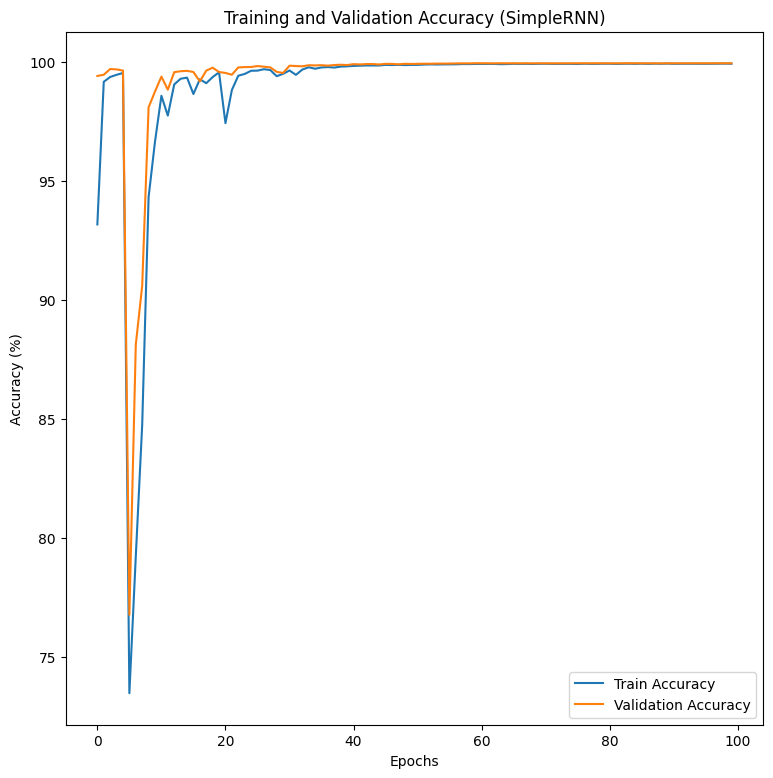

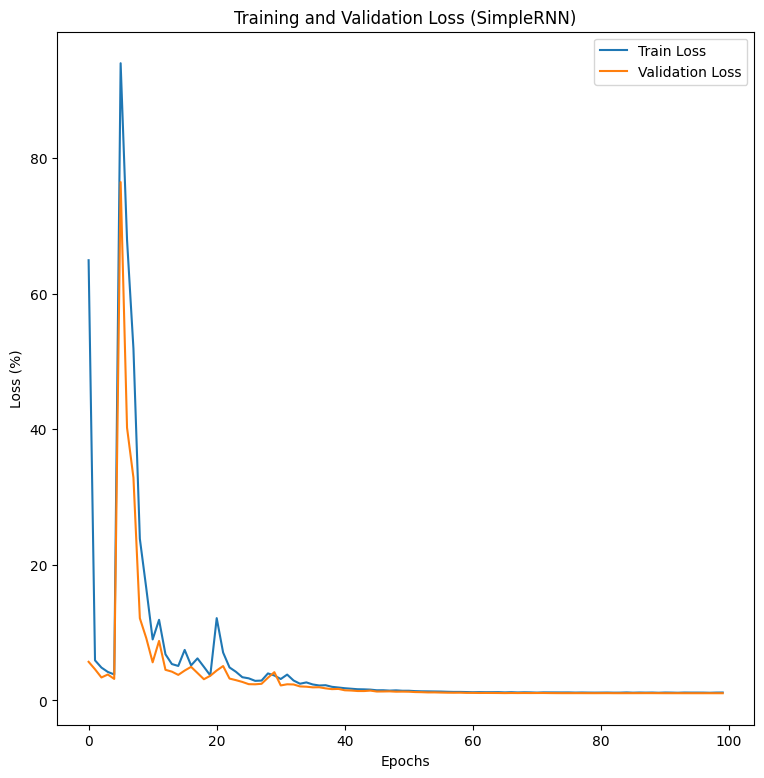

Epoch 1 - Train Loss: 64.9495%, Validation Loss: 5.70%, Train Accuracy: 93.17%, Validation Accuracy: 99.42%
Epoch 2 - Train Loss: 5.9127%, Validation Loss: 4.59%, Train Accuracy: 99.17%, Validation Accuracy: 99.47%
Epoch 3 - Train Loss: 4.8478%, Validation Loss: 3.39%, Train Accuracy: 99.37%, Validation Accuracy: 99.71%
Epoch 4 - Train Loss: 4.2012%, Validation Loss: 3.82%, Train Accuracy: 99.46%, Validation Accuracy: 99.69%
Epoch 5 - Train Loss: 3.8335%, Validation Loss: 3.17%, Train Accuracy: 99.54%, Validation Accuracy: 99.64%
Epoch 6 - Train Loss: 94.0168%, Validation Loss: 76.48%, Train Accuracy: 73.47%, Validation Accuracy: 76.76%
Epoch 7 - Train Loss: 67.9463%, Validation Loss: 40.24%, Train Accuracy: 79.21%, Validation Accuracy: 88.12%
Epoch 8 - Train Loss: 51.9008%, Validation Loss: 32.86%, Train Accuracy: 84.75%, Validation Accuracy: 90.59%
Epoch 9 - Train Loss: 23.8506%, Validation Loss: 12.12%, Train Accuracy: 94.32%, Validation Accuracy: 98.10%
Epoch 10 - Train Loss: 16.57

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
from sklearn.preprocessing import label_binarize, LabelEncoder

label_encoder = LabelEncoder()
y_TON_IOT_test2_encoded = label_encoder.fit_transform(y_TON_IOT_test)


y_TON_IOT_test2_one_hot = tf.keras.utils.to_categorical(y_TON_IOT_test2_encoded, num_classes=num_classes)


def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(14, 14))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")


evaluate_model(model_rnn, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=19, dataset_name="Validation")
evaluate_model(model_rnn, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=19, dataset_name="Test")



plt.figure(figsize=(9, 9))
plt.plot(np.array(history_rnn.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_rnn.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (SimpleRNN)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_rnn.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_rnn.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (SimpleRNN)')
plt.legend()
plt.show()




for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_rnn.history['loss'],
                                                                      history_rnn.history['val_loss'],
                                                                      history_rnn.history['accuracy'],
                                                                      history_rnn.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")


In [ ]:
import pickle
with open('history_rnn.pkl', 'wb') as file:
    pickle.dump(history_rnn.history, file)

#***CNN_LSTM***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
model_checkpoint = ModelCheckpoint('best_model_lstm.keras', monitor='val_loss', save_best_only=True)

# CNN_LSTM
model_lstm_cnn = Sequential()
model_lstm_cnn.add(Conv1D(64, 3, activation='relu', input_shape=X_TON_IOT_train.shape[1:]))
model_lstm_cnn.add(MaxPooling1D(pool_size=2))
model_lstm_cnn.add(Conv1D(128, 3, activation='relu'))
model_lstm_cnn.add(MaxPooling1D(pool_size=2))
model_lstm_cnn.add(LSTM(128, activation='tanh', return_sequences=True, kernel_regularizer=l2(0.01)))
model_lstm_cnn.add(BatchNormalization())
model_lstm_cnn.add(Dropout(0.5))
model_lstm_cnn.add(LSTM(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_lstm_cnn.add(BatchNormalization())
model_lstm_cnn.add(Dropout(0.5))
model_lstm_cnn.add(Flatten())
model_lstm_cnn.add(Dense(19, activation='softmax'))

model_lstm_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()

history_lstm_cnn = model_lstm_cnn.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                                      validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                                      callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time



 # training_time
print(f"Le temps d'entraînement du modèle CNN_LSTM est de {training_time:.2f} secondes.")


Epoch 1/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - accuracy: 0.8653 - loss: 1.8708 - val_accuracy: 0.3156 - val_loss: 1.6101 - learning_rate: 0.0010
Epoch 2/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - accuracy: 0.9932 - loss: 0.0790 - val_accuracy: 0.6774 - val_loss: 1.3185 - learning_rate: 0.0010
Epoch 3/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 22s 36ms/step - accuracy: 0.9928 - loss: 0.0568 - val_accuracy: 0.9324 - val_loss: 0.2285 - learning_rate: 0.0010
Epoch 4/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - accuracy: 0.9963 - loss: 0.0332 - val_accuracy: 0.9762 - val_loss: 0.1130 - learning_rate: 0.0010
Epoch 5/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 21s 36ms/step - accuracy: 0.9968 - loss: 0.0333 - val_accuracy: 0.8776 - val_loss: 0.6787 - learning_rate: 0.0010
Epoch 6/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - accuracy: 0.9944 - loss: 0.0497 - val_accuracy: 0.8158 - val_loss: 1.1280 - learning_rate: 0.0010
Epoch 7/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 20s 34ms/step - accuracy: 0.9

5092/5092 ━━━━━━━━━━━━━━━━━━━━ 25s 5ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      8515
           1   1.000000  1.000000  1.000000      8625
           2   1.000000  1.000000  1.000000      8448
           3   1.000000  0.999883  0.999941      8512
           4   1.000000  0.999650  0.999825      8567
           5   1.000000  1.000000  1.000000      8444
           6   0.999885  1.000000  0.999943      8713
           7   1.000000  1.000000  1.000000      8476
           8   0.999774  1.000000  0.999887      8838
           9   1.000000  1.000000  1.000000      8641
          10   0.999883  1.000000  0.999941      8516
          11   0.999764  0.998706  0.999235      8501
          12   1.000000  1.000000  1.000000      8594
          13   0.999882  1.000000  0.999941      8495
          14   0.999884  1.000000  0.999942      8601
          15   0.999185  1.000000  0.999592      8578


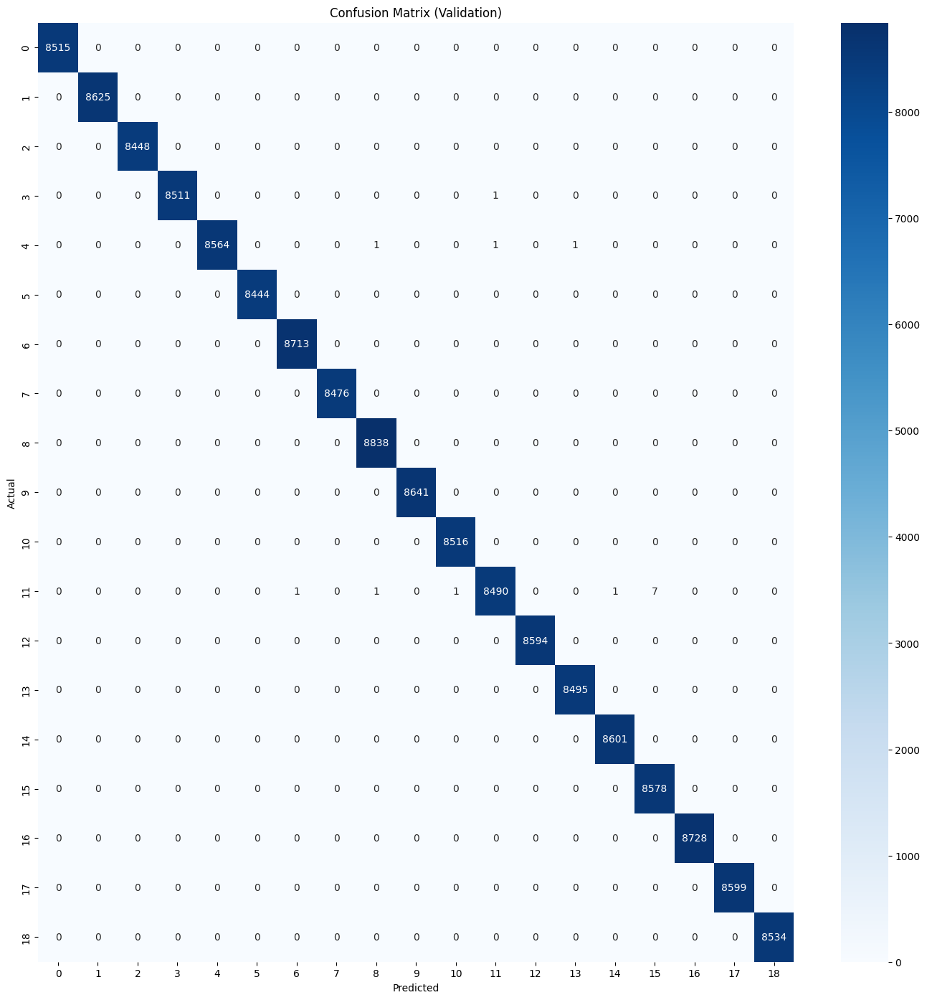

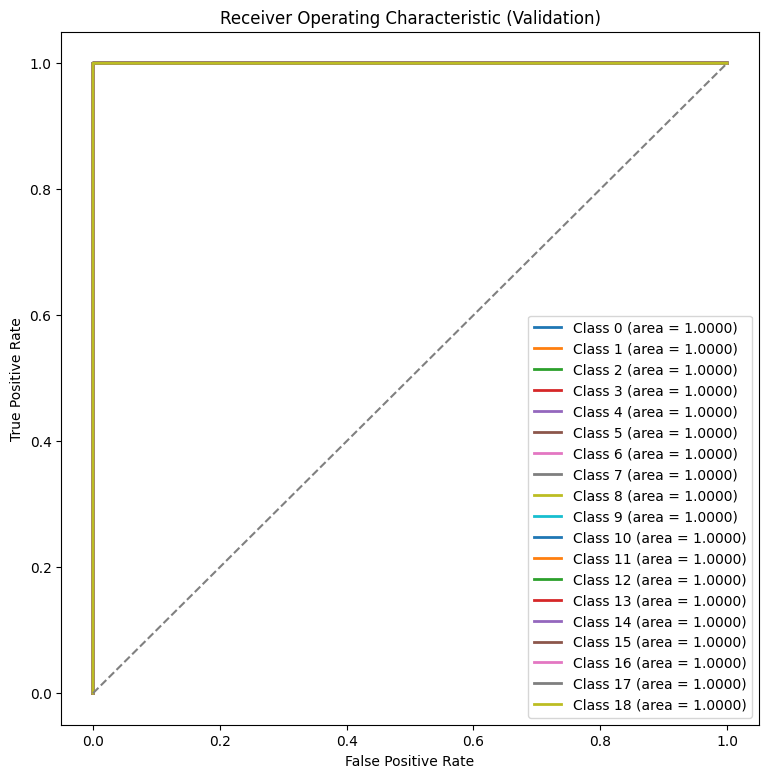

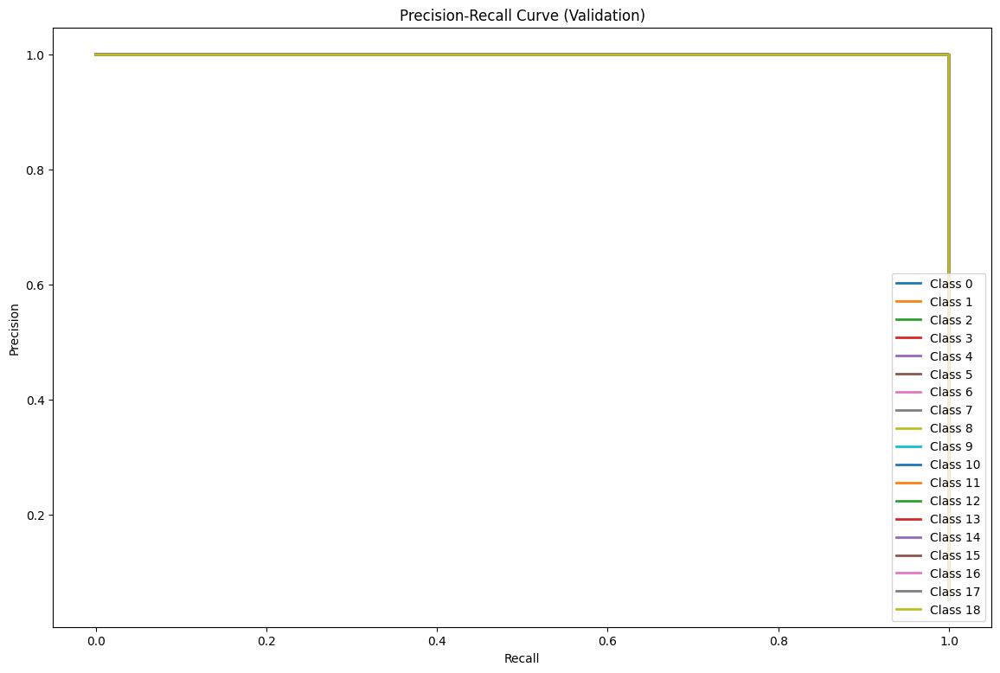


Metrics (Validation):
Accuracy: 99.990793%
Precision: 99.990825%
Recall: 99.990728%
F1 Score: 99.990774%
Loss: 0.000745
Elapsed Time: 41.12 seconds
5092/5092 ━━━━━━━━━━━━━━━━━━━━ 14s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      9506
           1   1.000000  0.996276  0.998134       537
           2   1.000000  1.000000  1.000000       522
           3   0.997458  0.999788  0.998621      4709
           4   0.999546  0.999546  0.999546      4407
           5   0.333333  0.333333  0.333333         3
           6   0.994450  1.000000  0.997217      1075
           7   1.000000  1.000000  1.000000     10277
           8   0.997866  1.000000  0.998932      4677
           9   1.000000  1.000000  1.000000        22
          10   0.997275  0.998182  0.997728      1100
          11   0.999904  0.998850  0.999377     83454
          12   0.999752  1.000000  0.999876     28179
          13   1.00

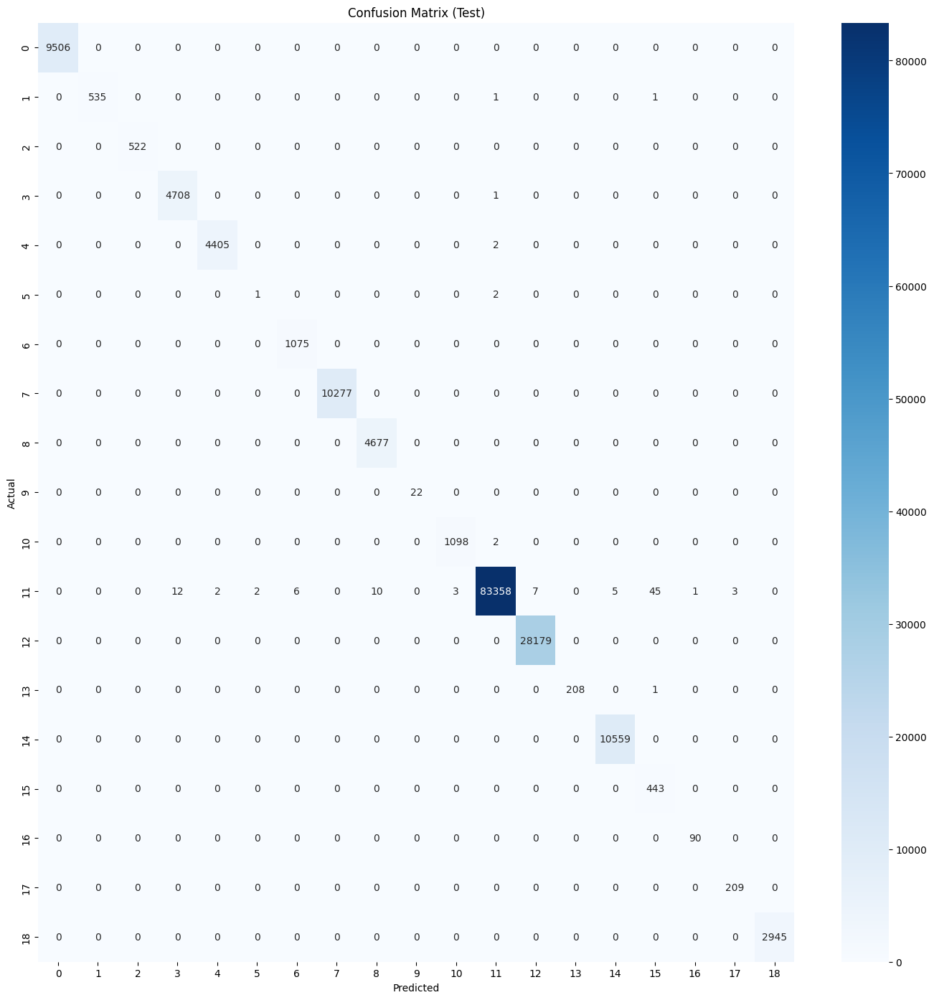

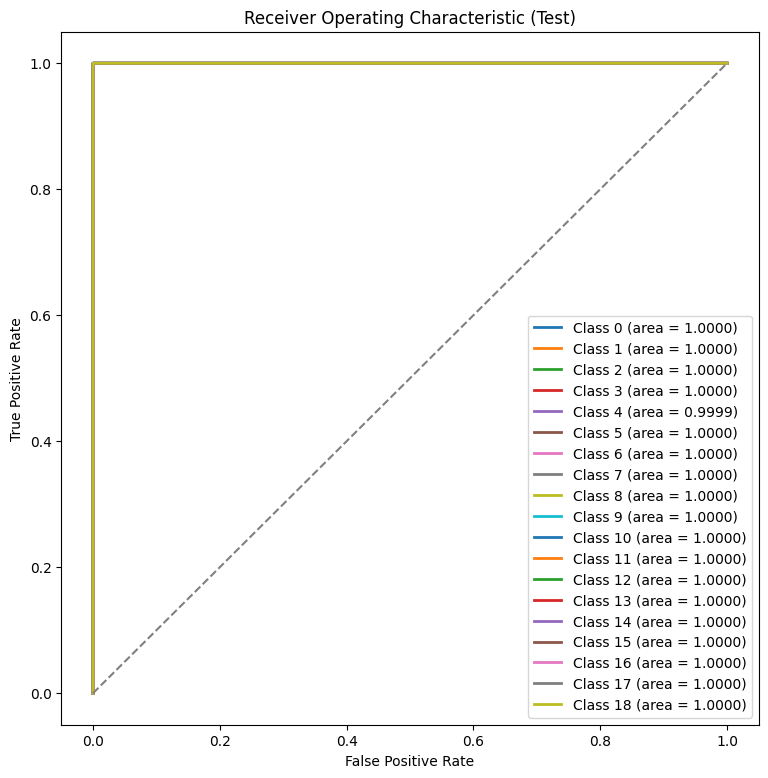

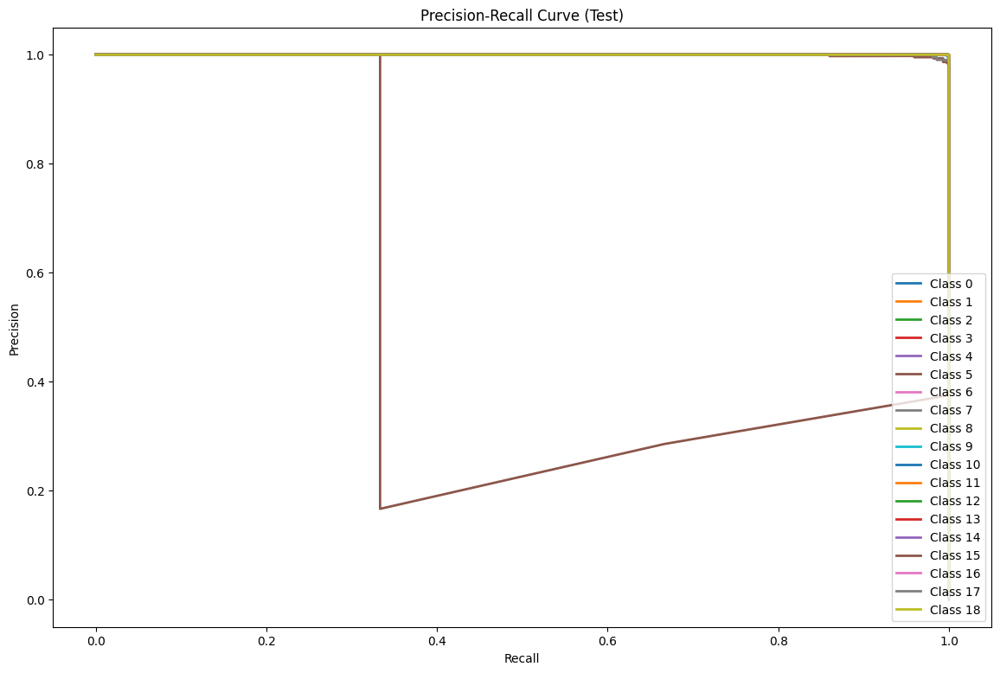


Metrics (Test):
Accuracy: 99.934939%
Precision: 95.779223%
Recall: 96.427313%
F1 Score: 96.090022%
Loss: 0.003333
Elapsed Time: 15.92 seconds


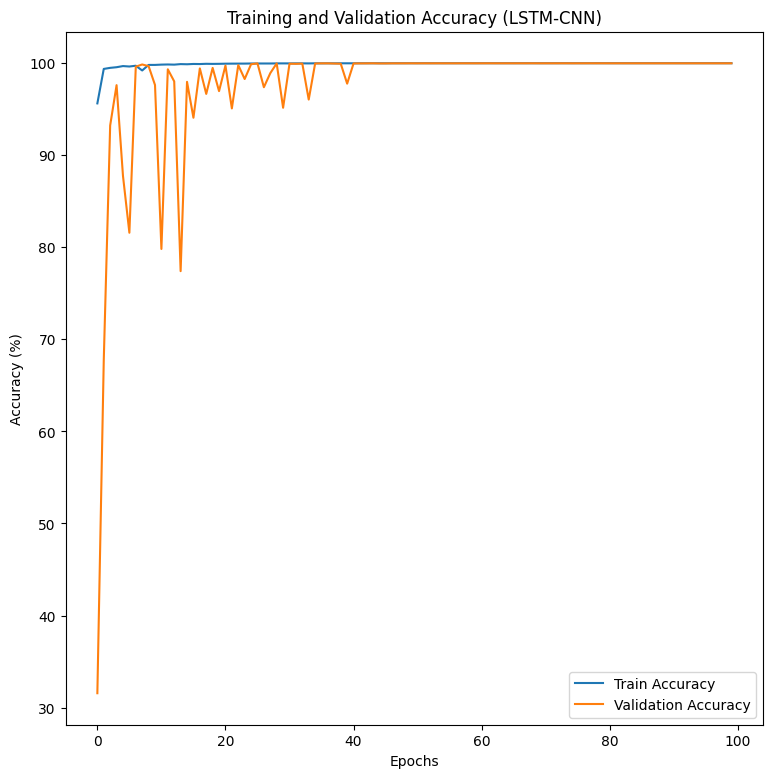

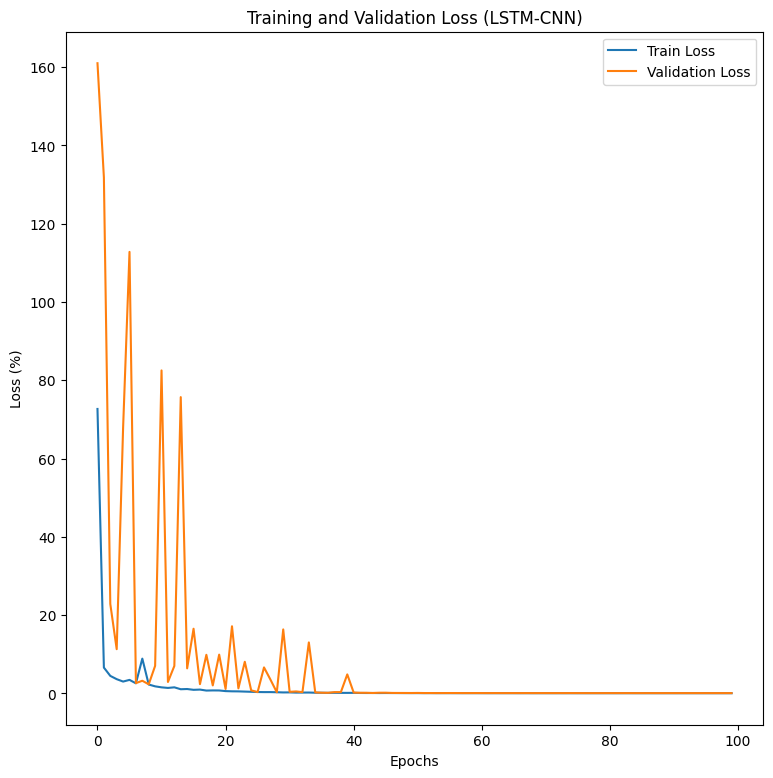

Epoch 1 - Train Loss: 72.6748%, Validation Loss: 161.01%, Train Accuracy: 95.64%, Validation Accuracy: 31.56%
Epoch 2 - Train Loss: 6.5964%, Validation Loss: 131.85%, Train Accuracy: 99.38%, Validation Accuracy: 67.74%
Epoch 3 - Train Loss: 4.4759%, Validation Loss: 22.85%, Train Accuracy: 99.50%, Validation Accuracy: 93.24%
Epoch 4 - Train Loss: 3.6378%, Validation Loss: 11.30%, Train Accuracy: 99.57%, Validation Accuracy: 97.62%
Epoch 5 - Train Loss: 3.0239%, Validation Loss: 67.87%, Train Accuracy: 99.69%, Validation Accuracy: 87.76%
Epoch 6 - Train Loss: 3.4540%, Validation Loss: 112.80%, Train Accuracy: 99.64%, Validation Accuracy: 81.58%
Epoch 7 - Train Loss: 2.5755%, Validation Loss: 2.62%, Train Accuracy: 99.73%, Validation Accuracy: 99.63%
Epoch 8 - Train Loss: 8.8861%, Validation Loss: 3.23%, Train Accuracy: 99.21%, Validation Accuracy: 99.86%
Epoch 9 - Train Loss: 2.2715%, Validation Loss: 2.32%, Train Accuracy: 99.81%, Validation Accuracy: 99.68%
Epoch 10 - Train Loss: 1.80

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Conv1D, MaxPooling1D, Flatten, Dropout, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score, f1_score
import seaborn as sns
from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import label_binarize, LabelEncoder



def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(17, 17))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()

    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")


label_encoder = LabelEncoder()
y_TON_IOT_test2_encoded = label_encoder.fit_transform(y_TON_IOT_test)

y_TON_IOT_test2_one_hot = tf.keras.utils.to_categorical(y_TON_IOT_test2_encoded, num_classes=num_classes)



evaluate_model(model_lstm_cnn, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=19, dataset_name="Validation")
evaluate_model(model_lstm_cnn, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=19, dataset_name="Test")



plt.figure(figsize=(9, 9))
plt.plot(np.array(history_lstm_cnn.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_lstm_cnn.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (LSTM-CNN)')
plt.legend()
plt.show()

plt.figure(figsize=(9, 9))
plt.plot(np.array(history_lstm_cnn.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_lstm_cnn.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (LSTM-CNN)')
plt.legend()
plt.show()


for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_lstm_cnn.history['loss'],
                                                                      history_lstm_cnn.history['val_loss'],
                                                                      history_lstm_cnn.history['accuracy'],
                                                                      history_lstm_cnn.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")


In [ ]:
import pickle
with open('history_lstm_cnn.pkl', 'wb') as file:
    pickle.dump(history_lstm_cnn.history, file)

#***CNN_GRU***

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import GRU, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time



def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
model_checkpoint = ModelCheckpoint('best_model_lstm.keras', monitor='val_loss', save_best_only=True)



# CNN_GRU Model
model_gru_cnn = Sequential()
model_gru_cnn.add(Conv1D(64, 3, activation='relu', input_shape=X_TON_IOT_train.shape[1:]))
model_gru_cnn.add(MaxPooling1D(pool_size=2))
model_gru_cnn.add(Conv1D(128, 3, activation='relu'))
model_gru_cnn.add(MaxPooling1D(pool_size=2))
model_gru_cnn.add(GRU(128, activation='tanh', return_sequences=True, kernel_regularizer=l2(0.01)))
model_gru_cnn.add(BatchNormalization())
model_gru_cnn.add(Dropout(0.5))
model_gru_cnn.add(GRU(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_gru_cnn.add(BatchNormalization())
model_gru_cnn.add(Dropout(0.5))
model_gru_cnn.add(Flatten())
model_gru_cnn.add(Dense(19, activation='softmax'))

model_gru_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])


start_time = time.time()

history_gru_cnn = model_gru_cnn.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                                    validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                                    callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


# training_time
print(f"Le temps d'entraînement du modèle CNN_GRU est de {training_time:.2f} secondes.")

Epoch 1/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 19s 32ms/step - accuracy: 0.7797 - loss: 2.1703 - val_accuracy: 0.3412 - val_loss: 1.7435 - learning_rate: 0.0010
Epoch 2/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 15s 31ms/step - accuracy: 0.9935 - loss: 0.0779 - val_accuracy: 0.9880 - val_loss: 0.0614 - learning_rate: 0.0010
Epoch 3/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 21s 31ms/step - accuracy: 0.9952 - loss: 0.0417 - val_accuracy: 0.6970 - val_loss: 1.2868 - learning_rate: 0.0010
Epoch 4/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 20s 31ms/step - accuracy: 0.9956 - loss: 0.0374 - val_accuracy: 0.9583 - val_loss: 0.1615 - learning_rate: 0.0010
Epoch 5/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 21s 32ms/step - accuracy: 0.9967 - loss: 0.0309 - val_accuracy: 0.9745 - val_loss: 0.0925 - learning_rate: 0.0010
Epoch 6/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 15s 32ms/step - accuracy: 0.9971 - loss: 0.0284 - val_accuracy: 0.9826 - val_loss: 0.0810 - learning_rate: 0.0010
Epoch 7/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 21s 34ms/step - accuracy: 0.9

In [ ]:
import pickle
with open('history_gru_cnn.pkl', 'wb') as file:
    pickle.dump(history_gru_cnn.history, file)

5092/5092 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      8515
           1   1.000000  1.000000  1.000000      8625
           2   1.000000  1.000000  1.000000      8448
           3   1.000000  1.000000  1.000000      8512
           4   1.000000  0.999883  0.999942      8567
           5   1.000000  1.000000  1.000000      8444
           6   0.999771  1.000000  0.999885      8713
           7   0.999882  1.000000  0.999941      8476
           8   0.999548  0.999887  0.999717      8838
           9   1.000000  1.000000  1.000000      8641
          10   0.999883  1.000000  0.999941      8516
          11   0.999882  0.998000  0.998940      8501
          12   0.999767  1.000000  0.999884      8594
          13   1.000000  1.000000  1.000000      8495
          14   1.000000  0.999884  0.999942      8601
          15   0.998952  1.000000  0.999476      8578


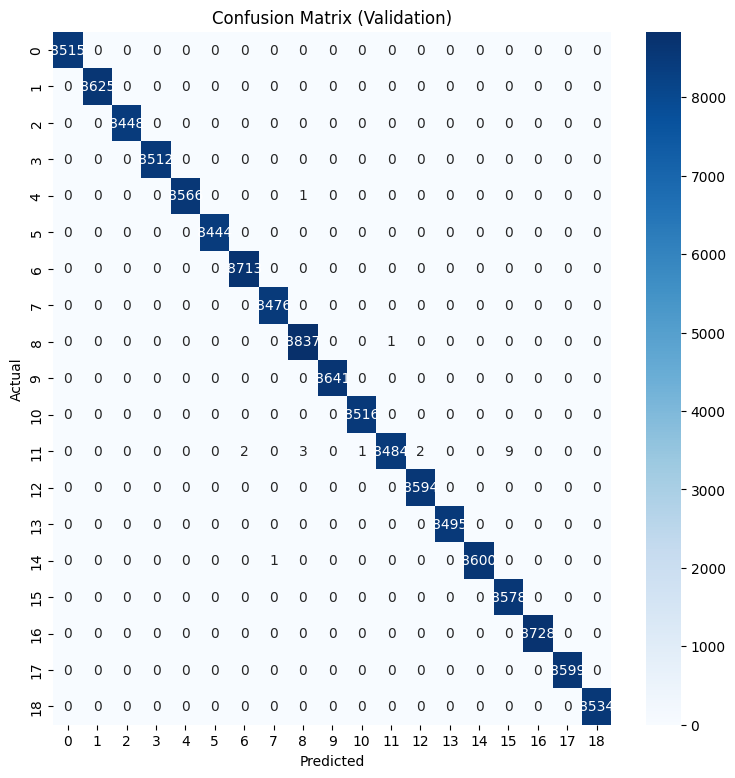

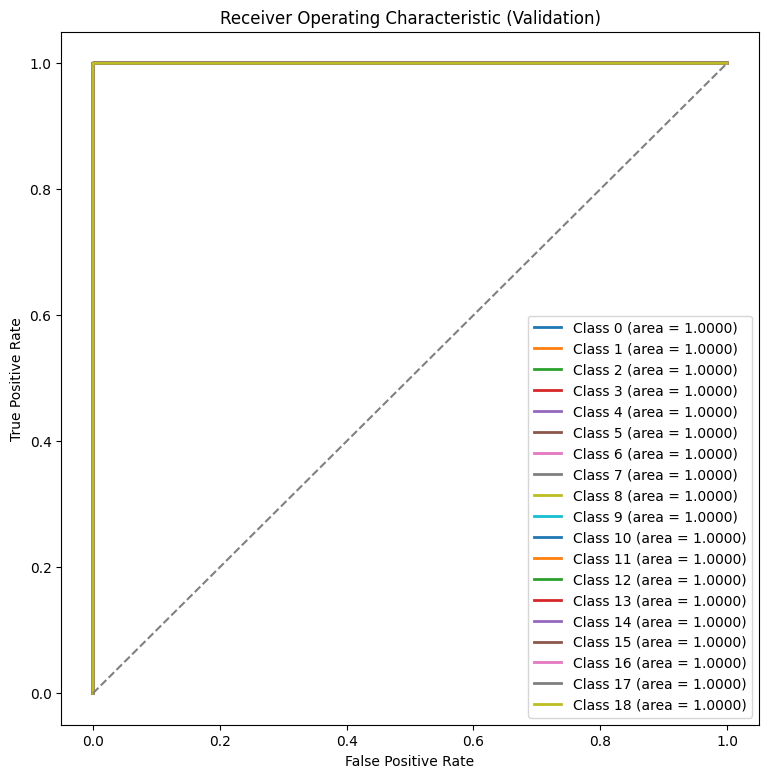

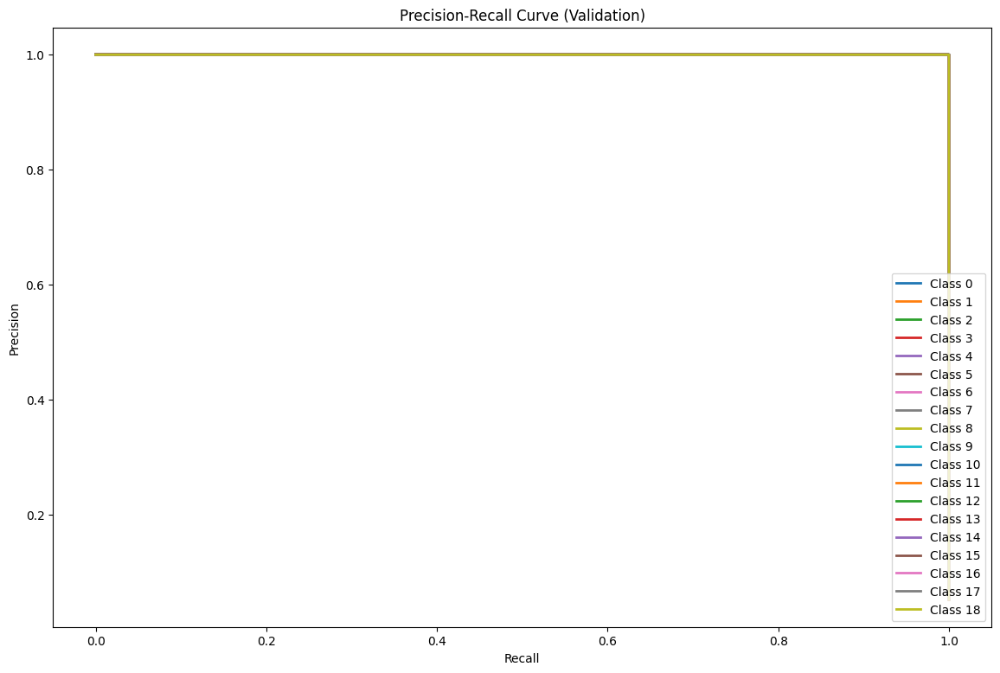


Metrics (Validation):
Accuracy: 99.987724%
Precision: 99.987811%
Recall: 99.987653%
F1 Score: 99.987726%
Loss: 0.000759
Elapsed Time: 20.64 seconds
5092/5092 ━━━━━━━━━━━━━━━━━━━━ 13s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      9506
           1   0.992593  0.998138  0.995357       537
           2   1.000000  1.000000  1.000000       522
           3   0.997458  0.999788  0.998621      4709
           4   1.000000  0.999319  0.999660      4407
           5   1.000000  0.666667  0.800000         3
           6   0.993530  1.000000  0.996755      1075
           7   0.999805  1.000000  0.999903     10277
           8   0.997441  1.000000  0.998719      4677
           9   1.000000  1.000000  1.000000        22
          10   0.990983  0.999091  0.995020      1100
          11   0.999928  0.998730  0.999329     83454
          12   0.999681  1.000000  0.999840     28179
          13   1.00

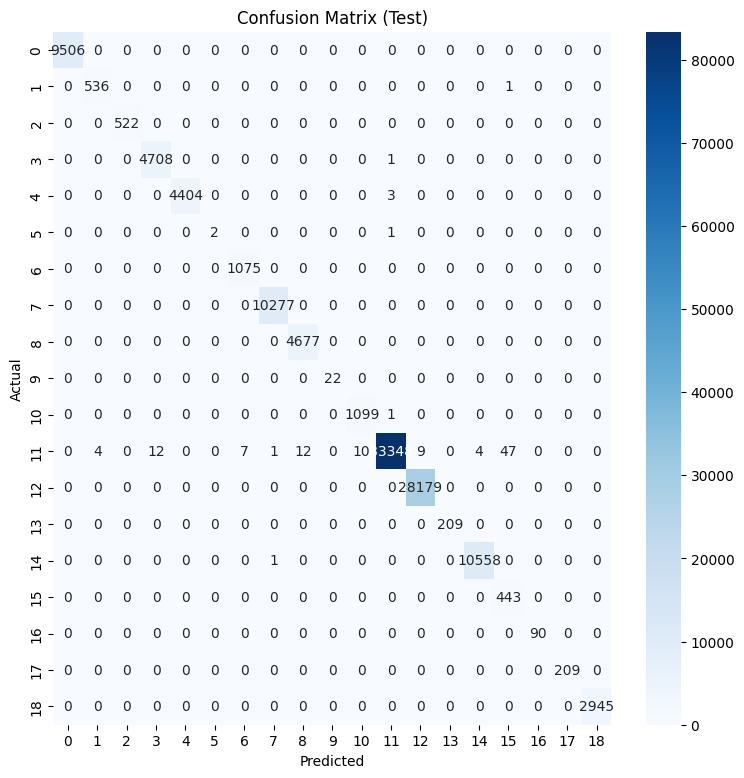

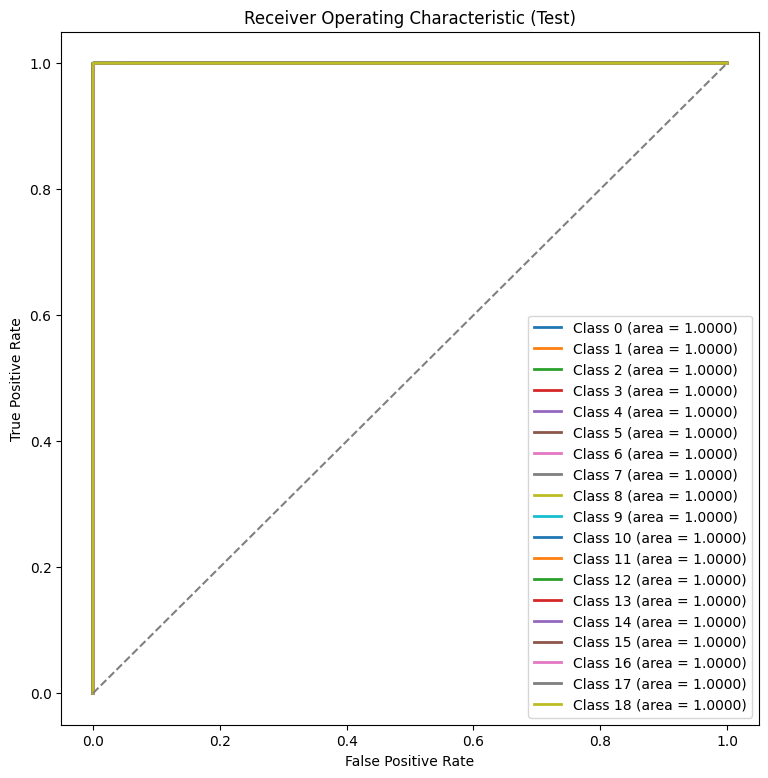

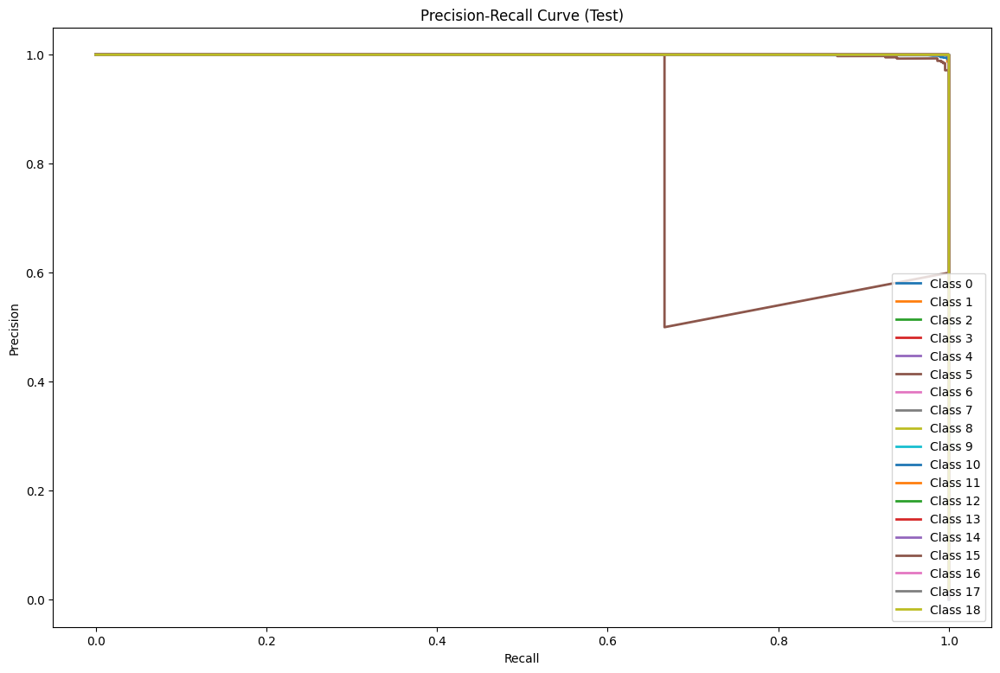


Metrics (Test):
Accuracy: 99.930028%
Precision: 99.333054%
Recall: 98.219144%
F1 Score: 98.587238%
Loss: 0.003968
Elapsed Time: 14.95 seconds


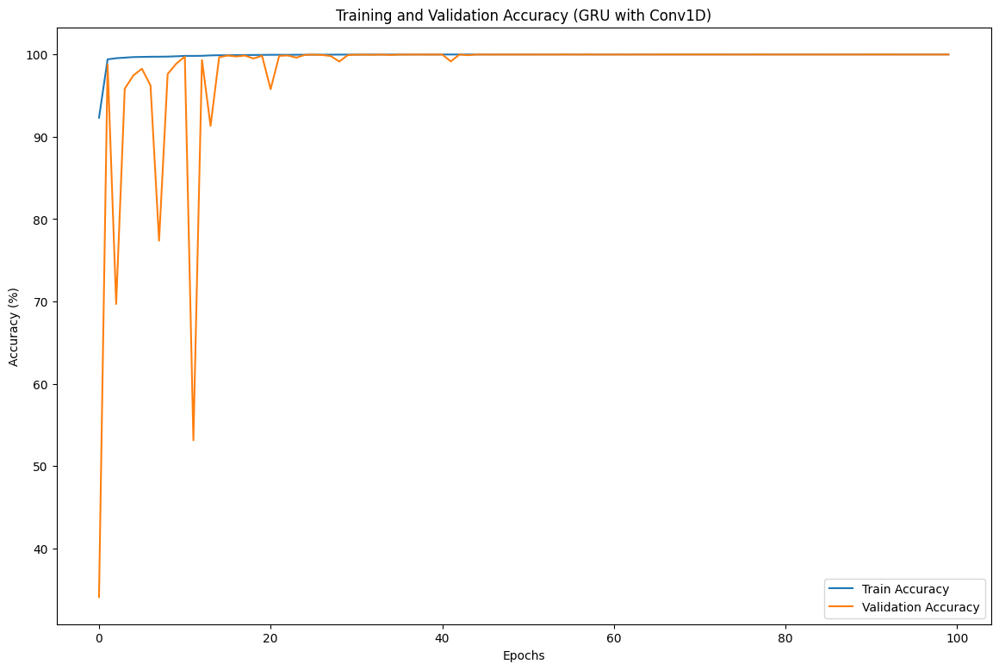

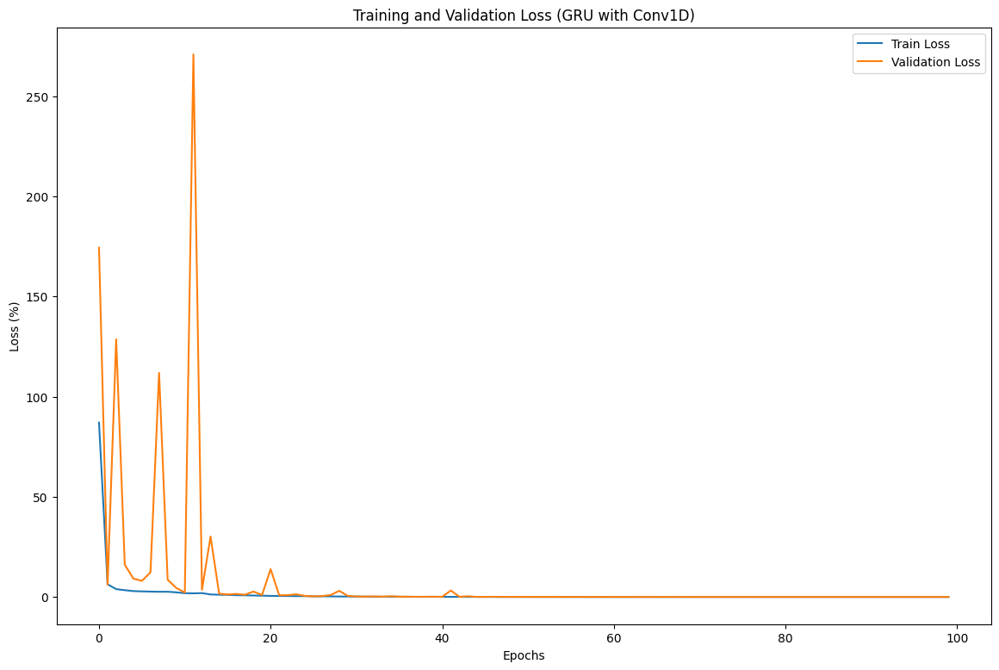

Epoch 1 - Train Loss: 87.0463%, Validation Loss: 174.35%, Train Accuracy: 92.31%, Validation Accuracy: 34.12%
Epoch 2 - Train Loss: 6.3676%, Validation Loss: 6.14%, Train Accuracy: 99.40%, Validation Accuracy: 98.80%
Epoch 3 - Train Loss: 3.9763%, Validation Loss: 128.68%, Train Accuracy: 99.54%, Validation Accuracy: 69.70%
Epoch 4 - Train Loss: 3.4419%, Validation Loss: 16.15%, Train Accuracy: 99.61%, Validation Accuracy: 95.83%
Epoch 5 - Train Loss: 2.9952%, Validation Loss: 9.25%, Train Accuracy: 99.68%, Validation Accuracy: 97.45%
Epoch 6 - Train Loss: 2.8455%, Validation Loss: 8.10%, Train Accuracy: 99.70%, Validation Accuracy: 98.26%
Epoch 7 - Train Loss: 2.7405%, Validation Loss: 12.35%, Train Accuracy: 99.72%, Validation Accuracy: 96.23%
Epoch 8 - Train Loss: 2.6632%, Validation Loss: 111.89%, Train Accuracy: 99.72%, Validation Accuracy: 77.38%
Epoch 9 - Train Loss: 2.6754%, Validation Loss: 8.69%, Train Accuracy: 99.74%, Validation Accuracy: 97.62%
Epoch 10 - Train Loss: 2.372

In [ ]:
e
def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(9, 9))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()


    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()



    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")



evaluate_model(model_gru_cnn, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=19, dataset_name="Validation")
evaluate_model(model_gru_cnn, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=19, dataset_name="Test")


plt.figure(figsize=(14, 9))
plt.plot(np.array(history_gru_cnn.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_gru_cnn.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (GRU with Conv1D)')
plt.legend()
plt.show()

plt.figure(figsize=(14, 9))
plt.plot(np.array(history_gru_cnn.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_gru_cnn.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (GRU with Conv1D)')
plt.legend()
plt.show()


for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_gru_cnn.history['loss'],
                                                                      history_gru_cnn.history['val_loss'],
                                                                      history_gru_cnn.history['accuracy'],
                                                                      history_gru_cnn.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")

#**CNN_RNN**

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import SimpleRNN, Dropout, Dense, BatchNormalization, Conv1D, MaxPooling1D, Flatten
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping, ModelCheckpoint
import time
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc, precision_recall_curve, accuracy_score, precision_score, recall_score
import seaborn as sns
from sklearn.preprocessing import label_binarize, LabelEncoder


def scheduler(epoch, lr):
    if epoch < 10:
        return float(lr)  # Ensure it returns a float
    else:
        return float(lr * tf.math.exp(-0.1))  # Ensure it returns a float

lr_scheduler = LearningRateScheduler(scheduler)
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)



# CNN_RNN Model
model_rnn_cnn = Sequential()
model_rnn_cnn.add(Conv1D(64, 3, activation='relu', input_shape=X_TON_IOT_train.shape[1:]))
model_rnn_cnn.add(MaxPooling1D(pool_size=2))
model_rnn_cnn.add(Conv1D(128, 3, activation='relu'))
model_rnn_cnn.add(MaxPooling1D(pool_size=2))
model_rnn_cnn.add(SimpleRNN(128, activation='tanh', return_sequences=True, kernel_regularizer=l2(0.01)))
model_rnn_cnn.add(BatchNormalization())
model_rnn_cnn.add(Dropout(0.5))
model_rnn_cnn.add(SimpleRNN(256, activation='tanh', kernel_regularizer=l2(0.01)))
model_rnn_cnn.add(BatchNormalization())
model_rnn_cnn.add(Dropout(0.5))
model_rnn_cnn.add(Flatten())
model_rnn_cnn.add(Dense(19, activation='softmax'))

model_rnn_cnn.compile(optimizer=Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

start_time = time.time()


history_rnn_cnn = model_rnn_cnn.fit(X_TON_IOT_train, y_TON_IOT_train_one_hot, epochs=100, batch_size=1024,
                                    validation_data=(X_TON_IOT_valid, y_TON_IOT_valid_one_hot),
                                    callbacks=[lr_scheduler], verbose=1)
end_time = time.time()
training_time = end_time - start_time


# training_time
print(f"Le temps d'entraînement du modèle CNN_RNN est de {training_time:.2f} secondes.")

Epoch 1/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 30s 39ms/step - accuracy: 0.8743 - loss: 1.9170 - val_accuracy: 0.9895 - val_loss: 0.0870 - learning_rate: 0.0010
Epoch 2/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 27s 20ms/step - accuracy: 0.9942 - loss: 0.0624 - val_accuracy: 0.9960 - val_loss: 0.0466 - learning_rate: 0.0010
Epoch 3/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.9960 - loss: 0.0419 - val_accuracy: 0.9983 - val_loss: 0.0274 - learning_rate: 0.0010
Epoch 4/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accuracy: 0.9964 - loss: 0.0332 - val_accuracy: 0.9981 - val_loss: 0.0241 - learning_rate: 0.0010
Epoch 5/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 10s 20ms/step - accuracy: 0.9970 - loss: 0.0294 - val_accuracy: 0.9950 - val_loss: 0.0312 - learning_rate: 0.0010
Epoch 6/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 9s 19ms/step - accuracy: 0.9969 - loss: 0.0292 - val_accuracy: 0.9983 - val_loss: 0.0231 - learning_rate: 0.0010
Epoch 7/100
478/478 ━━━━━━━━━━━━━━━━━━━━ 10s 18ms/step - accuracy: 0.997

5092/5092 ━━━━━━━━━━━━━━━━━━━━ 17s 3ms/step

Classification Report (Validation):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      8515
           1   1.000000  1.000000  1.000000      8625
           2   1.000000  1.000000  1.000000      8448
           3   0.999883  1.000000  0.999941      8512
           4   1.000000  1.000000  1.000000      8567
           5   0.999882  1.000000  0.999941      8444
           6   0.999885  1.000000  0.999943      8713
           7   1.000000  1.000000  1.000000      8476
           8   0.999887  0.999774  0.999830      8838
           9   0.999884  1.000000  0.999942      8641
          10   1.000000  1.000000  1.000000      8516
          11   0.999882  0.998824  0.999353      8501
          12   0.999884  1.000000  0.999942      8594
          13   1.000000  1.000000  1.000000      8495
          14   1.000000  1.000000  1.000000      8601
          15   0.999417  1.000000  0.999709      8578


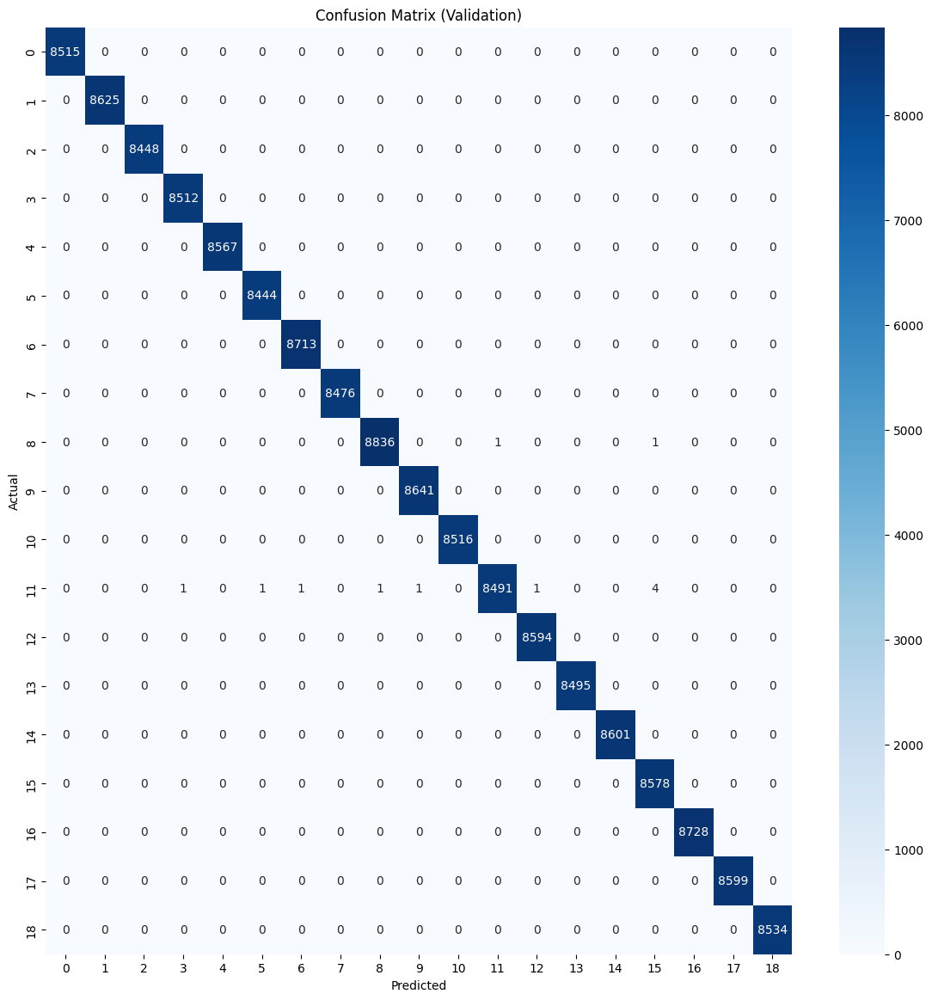

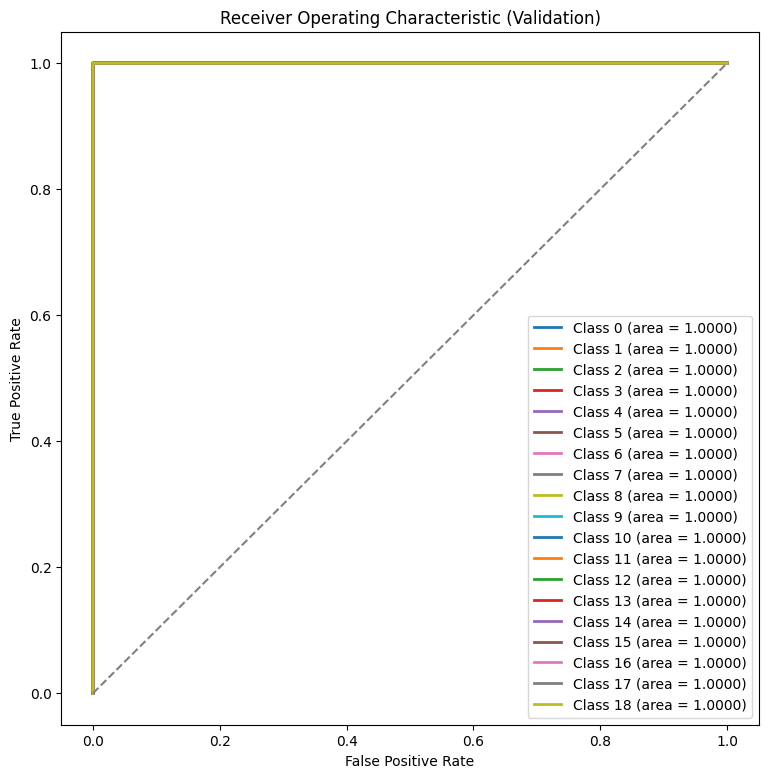

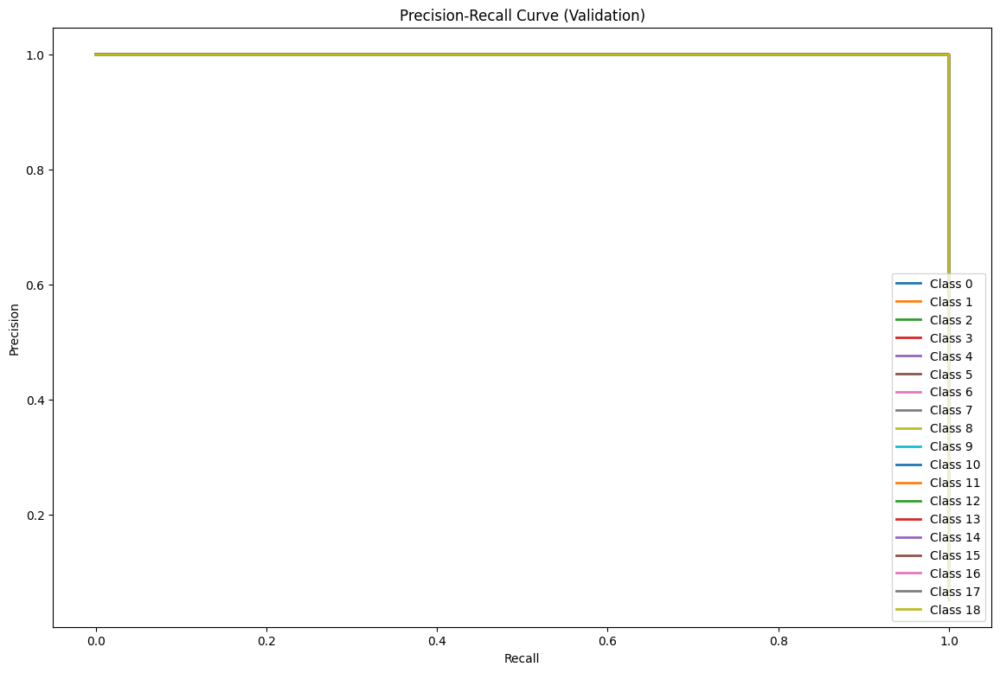


Metrics (Validation):
Accuracy: 99.992635%
Precision: 99.992652%
Recall: 99.992618%
F1 Score: 99.992633%
Loss: 0.000439
Elapsed Time: 82.08 seconds
5092/5092 ━━━━━━━━━━━━━━━━━━━━ 18s 3ms/step

Classification Report (Test):
              precision    recall  f1-score   support

           0   1.000000  1.000000  1.000000      9506
           1   0.994434  0.998138  0.996283       537
           2   1.000000  1.000000  1.000000       522
           3   0.997035  0.999575  0.998303      4709
           4   1.000000  0.999546  0.999773      4407
           5   0.750000  1.000000  0.857143         3
           6   0.995370  1.000000  0.997680      1075
           7   1.000000  1.000000  1.000000     10277
           8   0.997441  1.000000  0.998719      4677
           9   0.956522  1.000000  0.977778        22
          10   0.999091  0.999091  0.999091      1100
          11   0.999928  0.999185  0.999556     83454
          12   0.999681  1.000000  0.999840     28179
          13   0.99

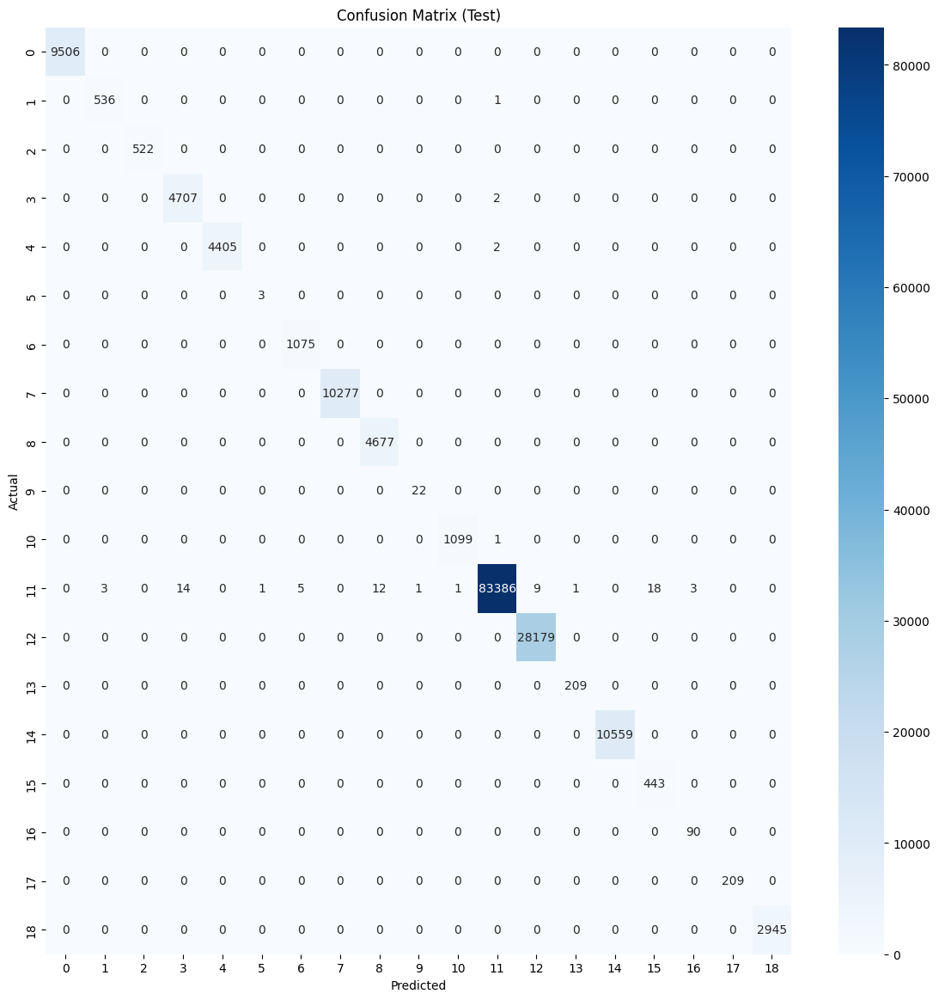

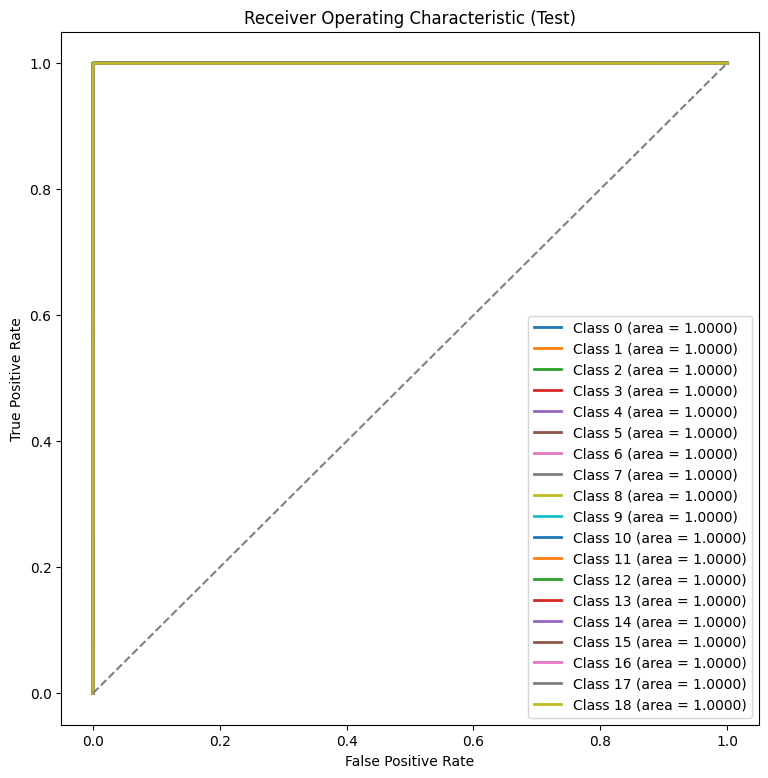

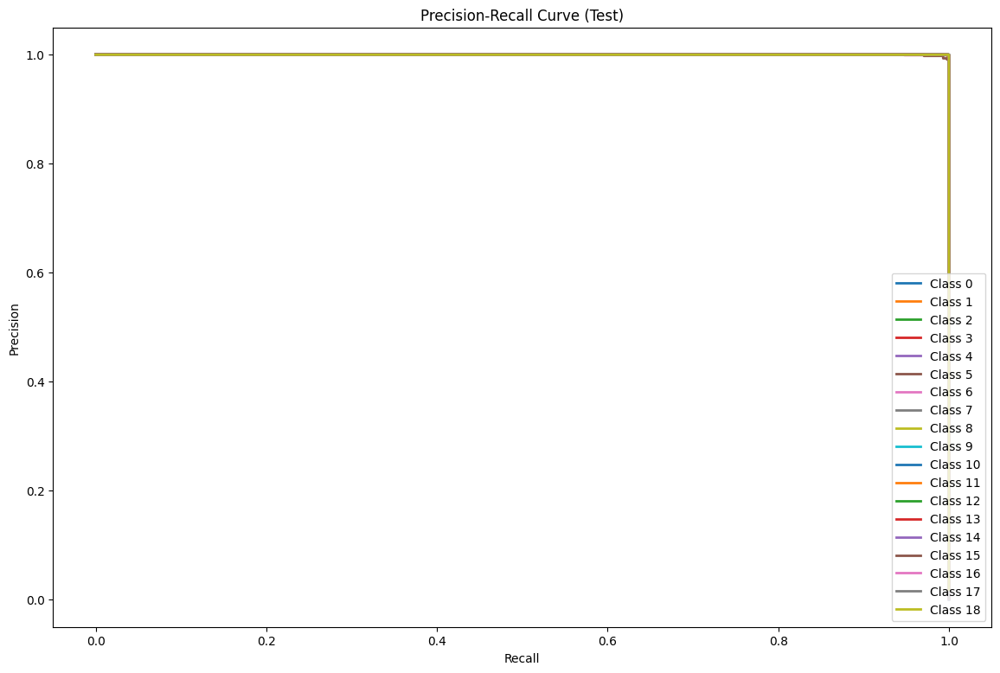


Metrics (Test):
Accuracy: 99.954580%
Precision: 97.965451%
Recall: 99.976502%
F1 Score: 98.870917%
Loss: 0.002992
Elapsed Time: 20.64 seconds


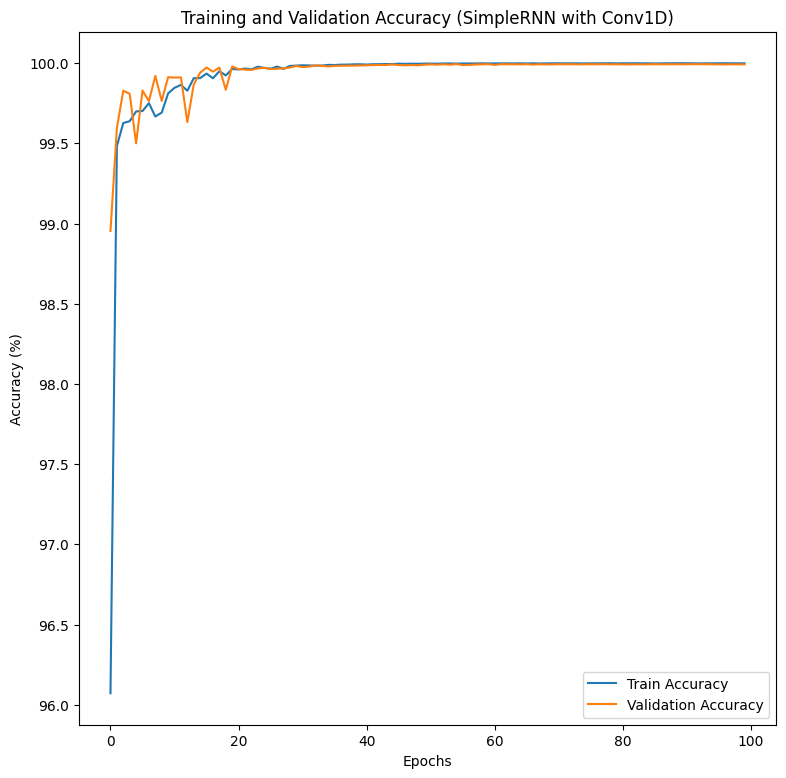

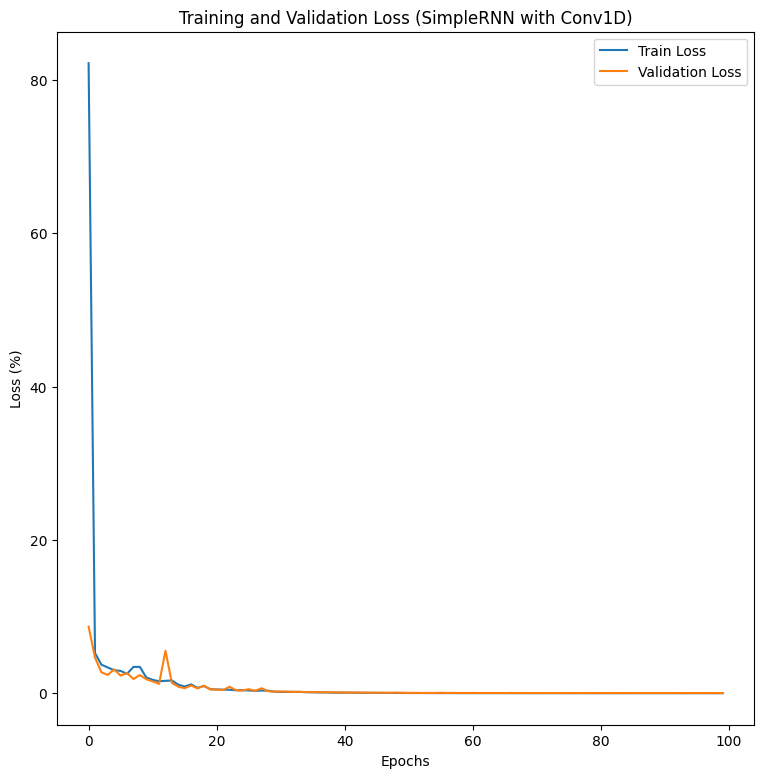

Epoch 1 - Train Loss: 82.1390%, Validation Loss: 8.70%, Train Accuracy: 96.07%, Validation Accuracy: 98.95%
Epoch 2 - Train Loss: 5.2593%, Validation Loss: 4.66%, Train Accuracy: 99.48%, Validation Accuracy: 99.60%
Epoch 3 - Train Loss: 3.7444%, Validation Loss: 2.74%, Train Accuracy: 99.63%, Validation Accuracy: 99.83%
Epoch 4 - Train Loss: 3.3712%, Validation Loss: 2.41%, Train Accuracy: 99.64%, Validation Accuracy: 99.81%
Epoch 5 - Train Loss: 3.0203%, Validation Loss: 3.12%, Train Accuracy: 99.70%, Validation Accuracy: 99.50%
Epoch 6 - Train Loss: 2.9303%, Validation Loss: 2.31%, Train Accuracy: 99.70%, Validation Accuracy: 99.83%
Epoch 7 - Train Loss: 2.5527%, Validation Loss: 2.66%, Train Accuracy: 99.75%, Validation Accuracy: 99.76%
Epoch 8 - Train Loss: 3.4487%, Validation Loss: 1.87%, Train Accuracy: 99.67%, Validation Accuracy: 99.92%
Epoch 9 - Train Loss: 3.4558%, Validation Loss: 2.39%, Train Accuracy: 99.69%, Validation Accuracy: 99.76%
Epoch 10 - Train Loss: 2.0764%, Vali

In [ ]:

def evaluate_model(model, X, y_one_hot, num_classes, dataset_name="Validation"):
    start_time = time.time()
    y_pred_proba = model.predict(X)
    end_time = time.time()
    elapsed_time = end_time - start_time

    y_pred = np.argmax(y_pred_proba, axis=1)
    y_true = np.argmax(y_one_hot, axis=1)


    print(f"\nClassification Report ({dataset_name}):")
    print(classification_report(y_true, y_pred, digits=6))


    conf_matrix = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(14, 14))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({dataset_name})')
    plt.show()



    y_true_bin = label_binarize(y_true, classes=np.arange(num_classes))


    plt.figure(figsize=(9, 9))
    for i in range(num_classes):
        fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_proba[:, i])
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, lw=2, label=f'Class {i} (area = {roc_auc:.4f})')
    plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'Receiver Operating Characteristic ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()


    plt.figure(figsize=(14, 9))
    for i in range(num_classes):
        precision, recall, _ = precision_recall_curve(y_true_bin[:, i], y_pred_proba[:, i])
        plt.plot(recall, precision, lw=2, label=f'Class {i}')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.title(f'Precision-Recall Curve ({dataset_name})')
    plt.legend(loc="lower right")
    plt.show()



    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred, average='macro')
    recall = recall_score(y_true, y_pred, average='macro')
    f1 = f1_score(y_true, y_pred, average='macro')
    loss = model.evaluate(X, y_one_hot, verbose=0)

    print(f"\nMetrics ({dataset_name}):")
    print(f"Accuracy: {accuracy * 100:.6f}%")
    print(f"Precision: {precision * 100:.6f}%")
    print(f"Recall: {recall * 100:.6f}%")
    print(f"F1 Score: {f1 * 100:.6f}%")
    print(f"Loss: {loss[0]:.6f}")
    print(f"Elapsed Time: {elapsed_time:.2f} seconds")


evaluate_model(model_rnn_cnn, X_TON_IOT_valid, y_TON_IOT_valid_one_hot, num_classes=19, dataset_name="Validation")
evaluate_model(model_rnn_cnn, X_TON_IOT_test2, y_TON_IOT_test2_one_hot, num_classes=19, dataset_name="Test")



plt.figure(figsize=(9, 9))
plt.plot(np.array(history_rnn_cnn.history['accuracy']) * 100, label='Train Accuracy')
plt.plot(np.array(history_rnn_cnn.history['val_accuracy']) * 100, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training and Validation Accuracy (SimpleRNN with Conv1D)')
plt.legend()
plt.show()



plt.figure(figsize=(9, 9))
plt.plot(np.array(history_rnn_cnn.history['loss']) * 100, label='Train Loss')
plt.plot(np.array(history_rnn_cnn.history['val_loss']) * 100, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss (%)')
plt.title('Training and Validation Loss (SimpleRNN with Conv1D)')
plt.legend()
plt.show()




for epoch, (loss, val_loss, accuracy, val_accuracy) in enumerate(zip(history_rnn_cnn.history['loss'],
                                                                      history_rnn_cnn.history['val_loss'],
                                                                      history_rnn_cnn.history['accuracy'],
                                                                      history_rnn_cnn.history['val_accuracy']), 1):
    print(f"Epoch {epoch} - Train Loss: {loss * 100:.4f}%, Validation Loss: {val_loss * 100:.2f}%, Train Accuracy: {accuracy * 100:.2f}%, Validation Accuracy: {val_accuracy * 100:.2f}%")

In [ ]:
import pickle
with open('history_rnn_cnn.pkl', 'wb') as file:
    pickle.dump(history_rnn_cnn.history, file)

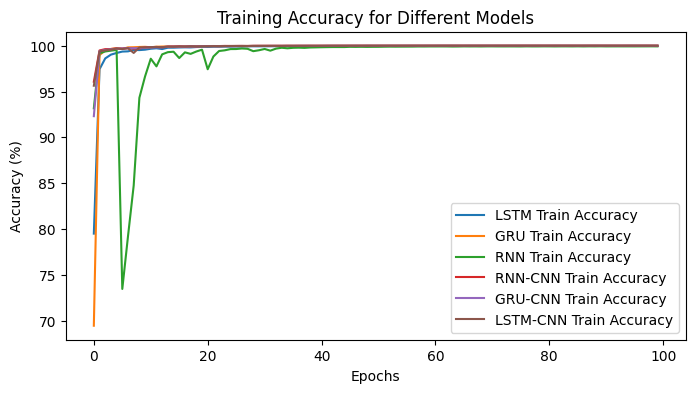

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pickle

# Load the history objects for different models
with open('history_lstm.pkl', 'rb') as file:
    history_lstm = pickle.load(file)
with open('history_gru.pkl', 'rb') as file:
    history_gru = pickle.load(file)
with open('history_rnn.pkl', 'rb') as file:
    history_rnn = pickle.load(file)
with open('history_rnn_cnn.pkl', 'rb') as file:
    history_rnn_cnn = pickle.load(file)
with open('history_gru_cnn.pkl', 'rb') as file:
    history_gru_cnn = pickle.load(file)
with open('history_lstm_cnn.pkl', 'rb') as file:
    history_lstm_cnn = pickle.load(file)

# Plotting the training accuracy curves
plt.figure(figsize=(8, 4))
plt.plot(np.array(history_lstm['accuracy']) * 100, label='LSTM Train Accuracy')
plt.plot(np.array(history_gru['accuracy']) * 100, label='GRU Train Accuracy')
plt.plot(np.array(history_rnn['accuracy']) * 100, label='RNN Train Accuracy')
plt.plot(np.array(history_rnn_cnn['accuracy']) * 100, label='RNN-CNN Train Accuracy')
plt.plot(np.array(history_gru_cnn['accuracy']) * 100, label='GRU-CNN Train Accuracy')
plt.plot(np.array(history_lstm_cnn['accuracy']) * 100, label='LSTM-CNN Train Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy (%)')
plt.title('Training Accuracy for Different Models')
plt.legend()
plt.show()



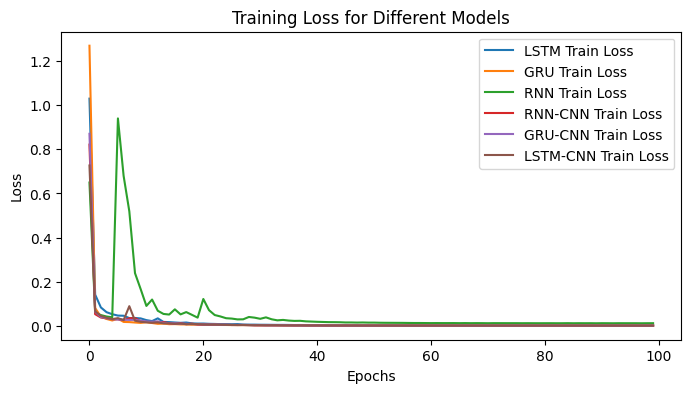

In [ ]:
# Plotting the training loss curves
plt.figure(figsize=(8, 4))
plt.plot(history_lstm['loss'], label='LSTM Train Loss')
plt.plot(history_gru['loss'], label='GRU Train Loss')
plt.plot(history_rnn['loss'], label='RNN Train Loss')
plt.plot(history_rnn_cnn['loss'], label='RNN-CNN Train Loss')
plt.plot(history_gru_cnn['loss'], label='GRU-CNN Train Loss')
plt.plot(history_lstm_cnn['loss'], label='LSTM-CNN Train Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Training Loss for Different Models')
plt.legend()
plt.show()

